In [30]:
import gym
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from gym import spaces
from collections import defaultdict
import pickle

In [9]:
class Warehouse_robot(gym.Env):
    def __init__(self):
        super(Warehouse_robot, self).__init__()

        self.grid_size = 6
        self.start_position = (0, 0)
        self.item_position = (2, 2)
        self.dropoff_position = (5, 5)
        self.robot_pos = self.start_position
        self.carrying = False
        self.obstacles = [(1, 3), (2, 4), (3, 2), (4, 3)]
        self.action_space = spaces.Discrete(6)
        self.observation_space = spaces.MultiDiscrete([self.grid_size, self.grid_size, 2])
        self.idle_agent_image = mpimg.imread("idle_agent.jpg")
        self.agent_carrying_package_image = mpimg.imread("agent_carrying_package.jpg")
        self.obstacle_img = mpimg.imread("obstacle.jpg")
        self.item_package_image = mpimg.imread("package.jpg")
        self.white_background_image = mpimg.imread("white_background.png")

    def reset(self):
        self.robot_pos = self.start_position
        self.carrying = False
        return np.array([self.robot_pos[0], self.robot_pos[1], int(self.carrying)])

    def step(self, action):
        a, b = self.robot_pos
        done = False  # Ensure `done` is always initialized
        
        if action == 0 and b > 0:
            b -= 1
        elif action == 1 and b < self.grid_size - 1:
            b += 1
        elif action == 2 and a > 0:
            a -= 1
        elif action == 3 and a < self.grid_size - 1:
            a += 1

        if (a, b) in self.obstacles:
            a, b = self.robot_pos
            r = -20
        else:
            r = -1

        if action == 4 and (a, b) == self.item_position and not self.carrying:
            self.carrying = True
            r = 25
        elif action == 5 and (a, b) == self.dropoff_position and self.carrying:
            r = 100
            done = True  # Mark as complete when the item is delivered
        
        self.robot_pos = (a, b)
        
        return np.array([a, b, int(self.carrying)]), r, done, {}


    def render(self):
        figure, axis = plt.subplots(figsize=(5, 5))
        axis.imshow(self.white_background_image)

        for (ox, oy) in self.obstacles:
            axis.imshow(self.obstacle_img, extent=[ox, ox + 1, oy, oy + 1])
            
        if not self.carrying:
            ix, iy = self.item_position
            axis.imshow(self.item_package_image, extent=[ix, ix + 1, iy, iy + 1])
        rx, ry = self.robot_pos
        if self.carrying:
            axis.imshow(self.agent_carrying_package_image, extent=[rx, rx + 1, ry, ry + 1])
        else:
            axis.imshow(self.idle_agent_image, extent=[rx, rx + 1, ry, ry + 1])
        plt.xlim(0, self.grid_size)
        plt.ylim(0, self.grid_size)
        plt.grid()
        plt.show()


Step: 1
  Action Taken: Left
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



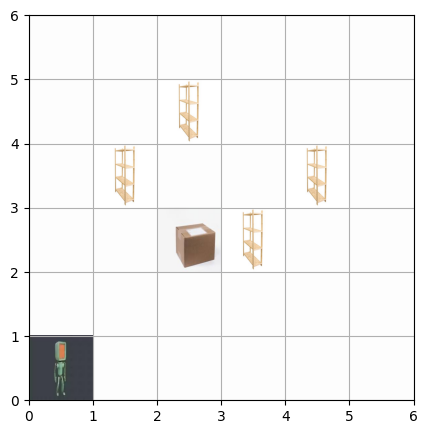

Step: 2
  Action Taken: Up
  Current State: Position=[0 1], Carrying Item=False
  Reward: -1
  Done: False



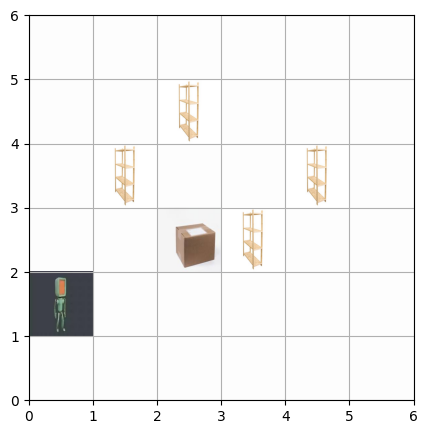

Step: 3
  Action Taken: Right
  Current State: Position=[1 1], Carrying Item=False
  Reward: -1
  Done: False



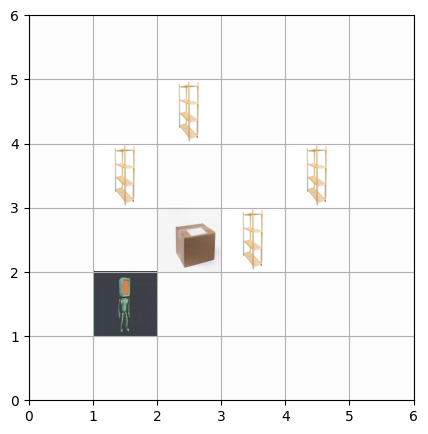

Step: 4
  Action Taken: Drop-off
  Current State: Position=[1 1], Carrying Item=False
  Reward: -1
  Done: False



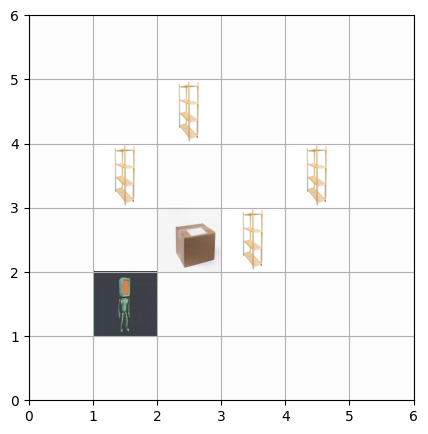

Step: 5
  Action Taken: Drop-off
  Current State: Position=[1 1], Carrying Item=False
  Reward: -1
  Done: False



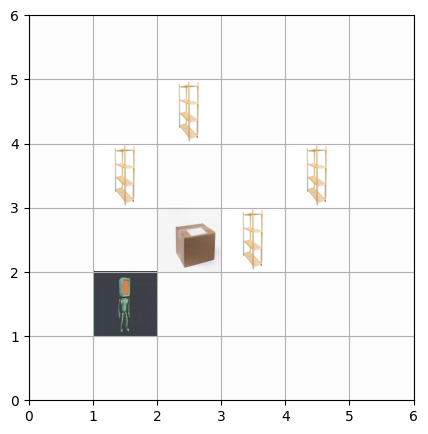

Step: 6
  Action Taken: Right
  Current State: Position=[2 1], Carrying Item=False
  Reward: -1
  Done: False



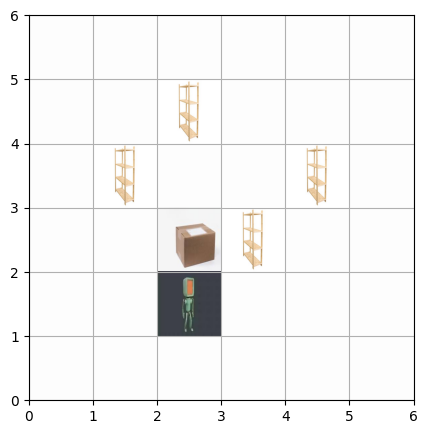

Step: 7
  Action Taken: Up
  Current State: Position=[2 2], Carrying Item=False
  Reward: -1
  Done: False



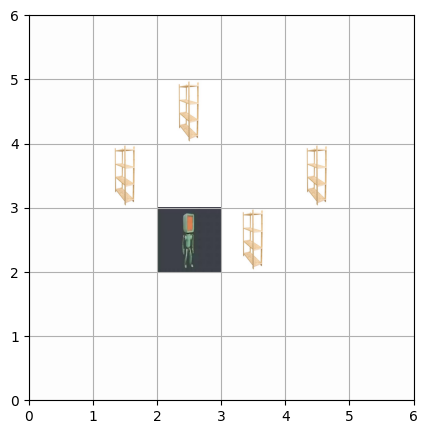

Step: 8
  Action Taken: Up
  Current State: Position=[2 3], Carrying Item=False
  Reward: -1
  Done: False



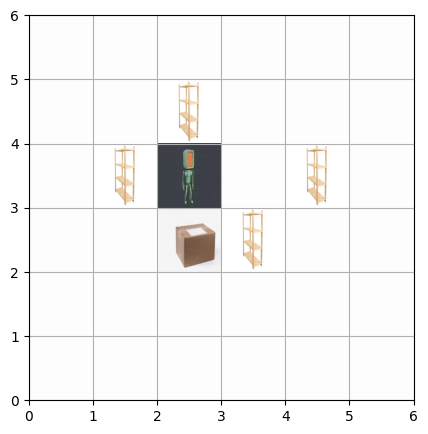

Step: 9
  Action Taken: Left
  Current State: Position=[2 3], Carrying Item=False
  Reward: -20
  Done: False



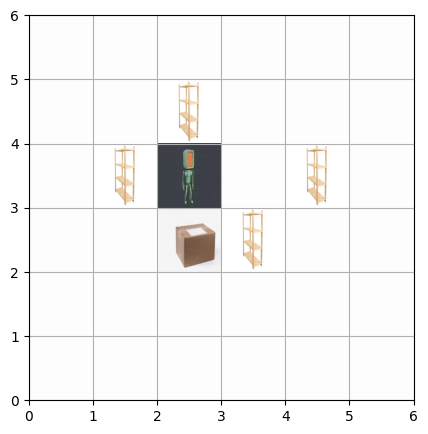

Step: 10
  Action Taken: Left
  Current State: Position=[2 3], Carrying Item=False
  Reward: -20
  Done: False



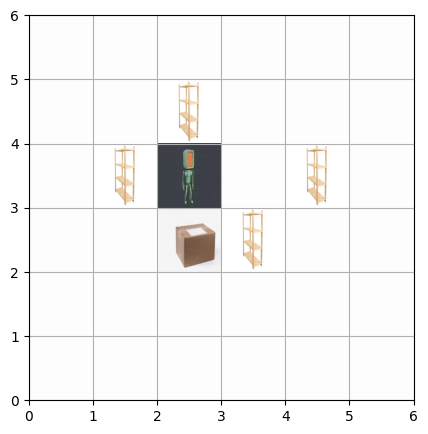

In [10]:
environment = Warehouse_robot()
initial_state = environment.reset()
mapped_actions = {1: "Up", 0: "Down", 2: "Left", 3: "Right", 4: "Pick-up", 5: "Drop-off"}

for step in range(10):
    action = environment.action_space.sample()
    next_state, r, finished, _ = environment.step(action)
    print(f"Step: {step + 1}")
    print(f"  Action Taken: {mapped_actions[action]}")
    print(f"  Current State: Position={next_state[:2]}, Carrying Item={bool(next_state[2])}")
    print(f"  Reward: {r}")
    print(f"  Done: {finished}\n")
    environment.render()
    if finished:
        print("Task completed! The robot successfully delivered the item.")
        break

In [23]:
class Stochastic_warehouse(gym.Env):
    def __init__(self):
        super(Stochastic_warehouse, self).__init__()
        self.grid_size = 6
        self.start_position = (0, 0)
        self.item_position = (2, 2)
        self.dropoff_position = (5, 5)
        self.robot_start_position = self.start_position
        self.carrying = False
        self.obstacles = [(1, 3), (2, 4), (3, 2), (4, 3)]
        self.dynamic_obstacles = [(0, 5), (3, 4)]  
        self.action_space = spaces.Discrete(6)
        self.observation_set = spaces.MultiDiscrete([self.grid_size, self.grid_size, 2])
        self.agent_idle_img = mpimg.imread("idle_agent.jpg")
        self.agent_carrying_img = mpimg.imread("agent_carrying_package.jpg")
        self.obstacle_img = mpimg.imread("obstacle.jpg")
        self.item_img = mpimg.imread("package.jpg")
        self.white_background_image = mpimg.imread("white_background.png")

    def reset(self):
        self.robot_start_position = self.start_position
        self.carrying = False
        return np.array([self.robot_start_position[0], self.robot_start_position[1], int(self.carrying)])

    def step(self, action):
        a, b = self.robot_start_position
        stochastic_nature = 0.1
        finished = False  # Initialize 'finished' at the start
        
        if action in [0, 1, 2, 3]:
            if random.uniform(0, 1) > stochastic_nature:
                if action == 0 and b > 0:
                    b -= 1
                elif action == 1 and b < self.grid_size - 1:
                    b += 1
                elif action == 2 and a > 0:
                    a -= 1
                elif action == 3 and a < self.grid_size - 1:
                    a += 1

        if (a, b) in self.obstacles or (a, b) in self.dynamic_obstacles:
            a, b = self.robot_start_position
            r = -20
        else:
            r = -1

        if action == 4 and (a, b) == self.item_position and not self.carrying:
            self.carrying = True
            r = 25
        elif action == 5 and (a, b) == self.dropoff_position and self.carrying:
            r = 100
            finished = True  # Now 'finished' is always defined before being used

        self.robot_start_position = (a, b)
        return np.array([a, b, int(self.carrying)]), r, finished, {}


    def render(self):
        figure, axis = plt.subplots(figsize=(6, 6))
        axis.set_xticks(range(self.grid_size + 1))
        axis.set_yticks(range(self.grid_size + 1))
        axis.grid(True)
        axis.set_xlim(0, self.grid_size)
        axis.set_ylim(0, self.grid_size)

        for obs in self.obstacles:
            axis.imshow(self.obstacle_img, extent=[obs[0], obs[0] + 1, obs[1], obs[1] + 1])
        for obs in self.dynamic_obstacles:
            axis.imshow(self.obstacle_img, extent=[obs[0], obs[0] + 1, obs[1], obs[1] + 1])
        axis.imshow(self.item_img, extent=[self.item_position[0], self.item_position[0] + 1, self.item_position[1], self.item_position[1] + 1])
        axis.imshow(self.item_img, extent=[self.dropoff_position[0], self.dropoff_position[0] + 1, self.dropoff_position[1], self.dropoff_position[1] + 1])
        agent_image = self.agent_carrying_img if self.carrying else self.agent_idle_img
        axis.imshow(agent_image, extent=[self.robot_start_position[0], self.robot_start_position[0] + 1, self.robot_start_position[1], self.robot_start_position[1] + 1])
        plt.show()


Step 1: Action = Left, State = [0 0 0], Reward = -1, Done = False


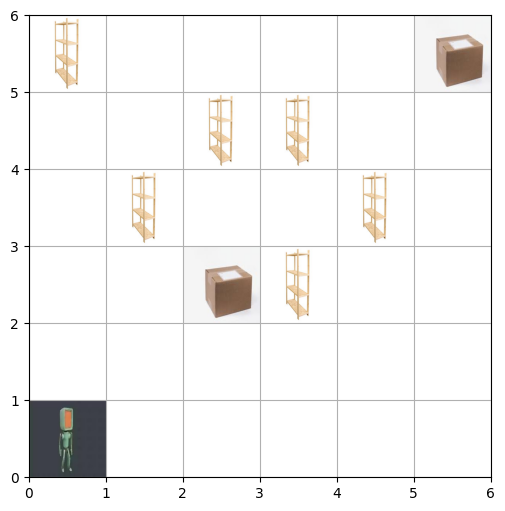

Step 2: Action = Left, State = [0 0 0], Reward = -1, Done = False


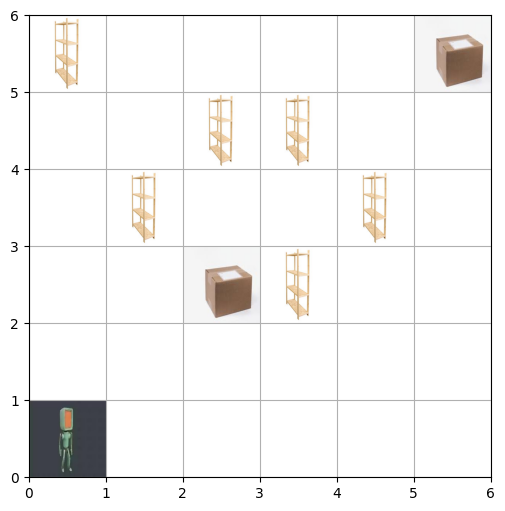

Step 3: Action = Drop-off, State = [0 0 0], Reward = -1, Done = False


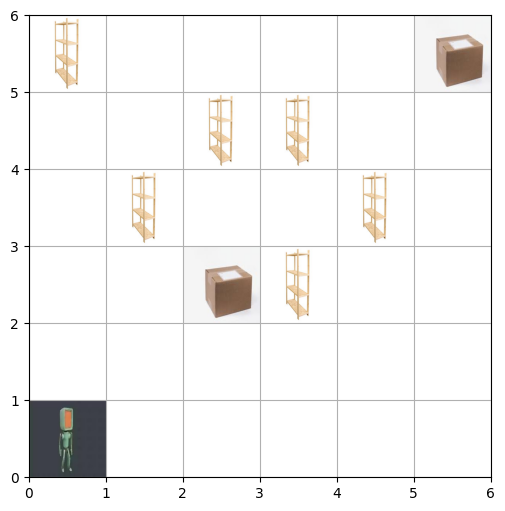

Step 4: Action = Left, State = [0 0 0], Reward = -1, Done = False


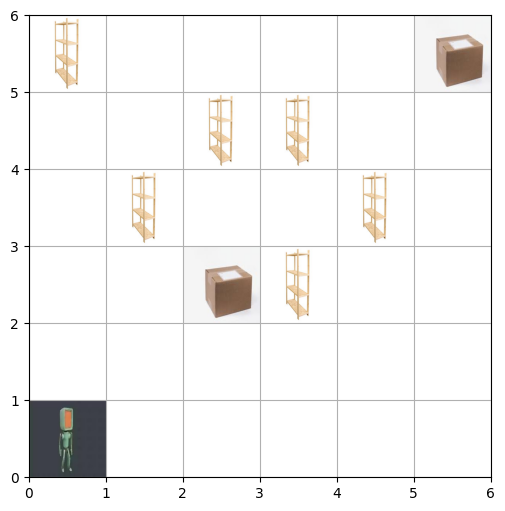

Step 5: Action = Up, State = [0 1 0], Reward = -1, Done = False


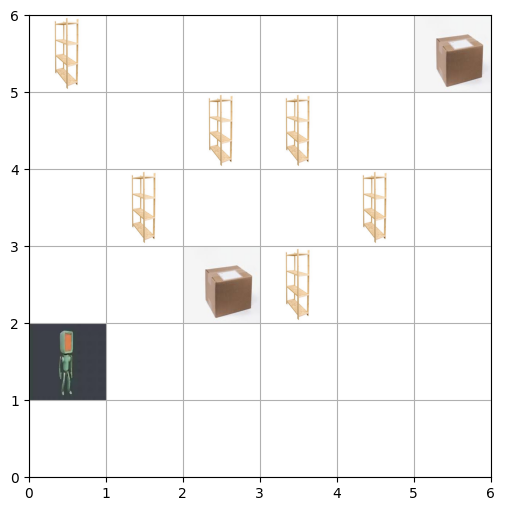

Step 6: Action = Drop-off, State = [0 1 0], Reward = -1, Done = False


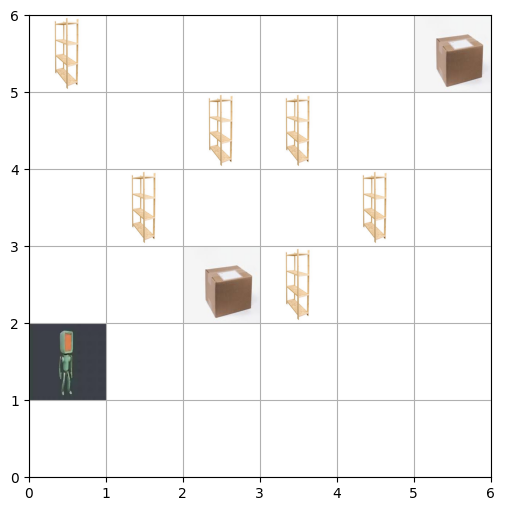

Step 7: Action = Down, State = [0 0 0], Reward = -1, Done = False


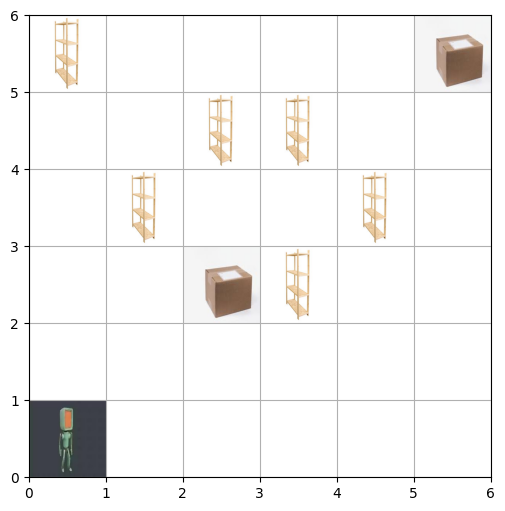

Step 8: Action = Up, State = [0 1 0], Reward = -1, Done = False


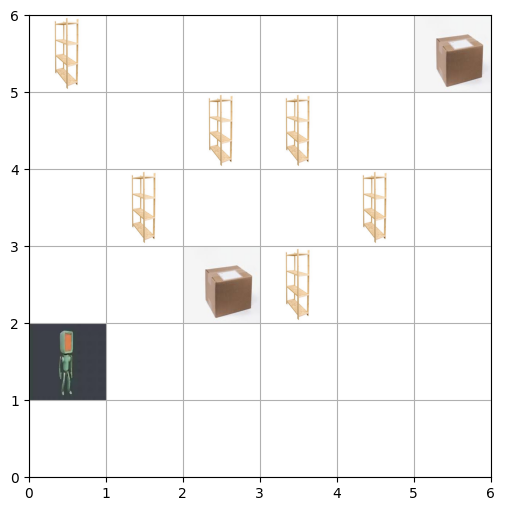

Step 9: Action = Left, State = [0 1 0], Reward = -1, Done = False


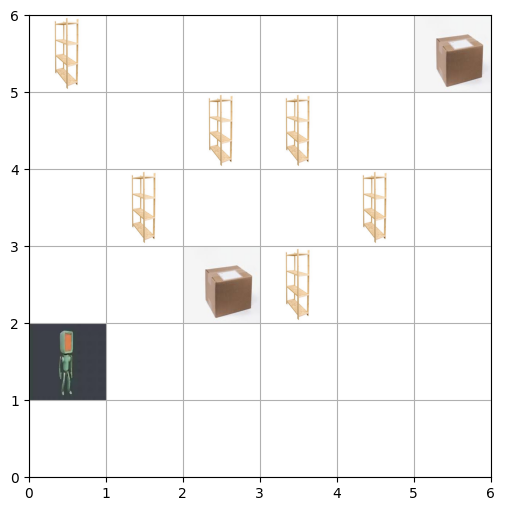

Step 10: Action = Up, State = [0 2 0], Reward = -1, Done = False


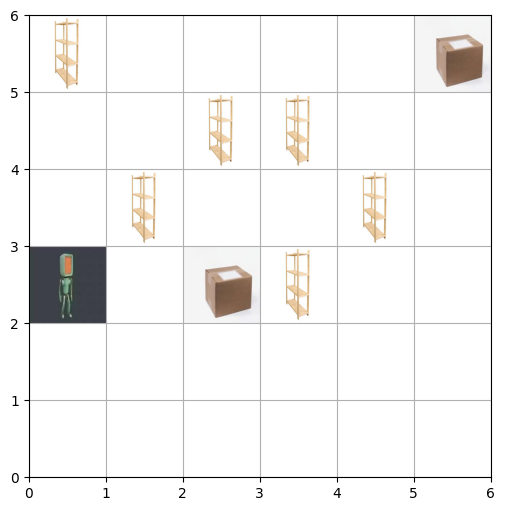

In [24]:
env = Stochastic_warehouse()
state = env.reset()
mapped_actions = {1: "Up", 0: "Down", 2: "Left", 3: "Right", 4: "Pick-up", 5: "Drop-off"}

for step in range(10):
    action = env.action_space.sample()
    next_state, reward, done, _ = env.step(action)
    print(f"Step {step + 1}: Action = {mapped_actions[action]}, State = {next_state}, Reward = {reward}, Done = {done}")
    env.render()
    if done:
        print("Task completed! The robot successfully delivered the item.")
        break

### Q Learning:

### Deterministic environment(Base model):

In [37]:
environment = Warehouse_robot()
gamma = 0.9
alpha = 0.1
epsilon = 0.1
num_episodes = 500

def initialize_q_table():
    return defaultdict(lambda: np.zeros(environment.action_space.n))

Q = initialize_q_table()

print("Initial Q-table:")
print(dict(Q))

def epsilon_greedy_policy(state, epsilon):
    if random.uniform(0, 1) < epsilon:
        return environment.action_space.sample()
    else:
        return np.argmax(Q[state])

def train_q_learning():
    rewards_per_episode = []
    epsilon_values = []
    
    for episode in range(num_episodes):
        state = tuple(environment.reset())
        total_reward = 0
        done = False
        
        while not done:
            action = epsilon_greedy_policy(state, epsilon)
            next_state, reward, done, _ = environment.step(action)
            next_state = tuple(next_state)
            
            best_next_action = np.argmax(Q[next_state])
            Q[state][action] += alpha * (reward + gamma * Q[next_state][best_next_action] - Q[state][action])
            
            state = next_state
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
        epsilon_values.append(epsilon)
        if (episode + 1) % 50 == 0:
            print(f"Episode {episode + 1}, Total Reward: {total_reward}")
    
    return rewards_per_episode, epsilon_values

rewards, epsilon_values = train_q_learning()

print("Trained Q-table:")
print(dict(Q))

# Save the Q-table as a pickle file
with open("q_table.pkl", "wb") as f:
    pickle.dump(dict(Q), f)

print("Q-table saved as q_table.pkl")

Initial Q-table:
{}
Episode 50, Total Reward: 115
Episode 100, Total Reward: 115
Episode 150, Total Reward: 115
Episode 200, Total Reward: 113
Episode 250, Total Reward: 112
Episode 300, Total Reward: 115
Episode 350, Total Reward: 95
Episode 400, Total Reward: 115
Episode 450, Total Reward: 95
Episode 500, Total Reward: 113
Trained Q-table:
{(0, 0, 0): array([ 49.24564564, 317.44711543,  51.56263883,  85.28399749,
        33.01339589,  55.22111999]), (0, 1, 0): array([ 1.02357200e+02, -4.39454188e-02,  9.30321948e+01,  3.54588475e+02,
        3.04673828e+01,  1.08599961e+02]), (1, 0, 0): array([  1.52650496, 249.80110259,  -0.64754864,   3.81208251,
        -0.57655314,  10.90109556]), (1, 1, 0): array([ 56.66000007, 136.03738253, 209.41046298, 395.84096335,
       171.14024645, 173.47583704]), (0, 2, 0): array([-0.40919581, -0.4589209 , -0.385219  , 34.52151784, -0.45008912,
       -0.3940399 ]), (1, 2, 0): array([ 6.93873849e+00,  4.46272941e+01, -2.88910000e-01,  3.41164825e+02,
  

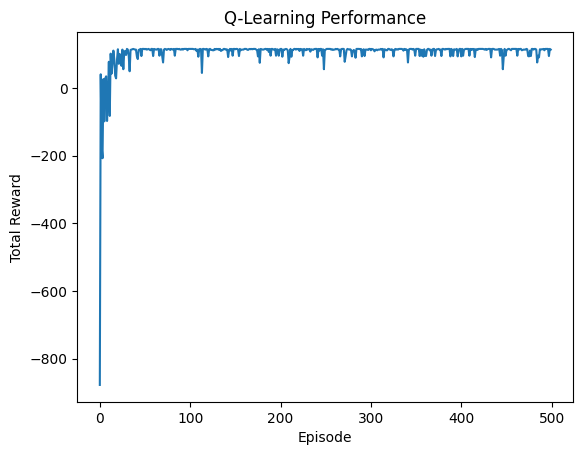

In [38]:
# Plot the total reward per episode
plt.figure()
plt.plot(rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Q-Learning Performance')
plt.show()

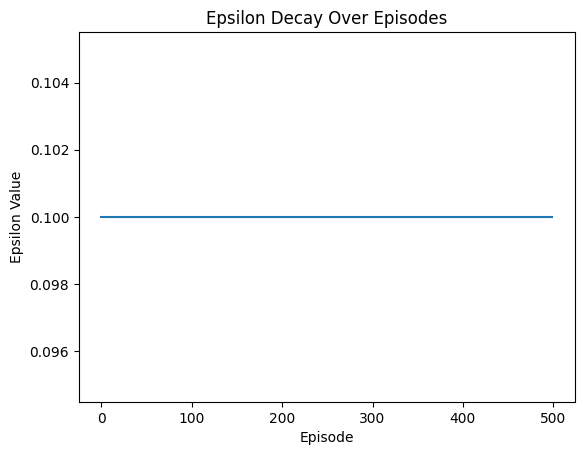

In [39]:
# Plot the epsilon decay
plt.figure()
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Over Episodes')
plt.show()

Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


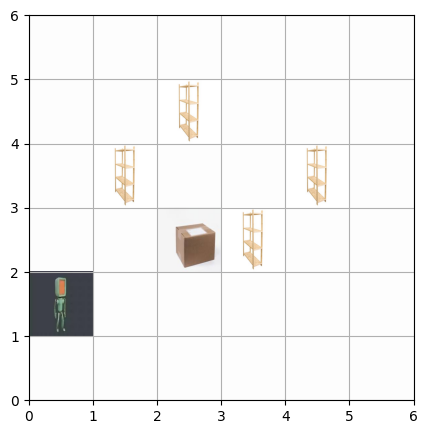

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


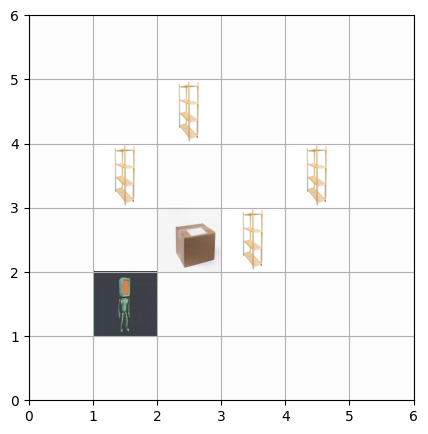

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


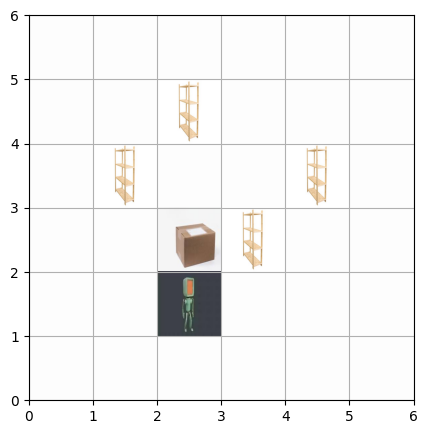

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


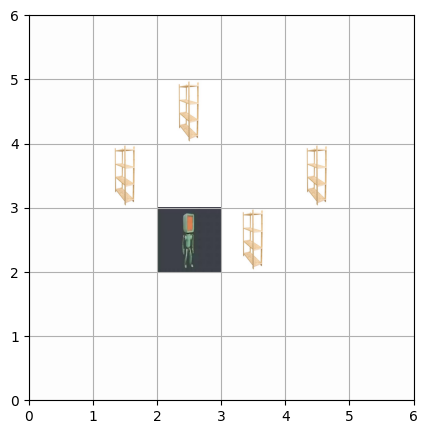

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


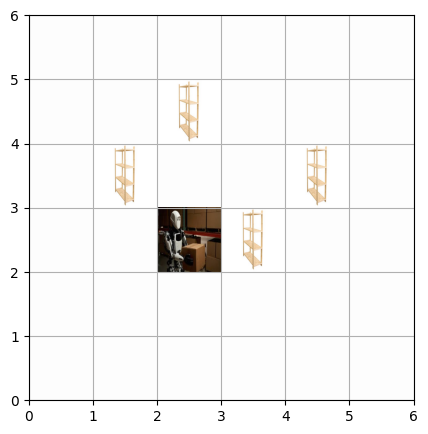

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


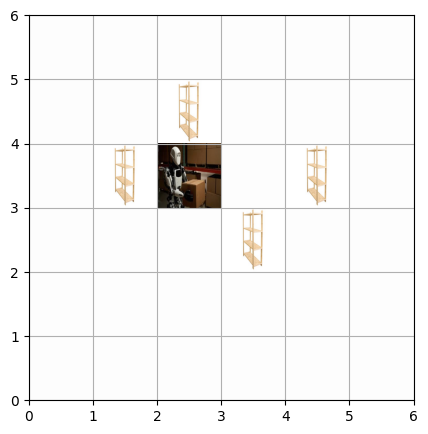

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


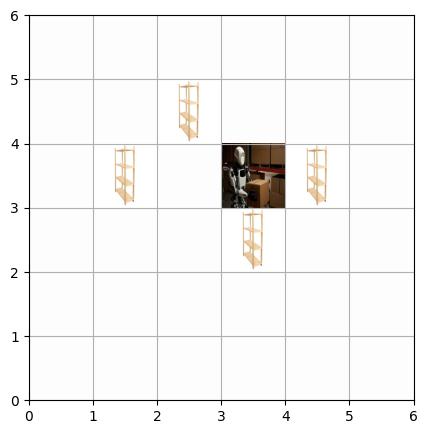

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


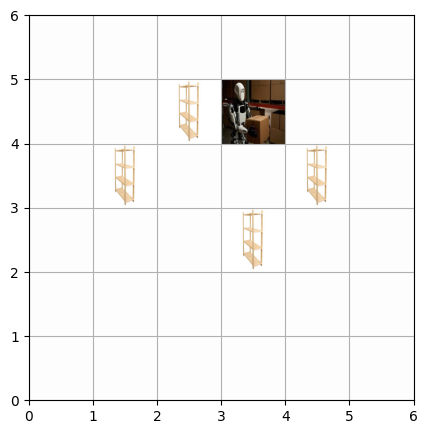

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


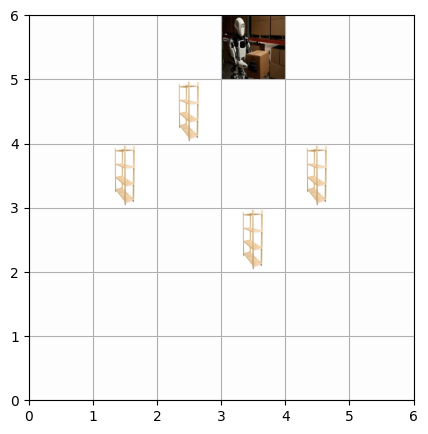

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


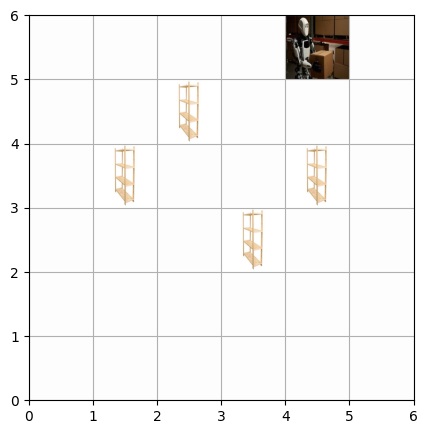

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


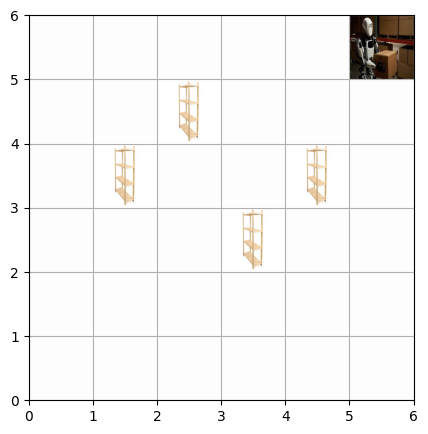

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


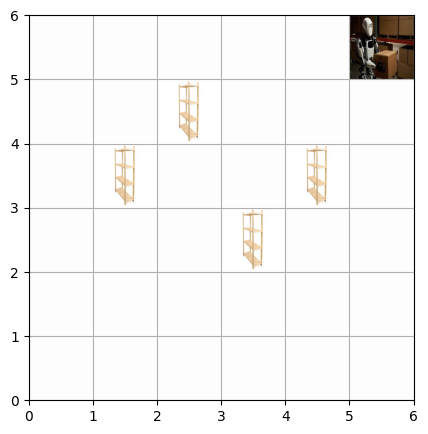

Episode 1: Task completed! Total Reward: 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


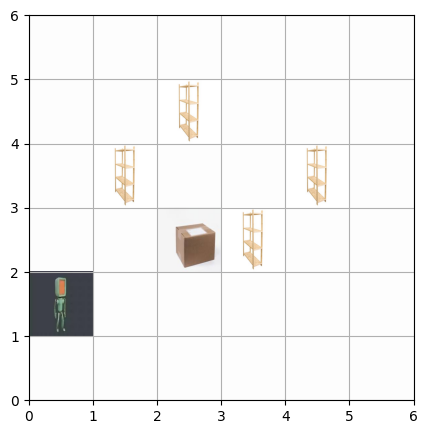

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


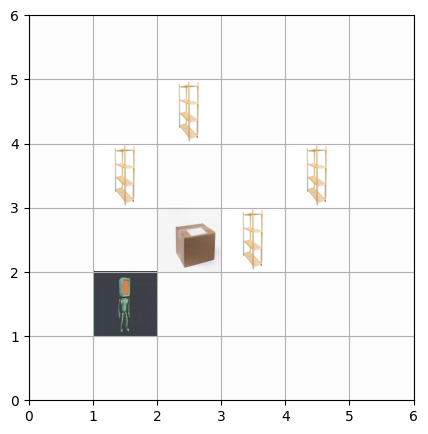

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


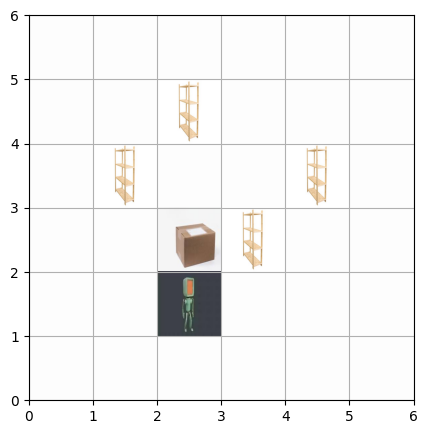

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


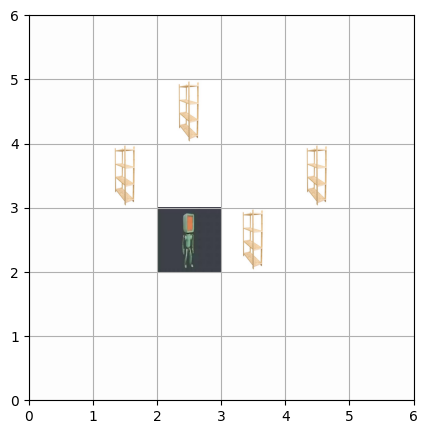

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


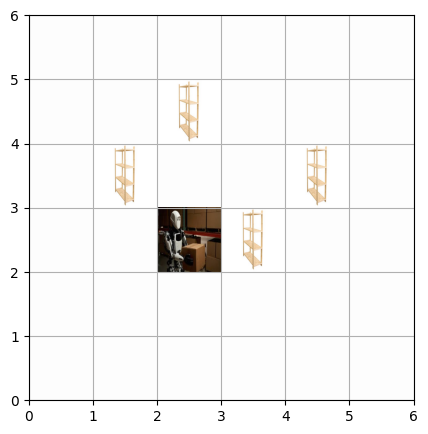

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


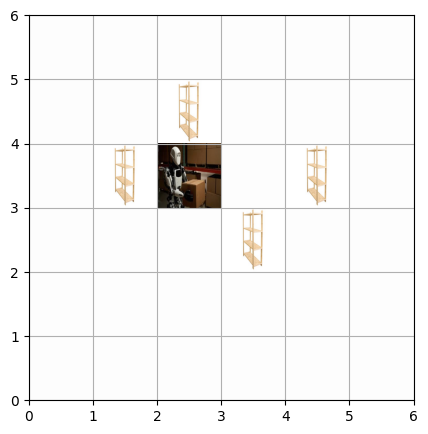

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


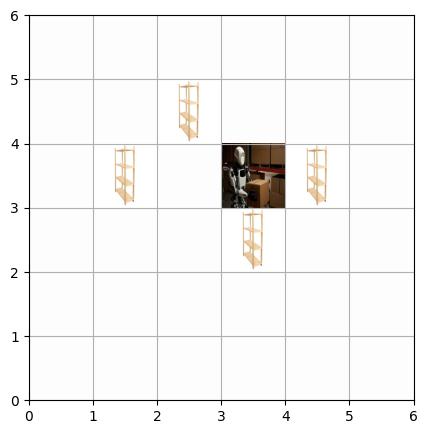

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


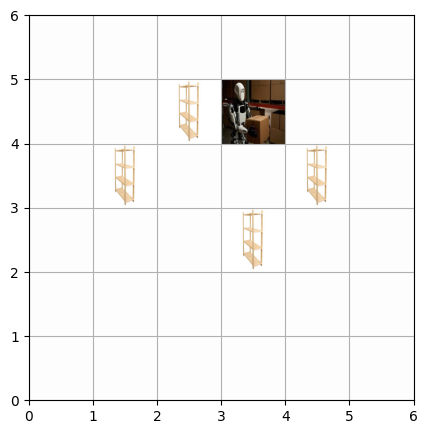

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


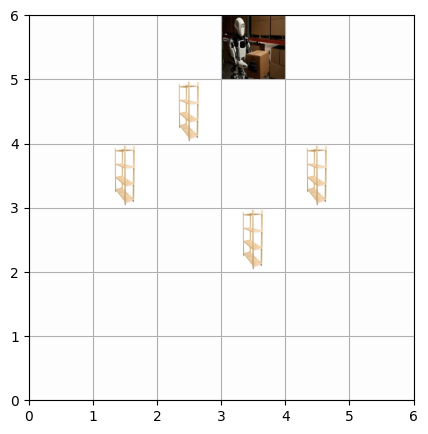

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


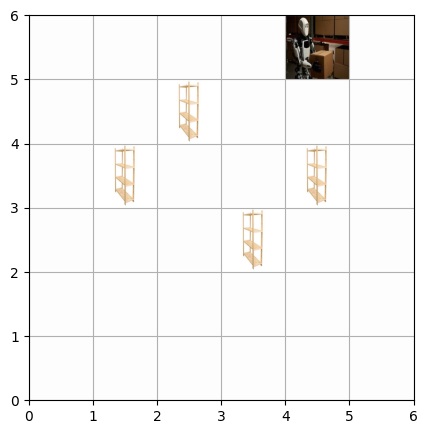

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


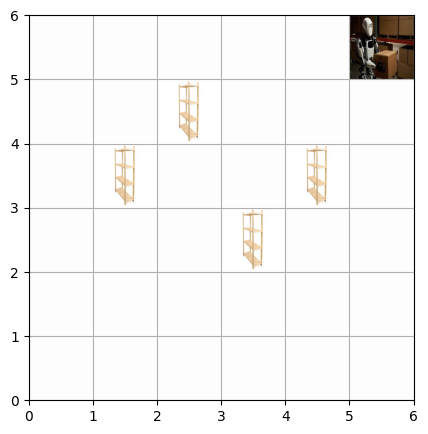

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


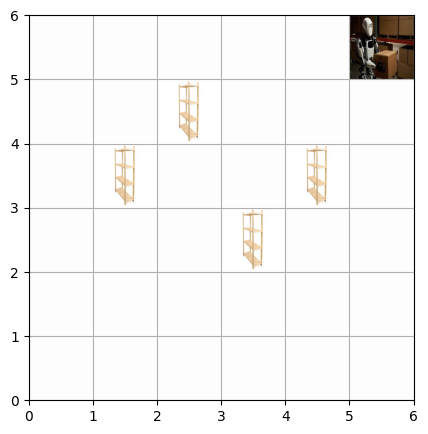

Episode 2: Task completed! Total Reward: 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


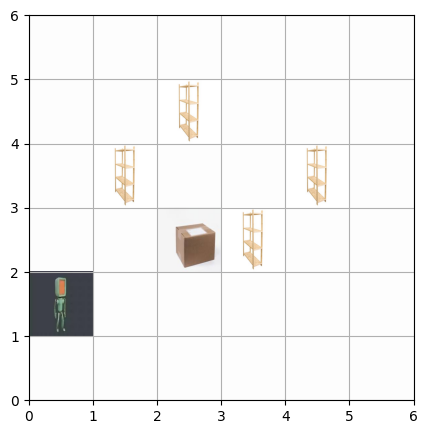

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


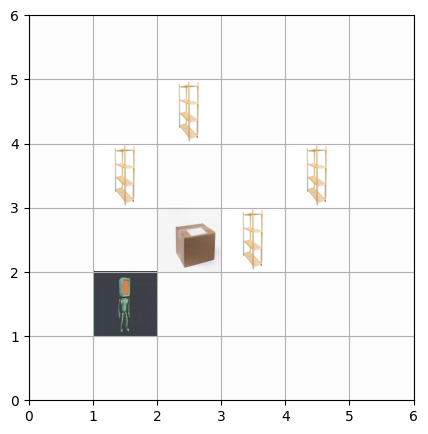

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


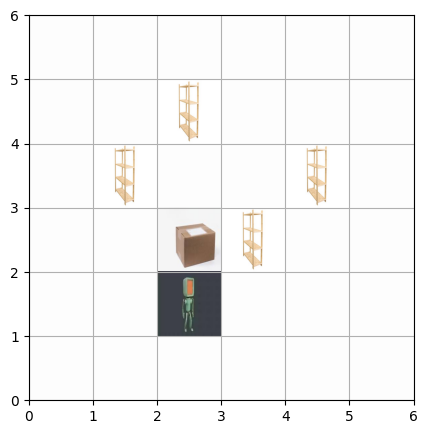

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


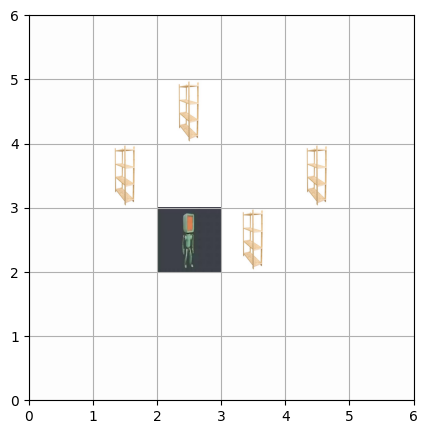

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


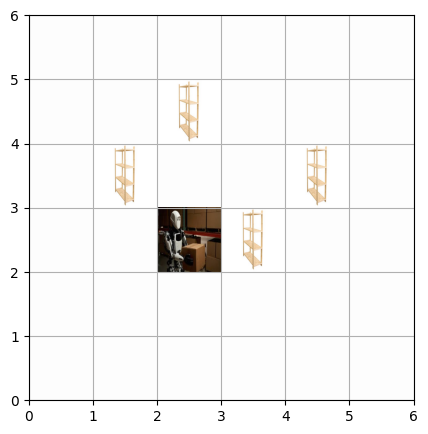

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


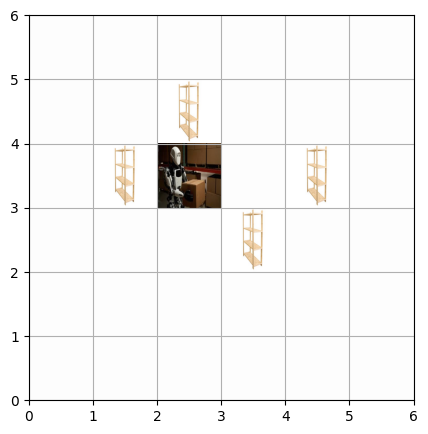

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


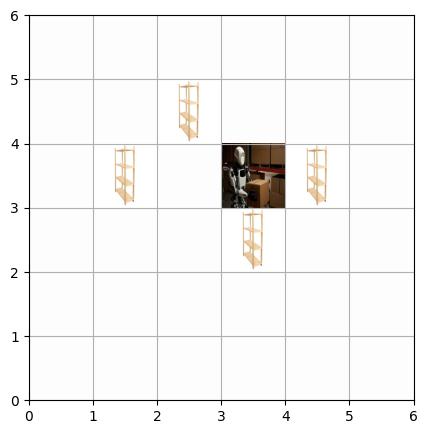

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


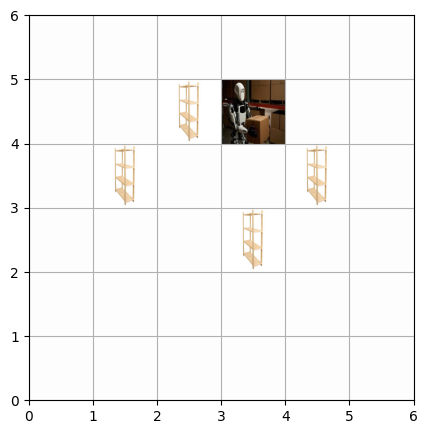

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


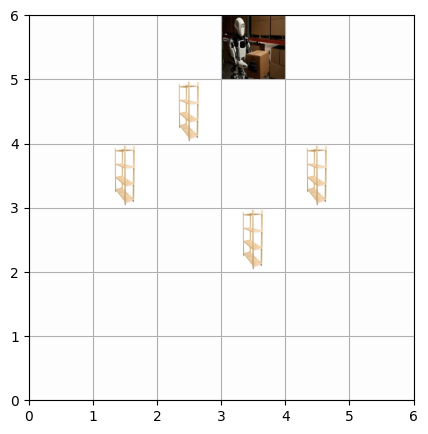

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


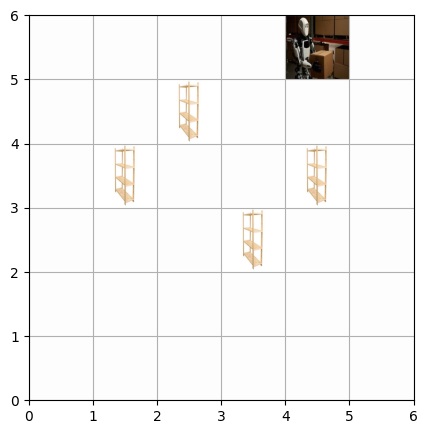

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


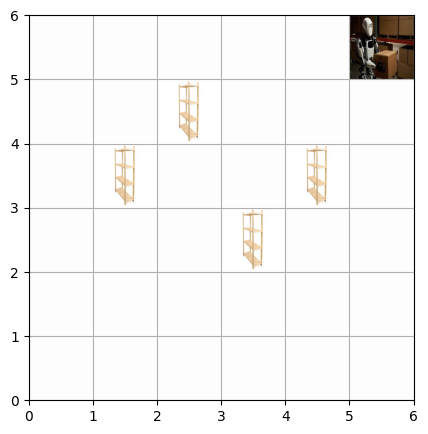

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


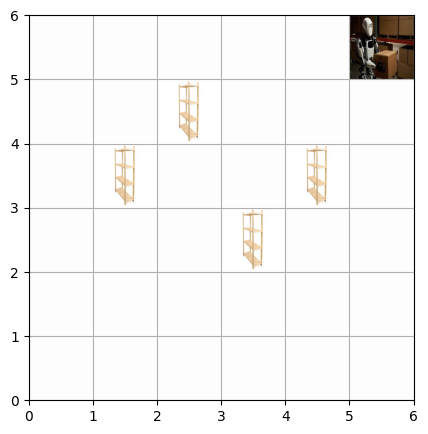

Episode 3: Task completed! Total Reward: 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


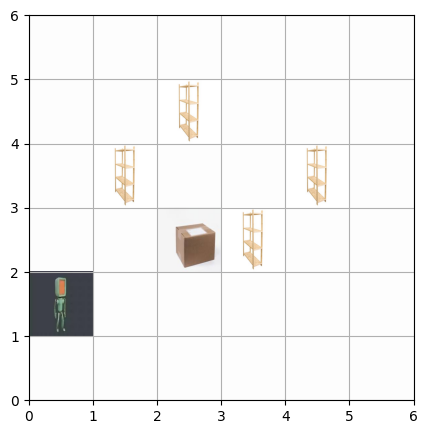

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


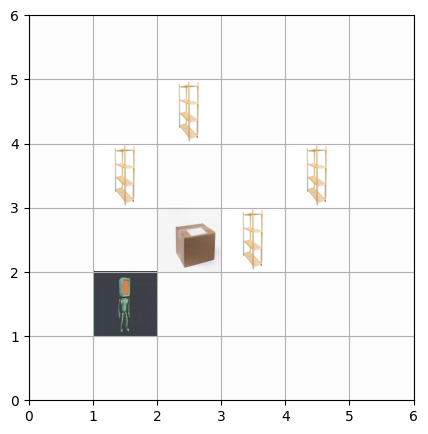

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


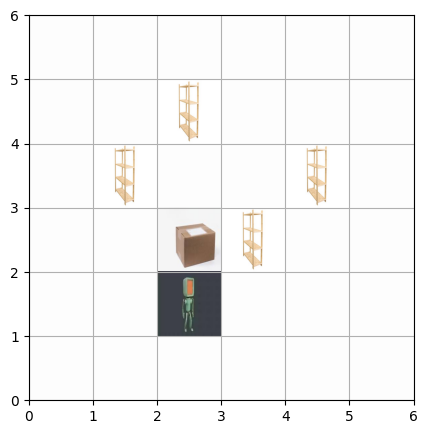

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


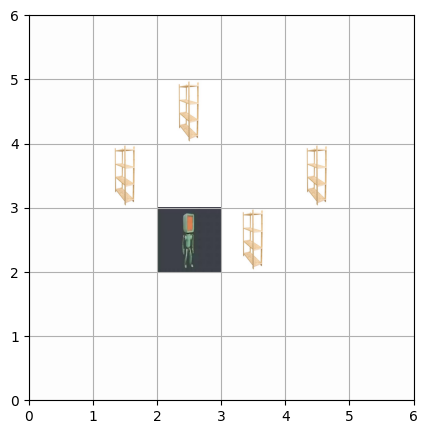

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


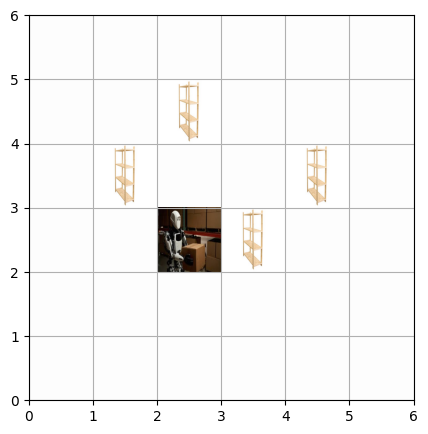

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


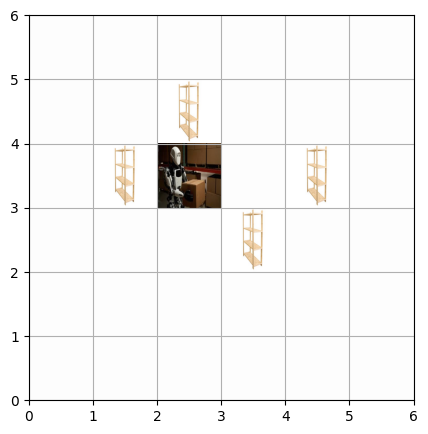

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


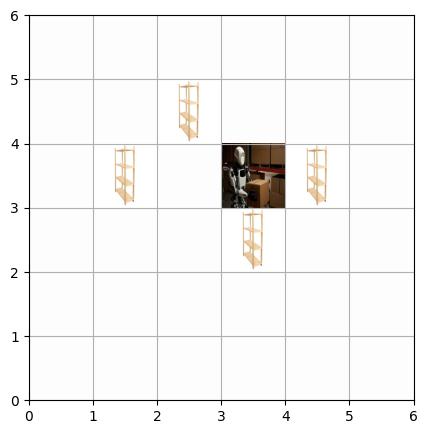

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


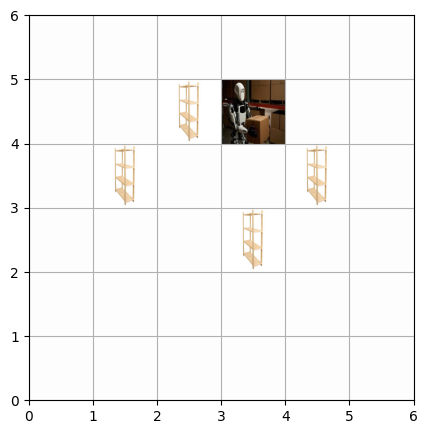

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


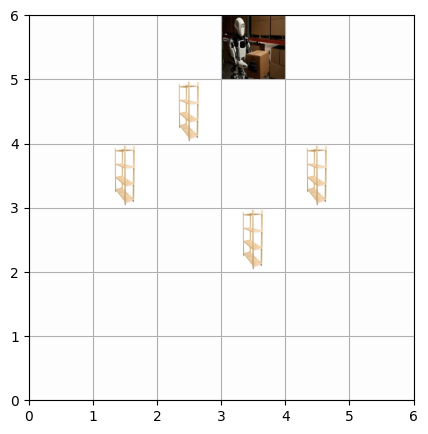

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


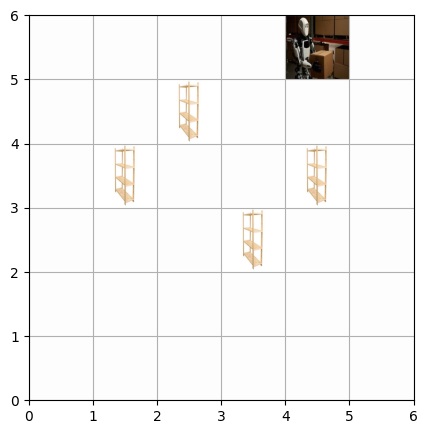

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


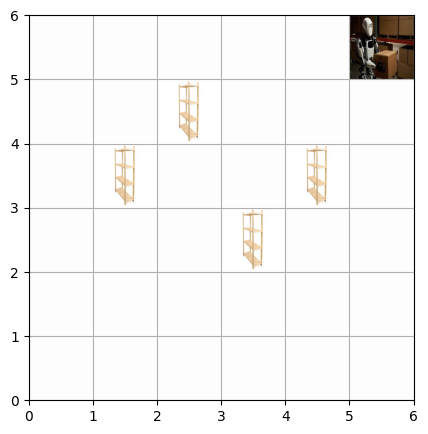

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


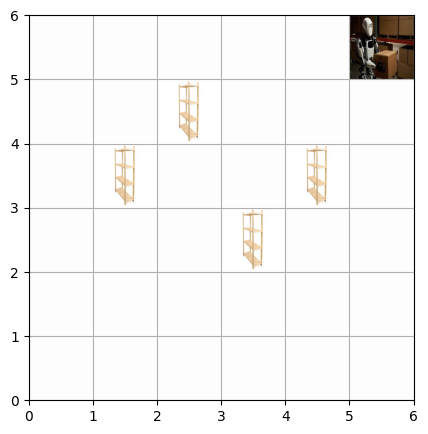

Episode 4: Task completed! Total Reward: 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


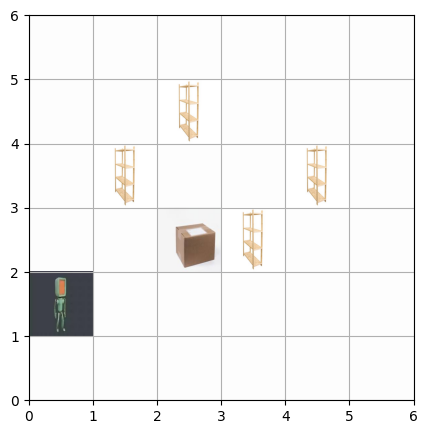

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


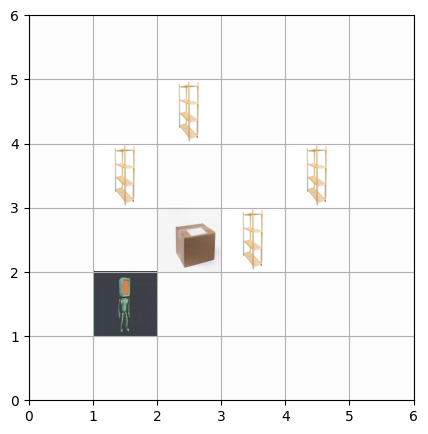

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


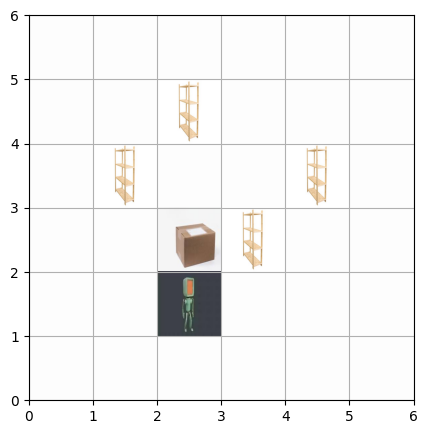

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


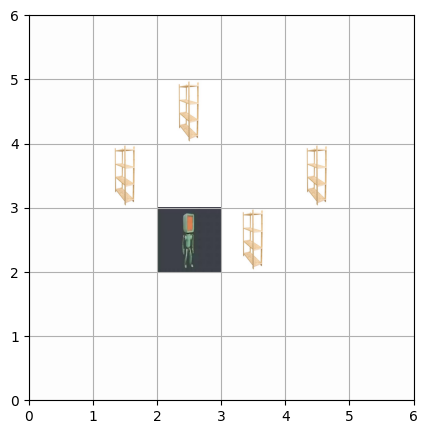

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


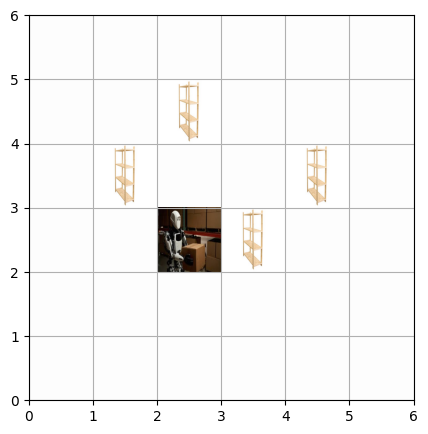

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


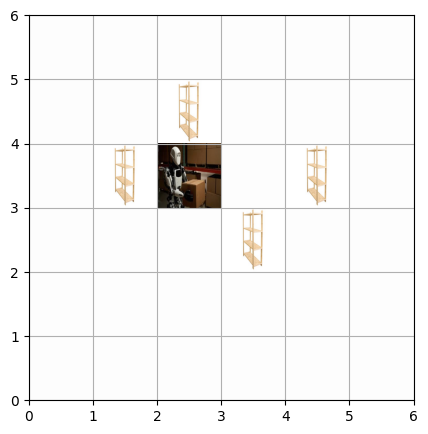

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


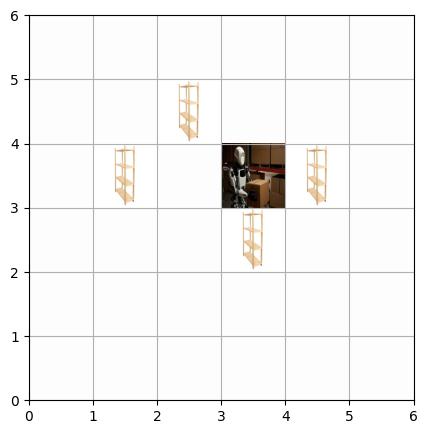

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


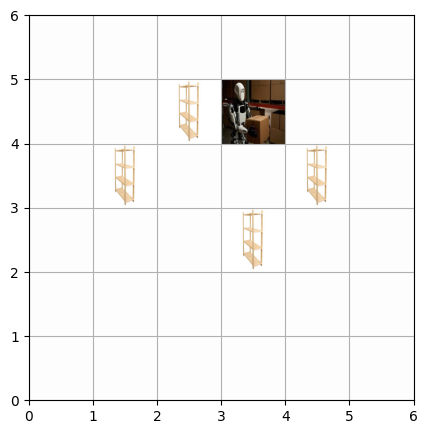

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


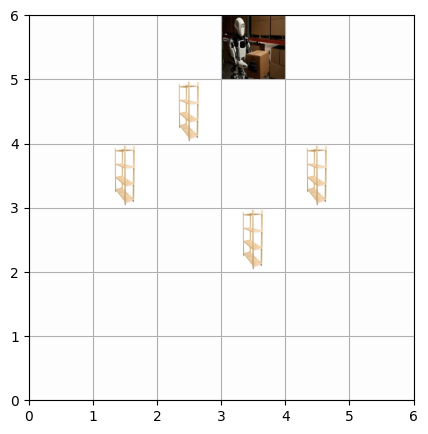

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


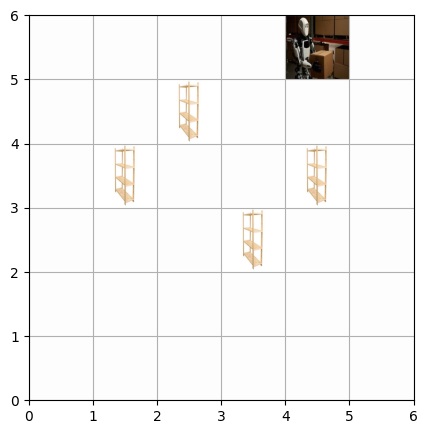

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


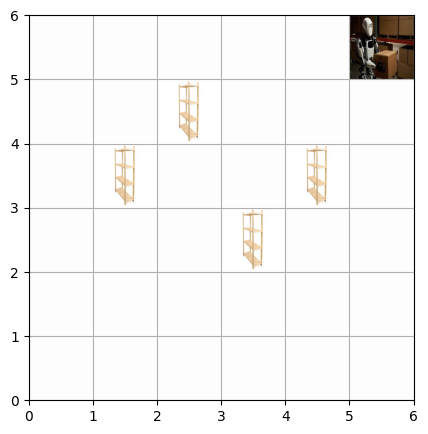

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


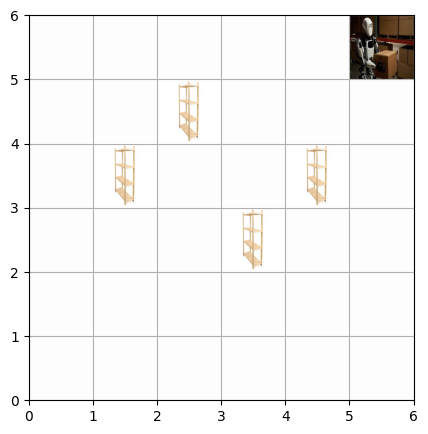

Episode 5: Task completed! Total Reward: 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


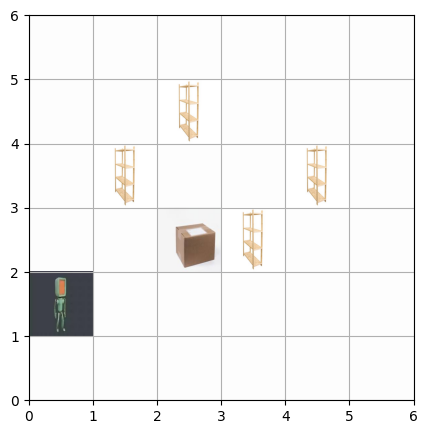

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


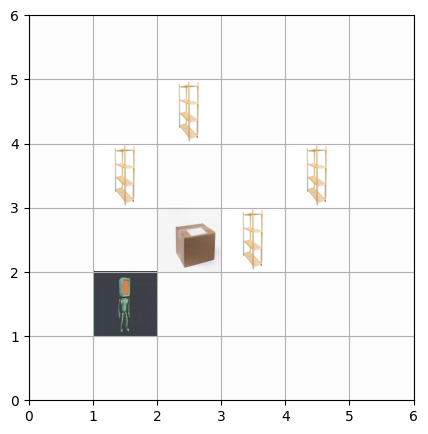

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


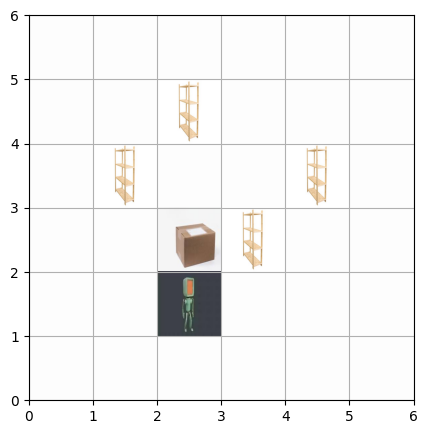

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


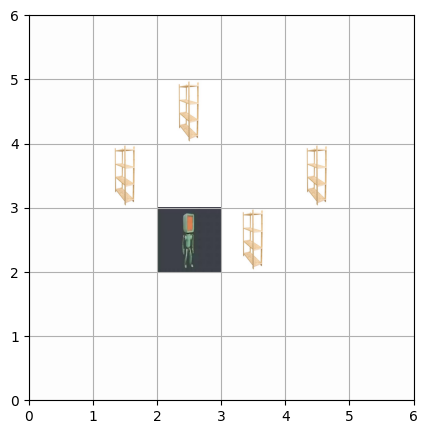

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


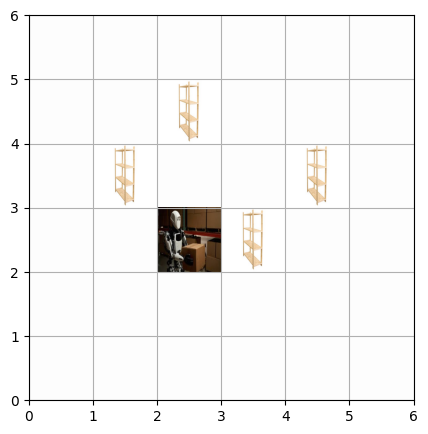

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


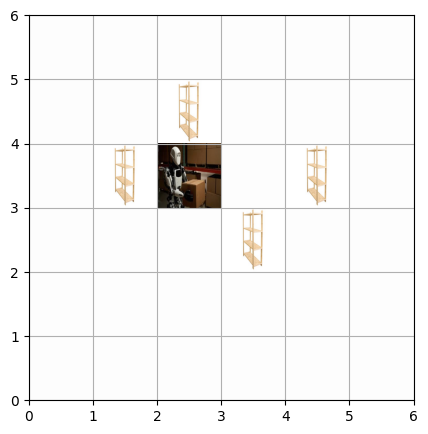

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


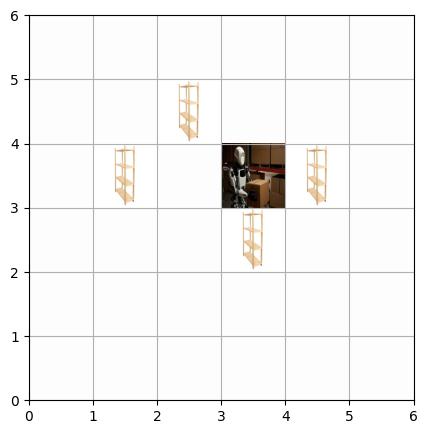

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


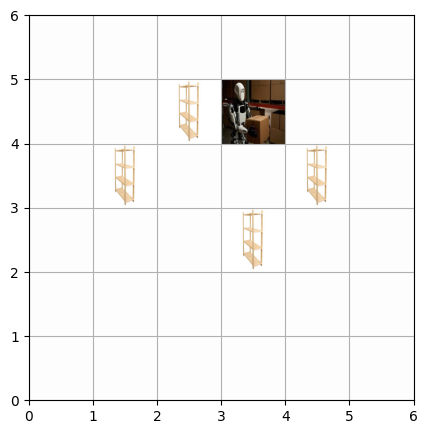

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


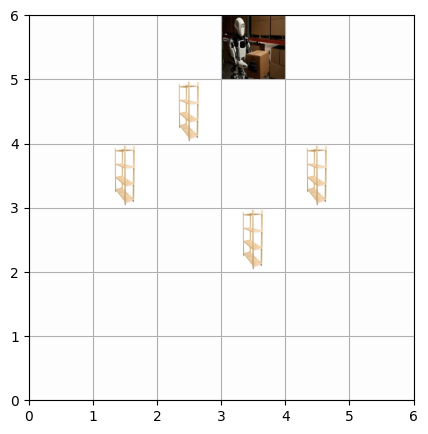

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


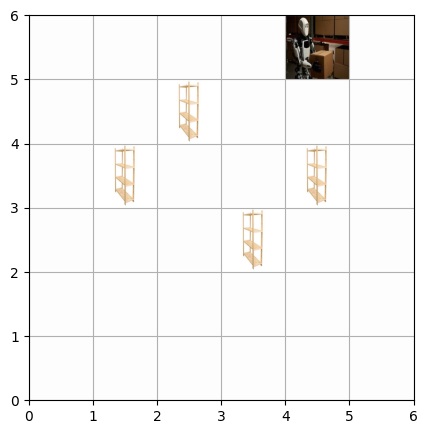

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


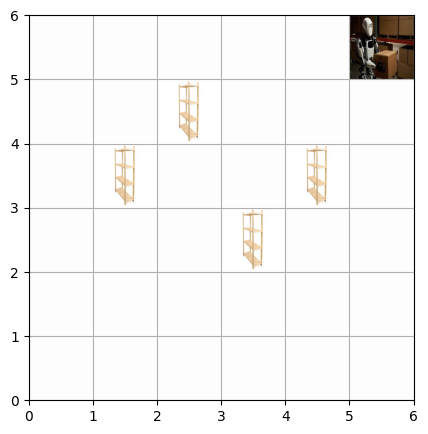

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


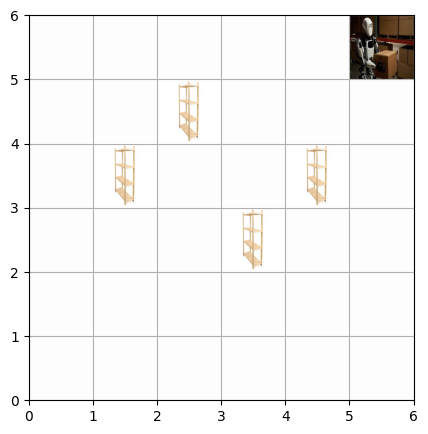

Episode 6: Task completed! Total Reward: 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


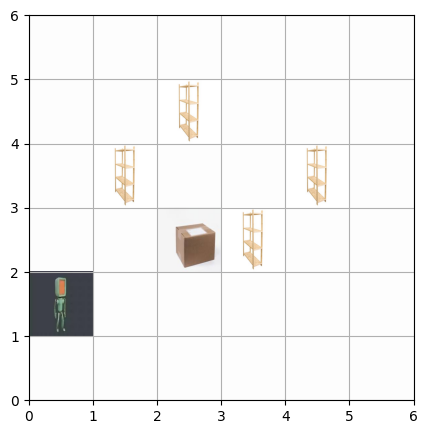

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


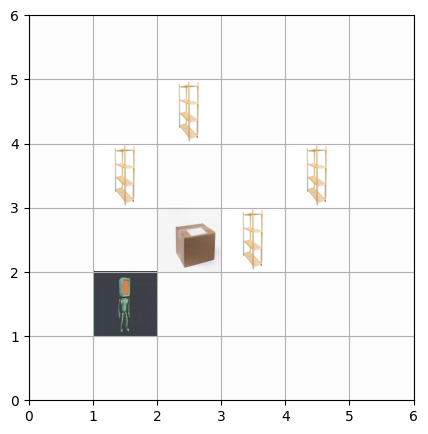

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


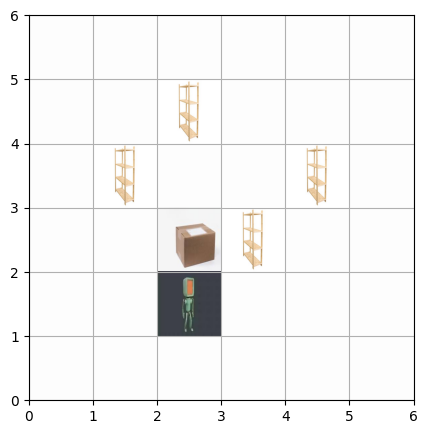

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


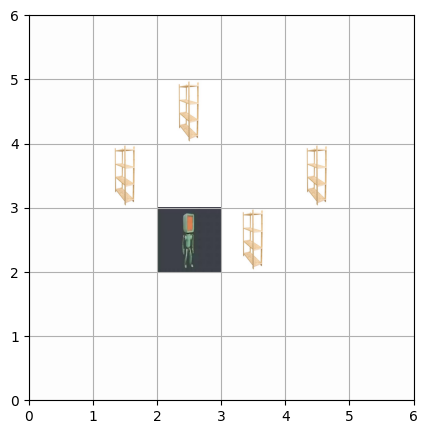

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


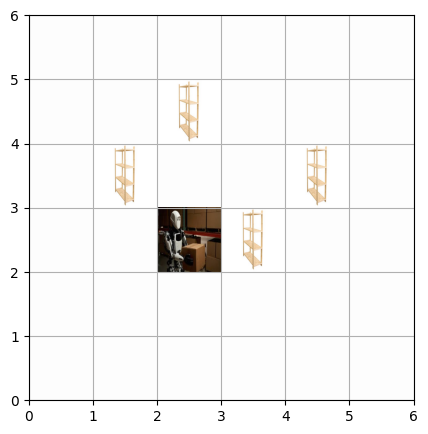

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


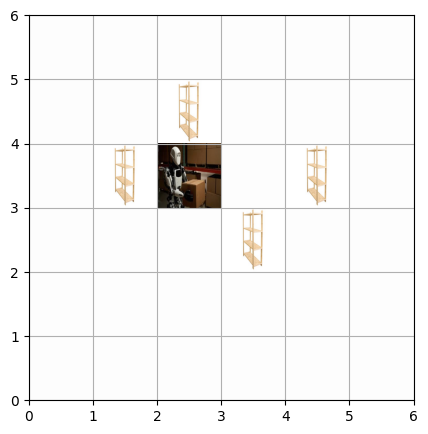

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


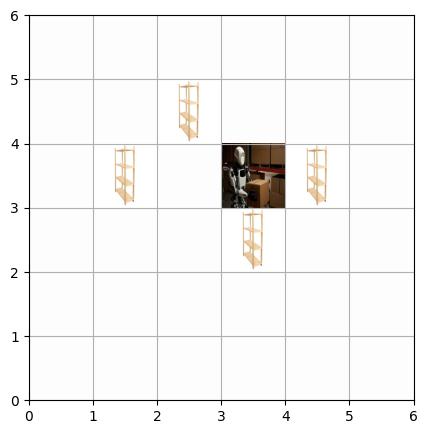

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


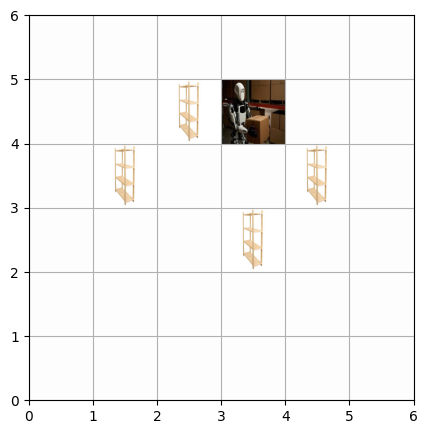

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


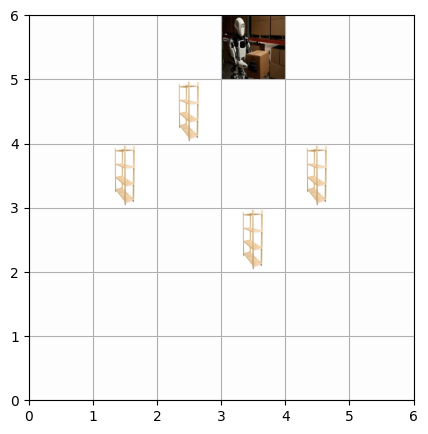

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


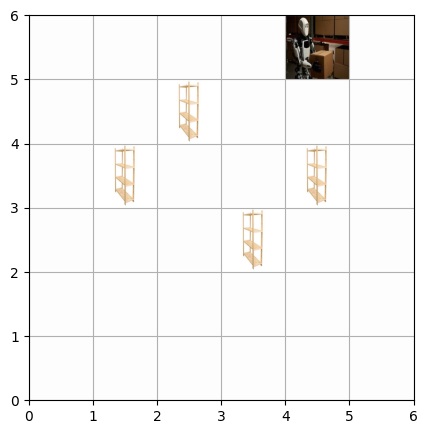

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


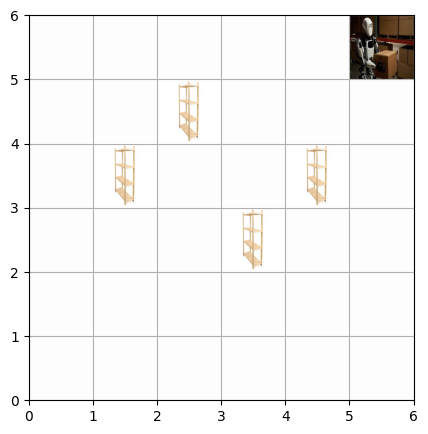

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


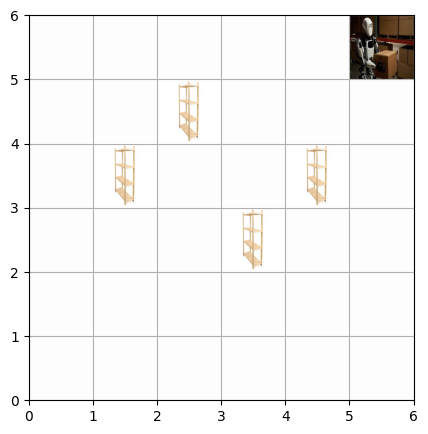

Episode 7: Task completed! Total Reward: 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


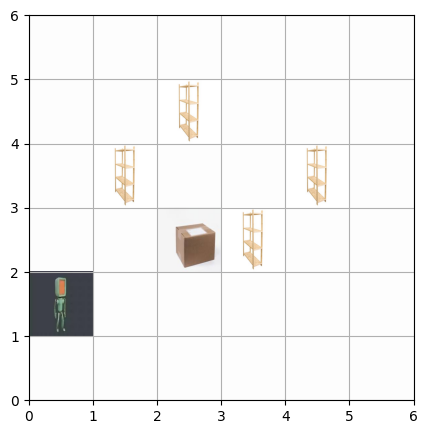

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


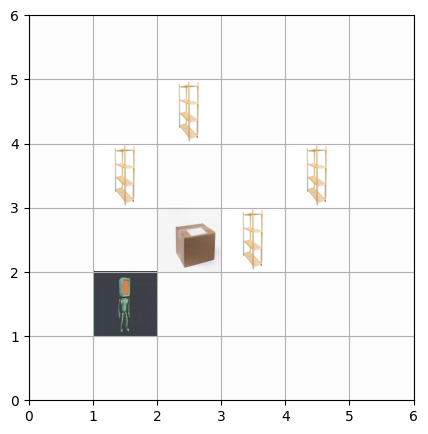

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


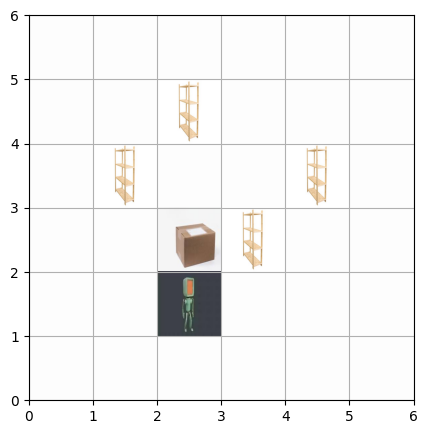

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


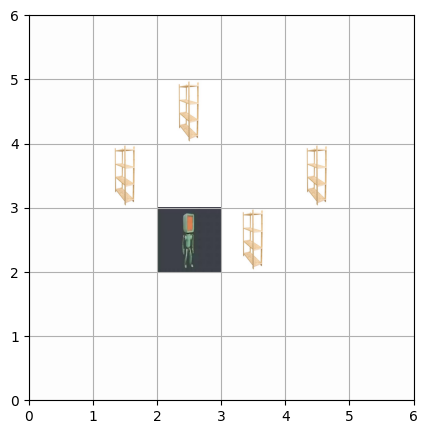

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


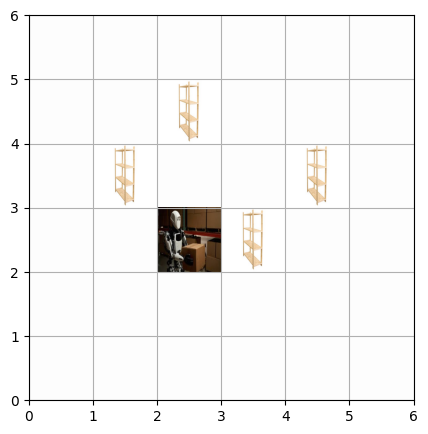

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


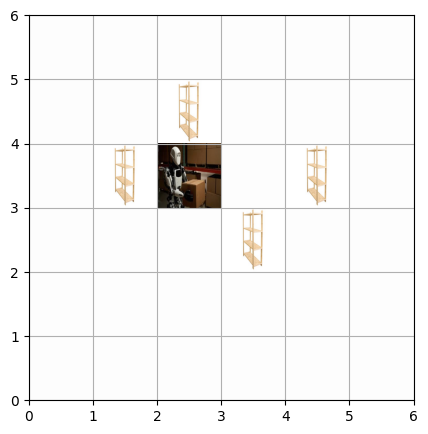

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


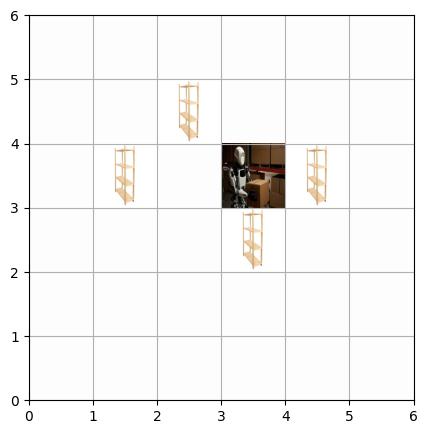

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


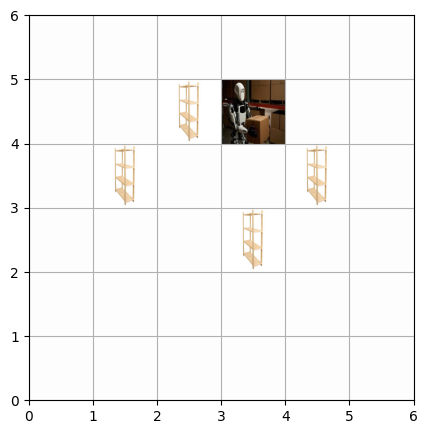

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


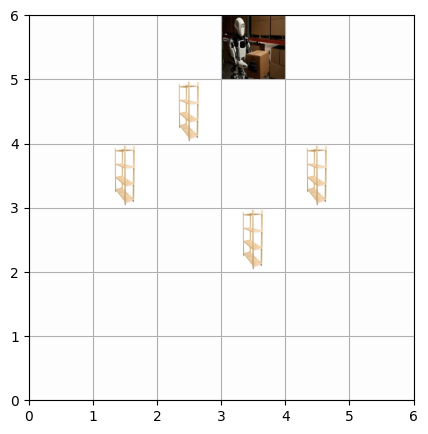

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


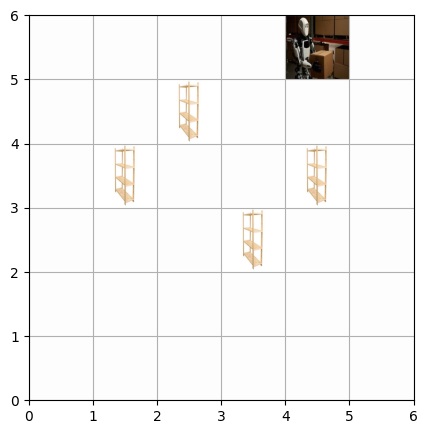

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


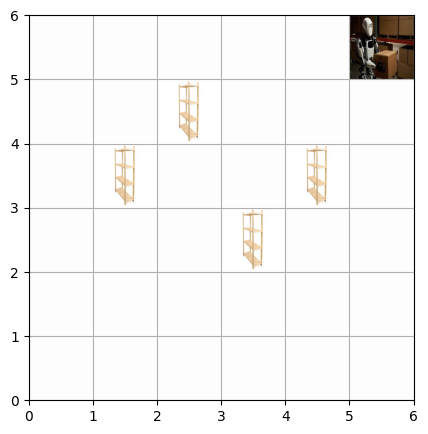

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


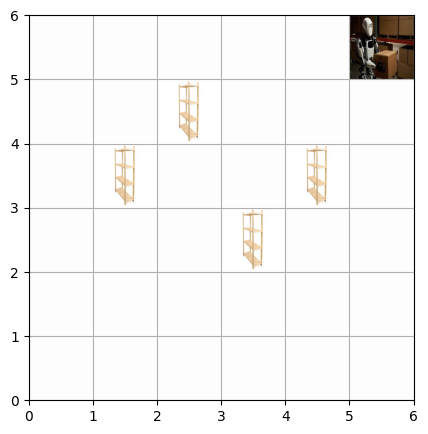

Episode 8: Task completed! Total Reward: 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


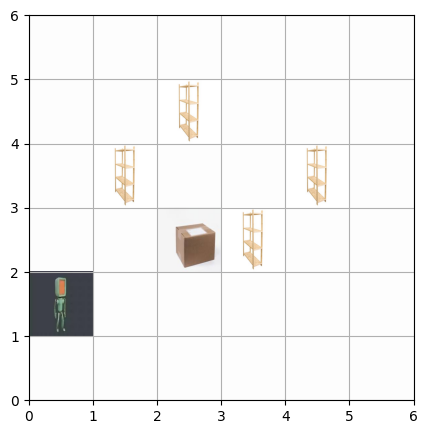

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


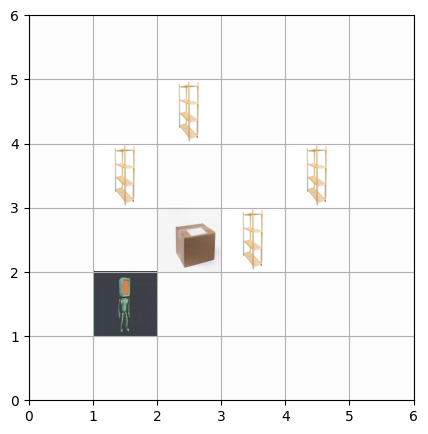

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


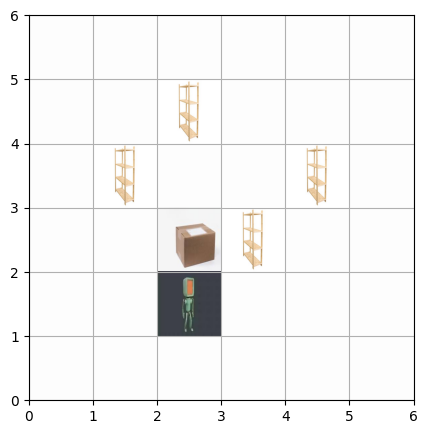

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


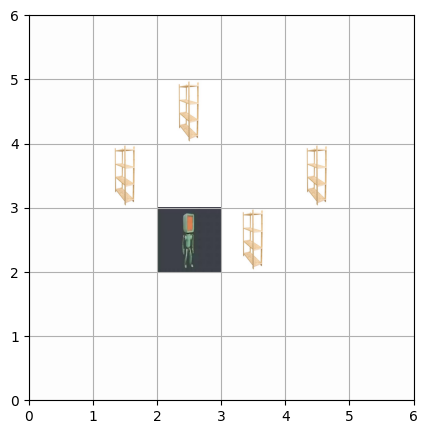

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


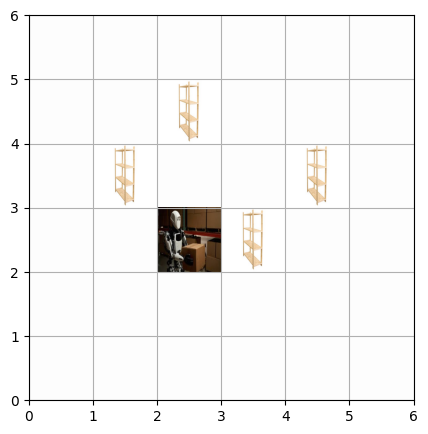

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


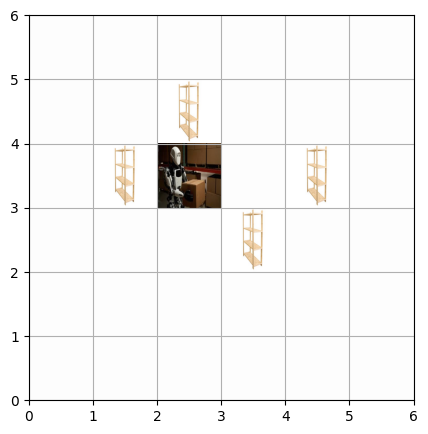

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


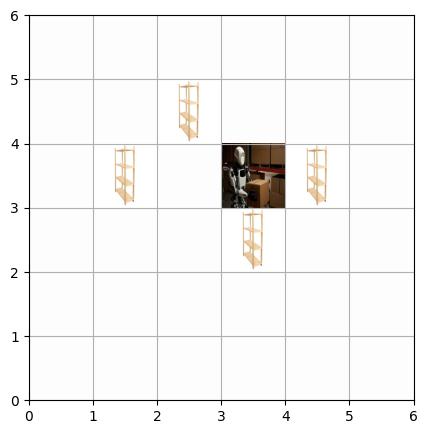

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


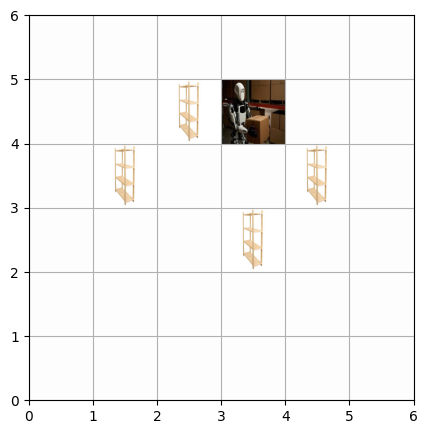

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


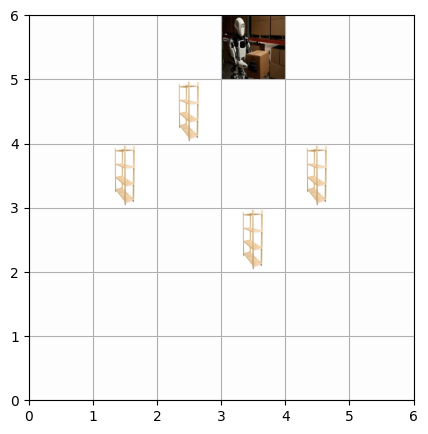

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


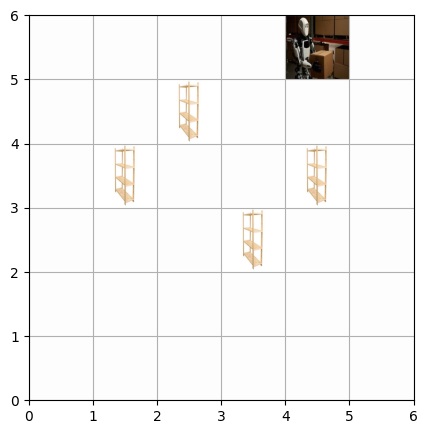

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


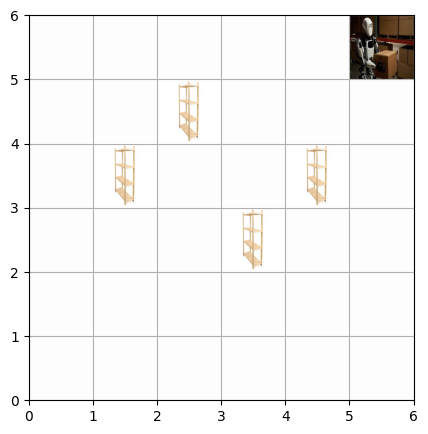

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


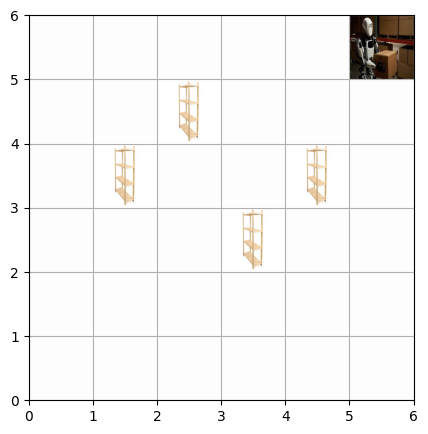

Episode 9: Task completed! Total Reward: 115
Step 0: Action = Up, Position=(0, 1), Carrying=False, Reward=-1


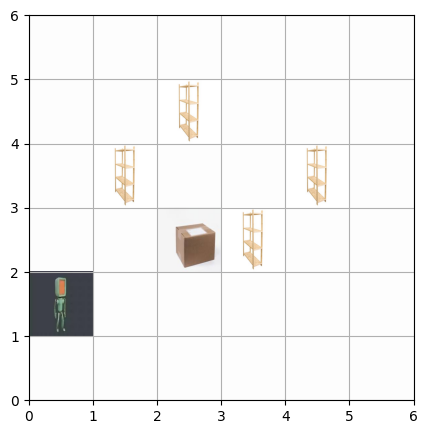

Step 1: Action = Right, Position=(1, 1), Carrying=False, Reward=-1


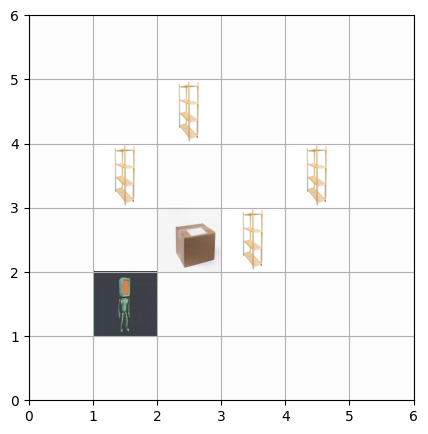

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


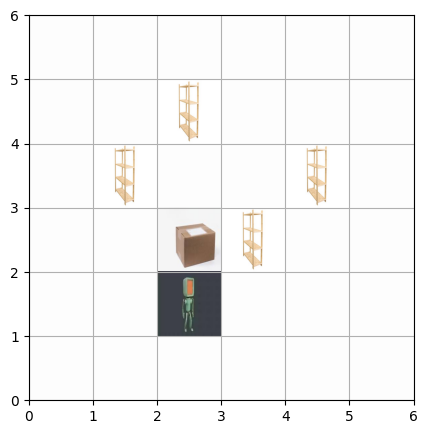

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


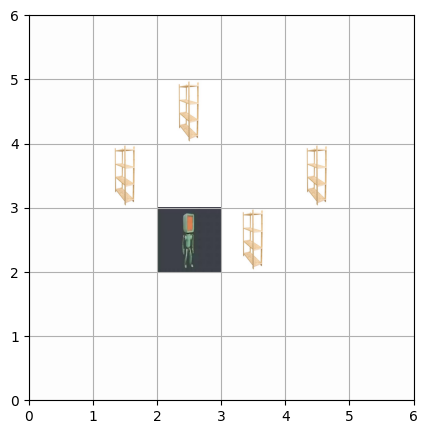

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


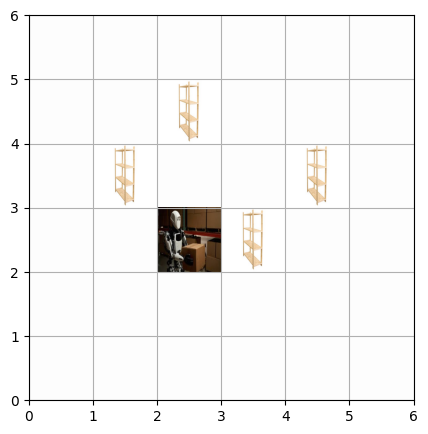

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


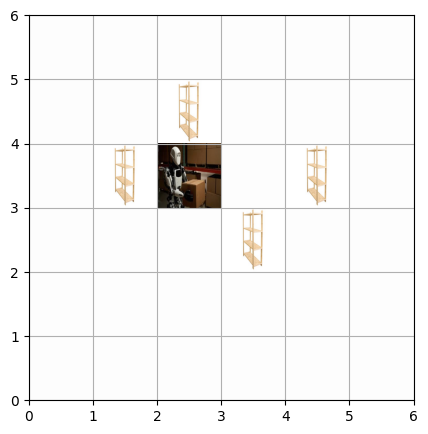

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


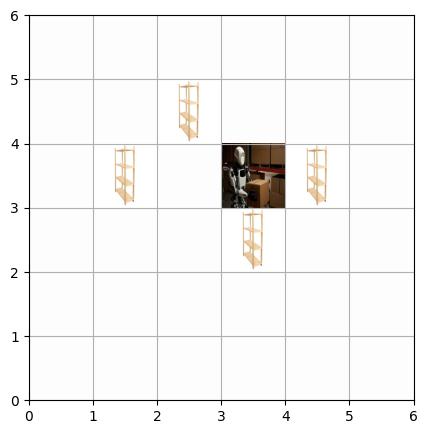

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


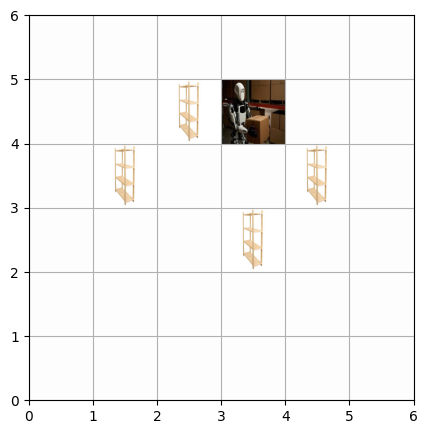

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


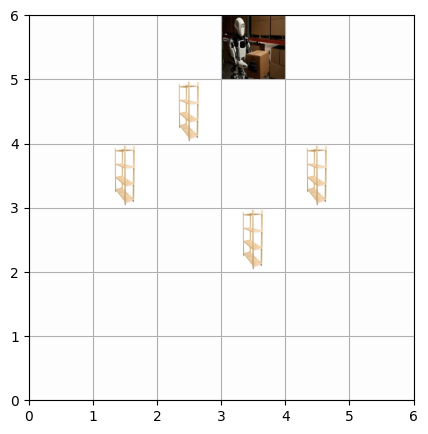

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


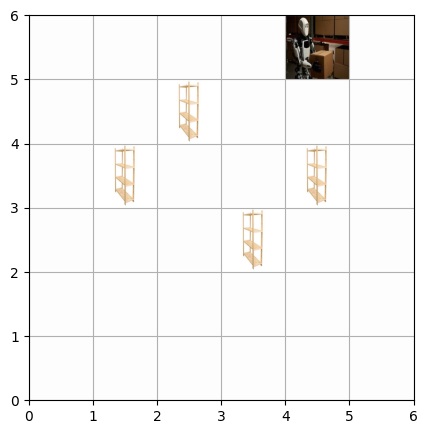

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


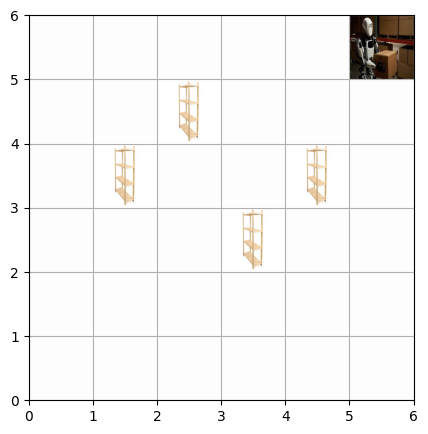

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


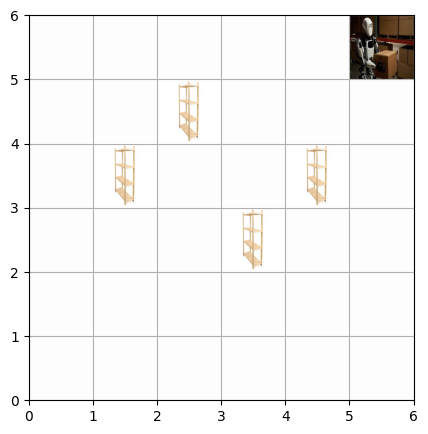

Episode 10: Task completed! Total Reward: 115


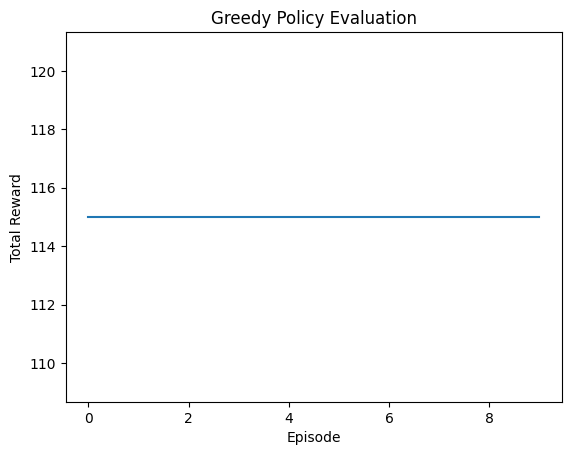

In [40]:
def test_agent(num_episodes=10):
    rewards_per_episode = []
    
    for episode in range(num_episodes):
        state = tuple(environment.reset())
        total_reward = 0
        done = False
        step = 0
        
        while not done:
            action = np.argmax(Q[state])
            next_state, reward, done, _ = environment.step(action)
            state = tuple(next_state)
            total_reward += reward
            print(f"Step {step}: Action = {mapped_actions[action]}, Position={state[:2]}, Carrying={bool(state[2])}, Reward={reward}")
            environment.render()
            step += 1
            if done:
                print(f"Episode {episode + 1}: Task completed! Total Reward: {total_reward}")
                break
        rewards_per_episode.append(total_reward)
    
    # Plot the total reward per episode during greedy evaluation
    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Greedy Policy Evaluation')
    plt.show()

test_agent()

### Hyperparameter Tuning:

In [45]:
def initialize_q_table(env):
    return defaultdict(lambda: np.zeros(env.action_space.n))

def epsilon_greedy_policy(Q, state, epsilon, env):
    if random.uniform(0, 1) < epsilon:
        return env.action_space.sample()
    else:
        return np.argmax(Q[state])

def train_q_learning(env, gamma, epsilon_decay, num_episodes=500, alpha=0.1, epsilon=1.0, epsilon_min=0.1):
    Q = initialize_q_table(env)
    rewards_per_episode = []
    epsilon_values = []
    
    for episode in range(num_episodes):
        state = tuple(env.reset())
        total_reward = 0
        done = False
        
        while not done:
            action = epsilon_greedy_policy(Q, state, epsilon, env)
            next_state, reward, done, _ = env.step(action)
            next_state = tuple(next_state)
            
            best_next_action = np.argmax(Q[next_state])
            Q[state][action] += alpha * (reward + gamma * Q[next_state][best_next_action] - Q[state][action])
            
            state = next_state
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
        epsilon_values.append(epsilon)
        epsilon = max(epsilon_min, epsilon * epsilon_decay)
    
    return Q, rewards_per_episode, epsilon_values

In [46]:
def evaluate_hyperparameters(trial):
    gamma = trial.suggest_float("gamma", 0.8, 0.99)
    epsilon_decay = trial.suggest_float("epsilon_decay", 0.95, 0.999)
    
    env = Warehouse_robot()
    Q, rewards, epsilon_values = train_q_learning(env, gamma, epsilon_decay)
    
    # Plot total reward per episode
    plt.figure()
    plt.plot(rewards)
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title(f"Q-Learning Performance (gamma={gamma}, epsilon_decay={epsilon_decay})")
    plt.show()
    
    # Plot epsilon decay
    plt.figure()
    plt.plot(epsilon_values)
    plt.xlabel("Episode")
    plt.ylabel("Epsilon Value")
    plt.title(f"Epsilon Decay Over Episodes (gamma={gamma}, epsilon_decay={epsilon_decay})")
    plt.show()
    
    test_agent(env, Q)
    
    return np.mean(rewards[-50:])  # Average reward over last 50 episodes

In [ ]:
# Hyperparameter tuning with Optuna
study = optuna.create_study(direction="maximize")
study.optimize(evaluate_hyperparameters, n_trials=6)

# Best hyperparameters
best_params = study.best_params
print("Best hyperparameters:", best_params)

# Train with best hyperparameters
env = Warehouse_robot()
Q, rewards, epsilon_values = train_q_learning(env, best_params["gamma"], best_params["epsilon_decay"])

# Save the best Q-table
with open("q_table_tuned.pkl", "wb") as f:
    pickle.dump(dict(Q), f)
print("Tuned Q-table saved as q_table_tuned.pkl")

def test_agent(env, Q, num_episodes=10):
    rewards_per_episode = []
    
    for episode in range(num_episodes):
        state = tuple(env.reset())
        total_reward = 0
        done = False
        
        while not done:
            action = np.argmax(Q[state])
            next_state, reward, done, _ = env.step(action)
            state = tuple(next_state)
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
    
    # Plot greedy evaluation results
    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title("Greedy Policy Evaluation with Tuned Parameters")
    plt.show()

test_agent(env, Q)

In [41]:
env = Stochastic_warehouse()
# Hyperparameters
gamma = 0.9  # Discount factor
alpha = 0.1  # Learning rate
epsilon = 0.1  # Exploration rate
num_episodes = 500  # Number of training episodes

# Initialize Q-table
Q = defaultdict(lambda: np.zeros(env.action_space.n))

print("Initial Q-table:")
print(dict(Q))

def epsilon_greedy_policy(state, epsilon):
    """Choose an action using epsilon-greedy policy."""
    if random.uniform(0, 1) < epsilon:
        return env.action_space.sample()  # Explore
    else:
        return np.argmax(Q[state])  # Exploit best-known action

def train_q_learning():
    """Train the agent using Q-learning."""
    rewards_per_episode = []
    epsilon_values = []
    
    for episode in range(num_episodes):
        state = tuple(env.reset())  # Convert state to tuple for dictionary indexing
        total_reward = 0
        done = False
        
        while not done:
            action = epsilon_greedy_policy(state, epsilon)
            next_state, reward, done, _ = env.step(action)
            next_state = tuple(next_state)
            
            # Update Q-table using the Bellman equation
            best_next_action = np.argmax(Q[next_state])
            Q[state][action] += alpha * (reward + gamma * Q[next_state][best_next_action] - Q[state][action])
            
            state = next_state
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
        epsilon_values.append(epsilon)
        if (episode + 1) % 50 == 0:
            print(f"Episode {episode + 1}, Total Reward: {total_reward}")
    
    return rewards_per_episode, epsilon_values

rewards, epsilon_values = train_q_learning()

print("Trained Q-table:")
print(dict(Q))

# Save the Q-table as a pickle file
with open("q_table_stochastic.pkl", "wb") as f:
    pickle.dump(dict(Q), f)

print("Q-table saved as q_table_stochastic.pkl")

Initial Q-table:
{}
Episode 50, Total Reward: 111
Episode 100, Total Reward: 110
Episode 150, Total Reward: 110
Episode 200, Total Reward: 111
Episode 250, Total Reward: 111
Episode 300, Total Reward: 110
Episode 350, Total Reward: 109
Episode 400, Total Reward: 71
Episode 450, Total Reward: 109
Episode 500, Total Reward: 109
Trained Q-table:
{(0, 0, 0): array([ 56.79905906,  68.36567109,  51.11922567, 229.4010557 ,
        63.15490785,  91.93450443]), (0, 1, 0): array([ -0.63779488,  -0.62650369,  -0.72902755, 206.75151871,
        -0.35487076,  -0.67934652]), (1, 0, 0): array([ 69.85145316, 261.38181464,  50.70529452,  12.47158682,
       108.70525003,  51.29993924]), (1, 1, 0): array([106.0124944 , 296.81544867, 111.31102589,  88.78193086,
       147.41416027, 109.72118258]), (2, 0, 0): array([-0.3940399 , 71.65746215, -0.3940399 , -0.473428  , -0.3940399 ,
       -0.3940399 ]), (2, 1, 0): array([ 1.04528320e+00,  2.54290458e+02, -3.98468259e-01, -2.80000000e-01,
        7.80129328e

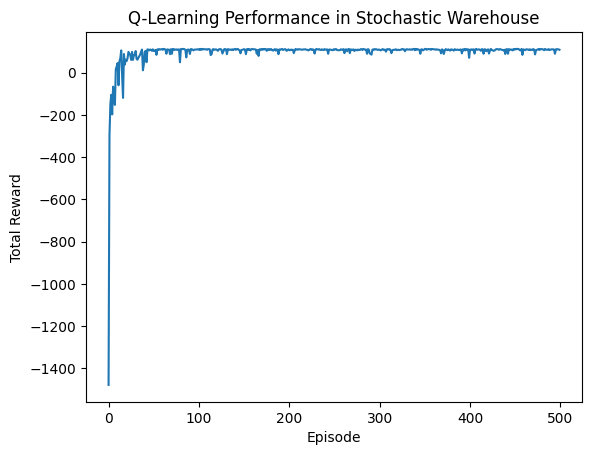

In [42]:
# Plot the total reward per episode
plt.figure()
plt.plot(rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Q-Learning Performance in Stochastic Warehouse')
plt.show()

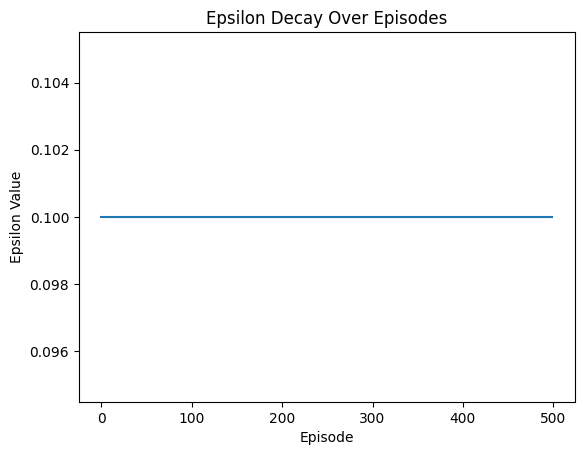

In [43]:
# Plot the epsilon decay
plt.figure()
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Over Episodes')
plt.show()

Step 0: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


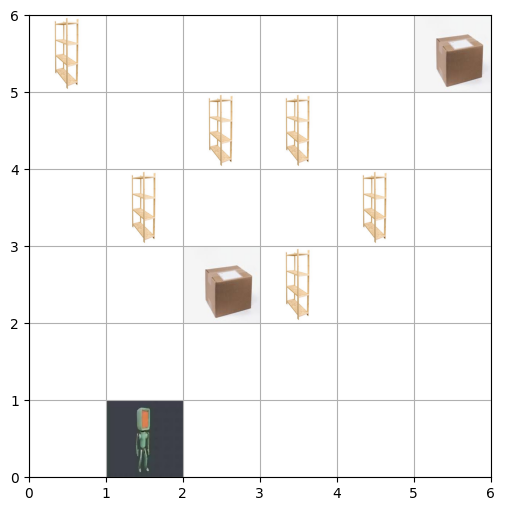

Step 1: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


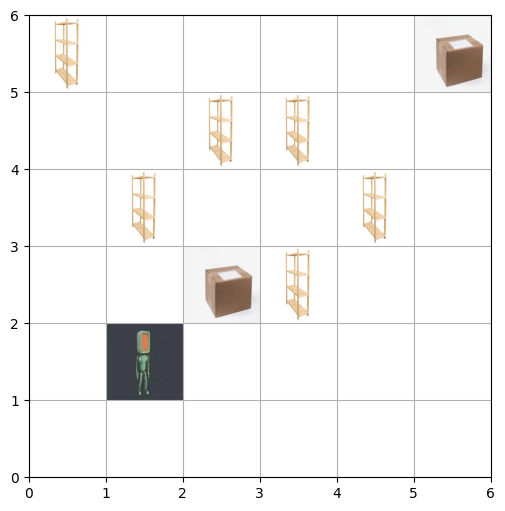

Step 2: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


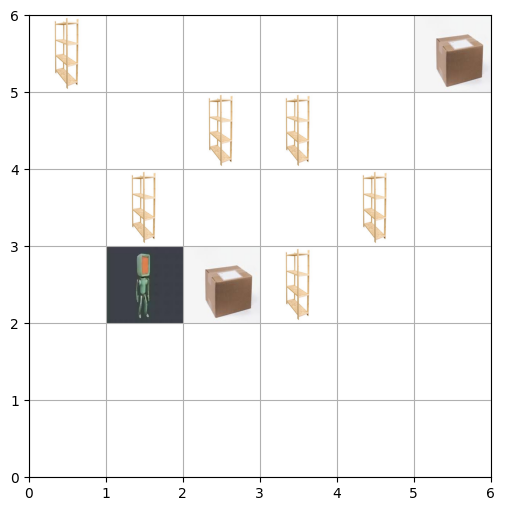

Step 3: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


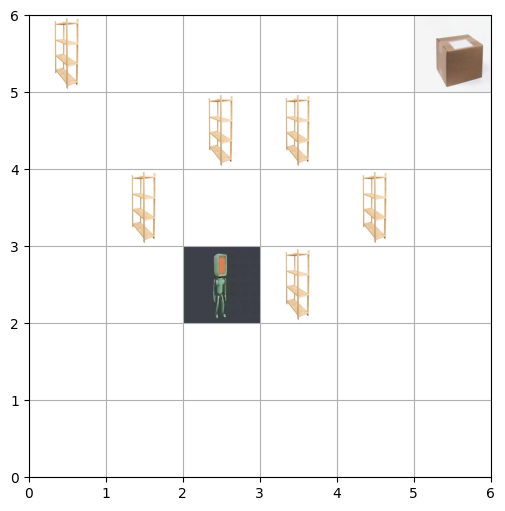

Step 4: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


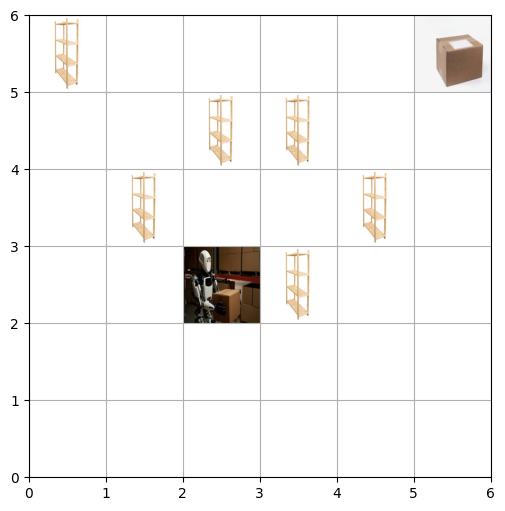

Step 5: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


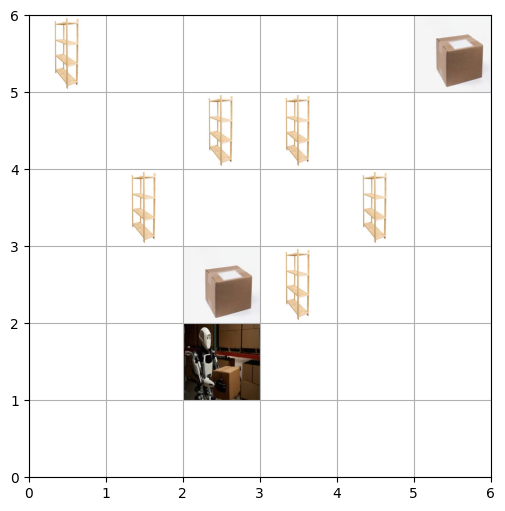

Step 6: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


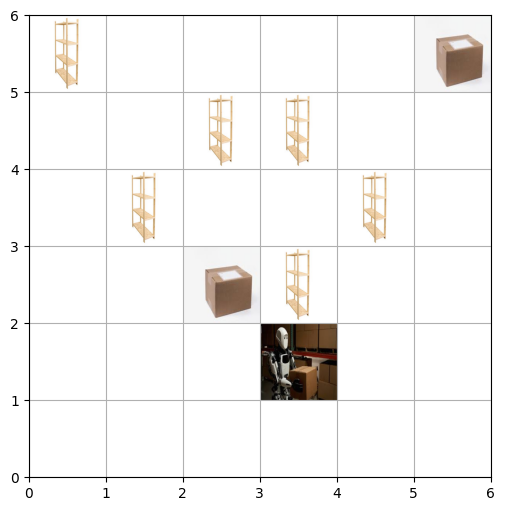

Step 7: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


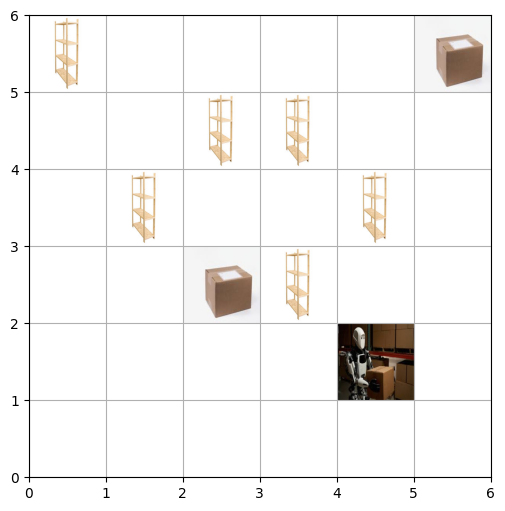

Step 8: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


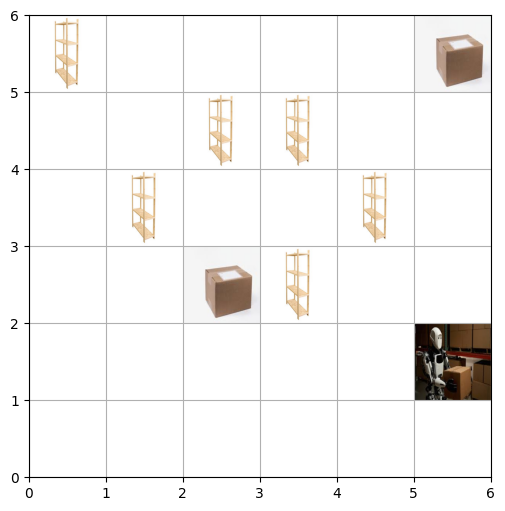

Step 9: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


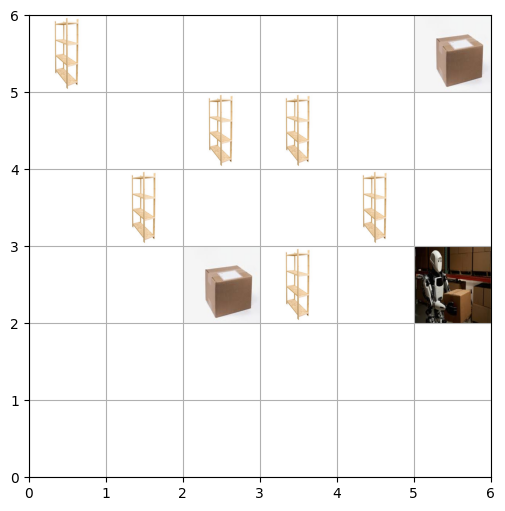

Step 10: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


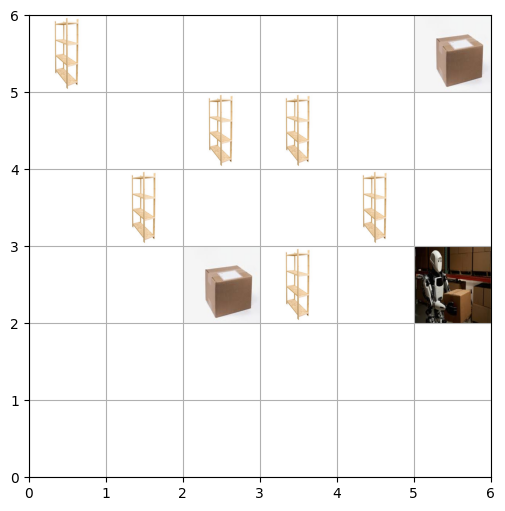

Step 11: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


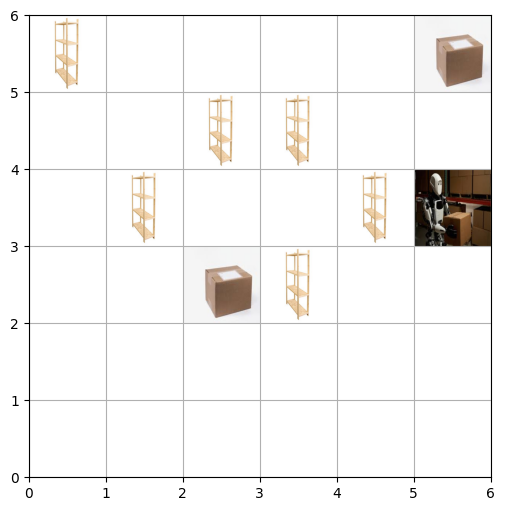

Step 12: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


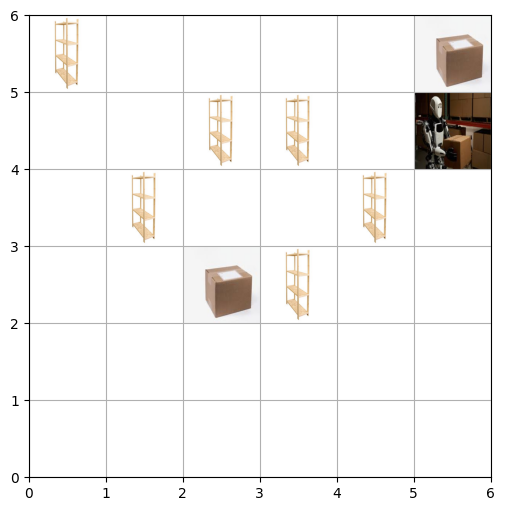

Step 13: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


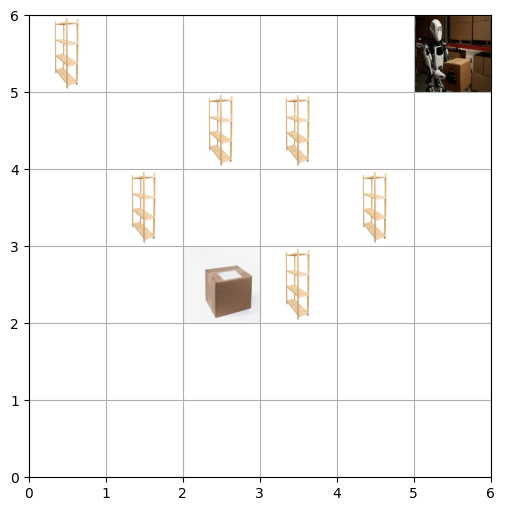

Step 14: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


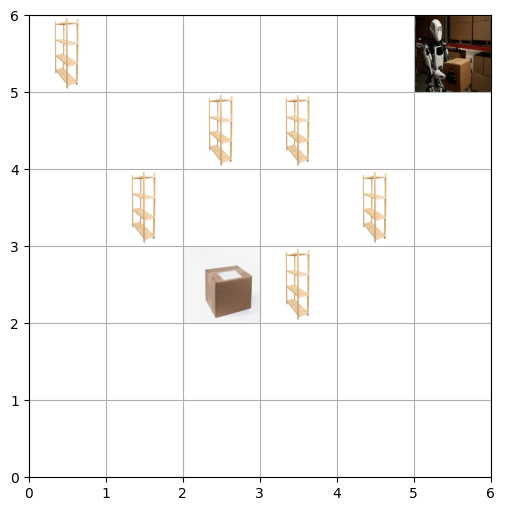

Episode 1: Task completed! Total Reward: 112
Step 0: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


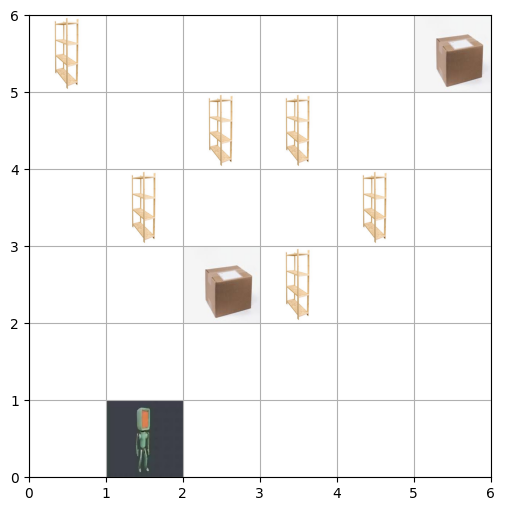

Step 1: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


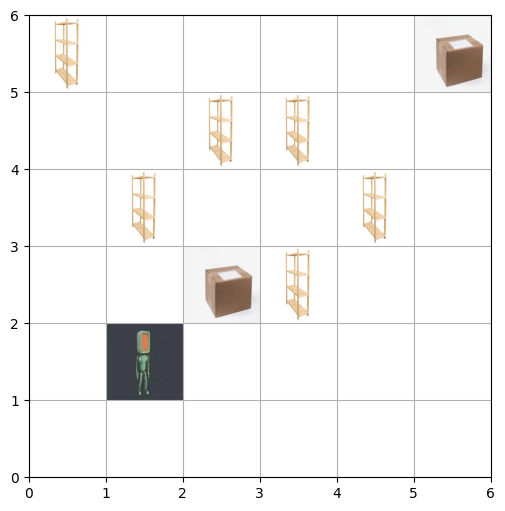

Step 2: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


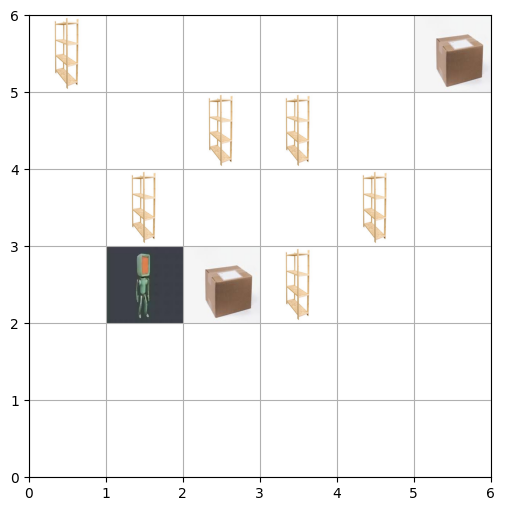

Step 3: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


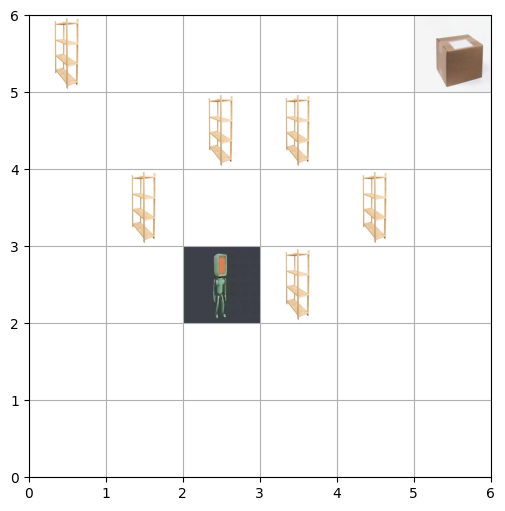

Step 4: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


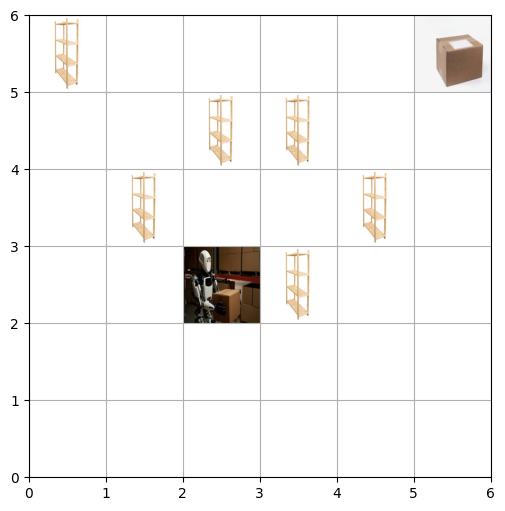

Step 5: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


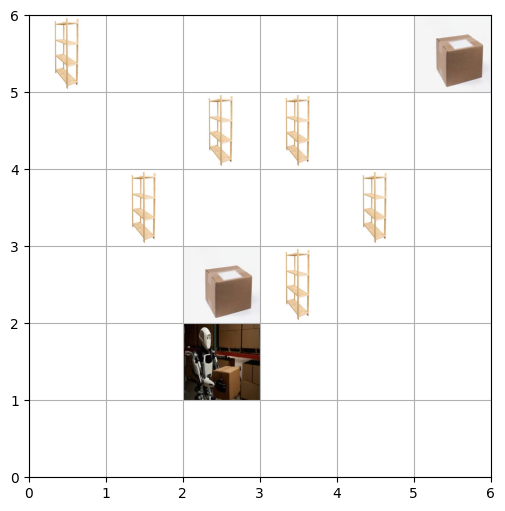

Step 6: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


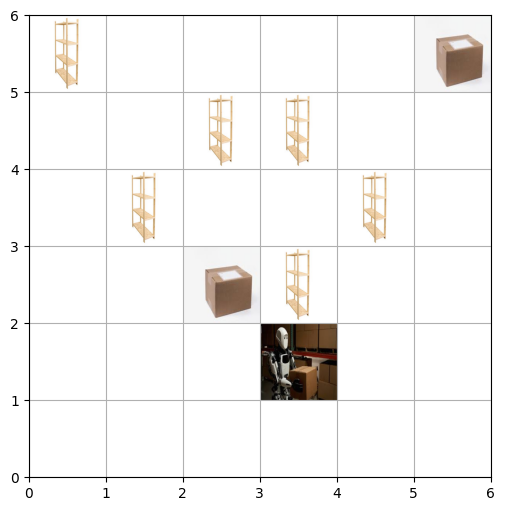

Step 7: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


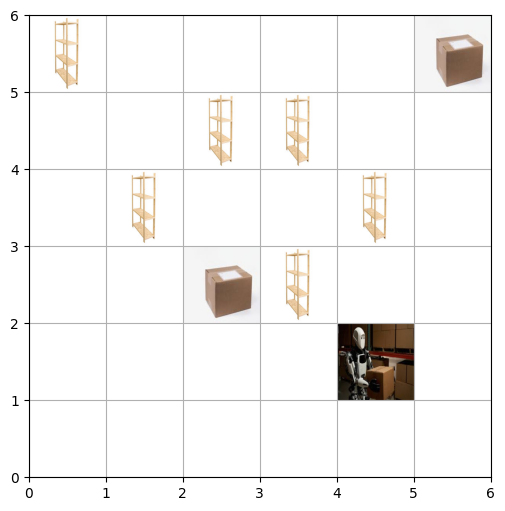

Step 8: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


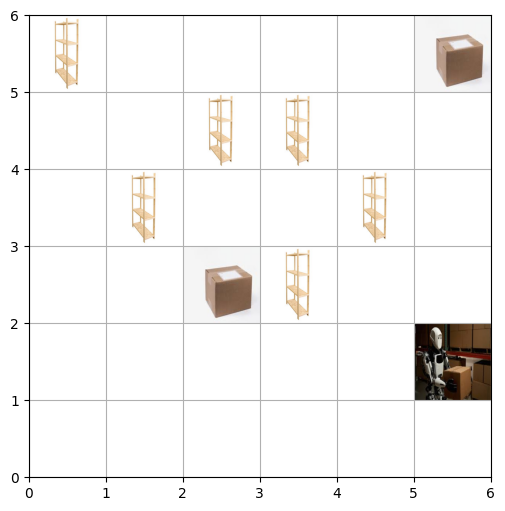

Step 9: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


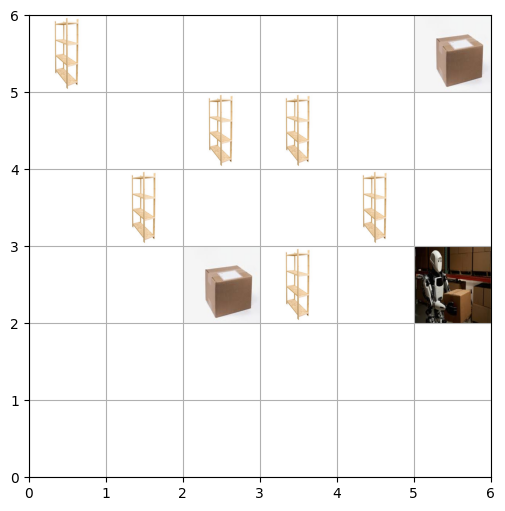

Step 10: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


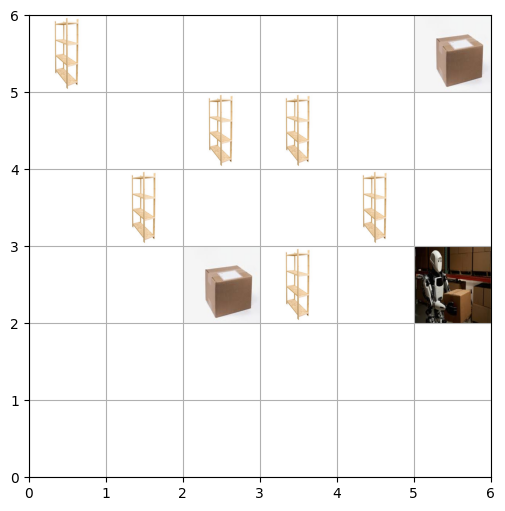

Step 11: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


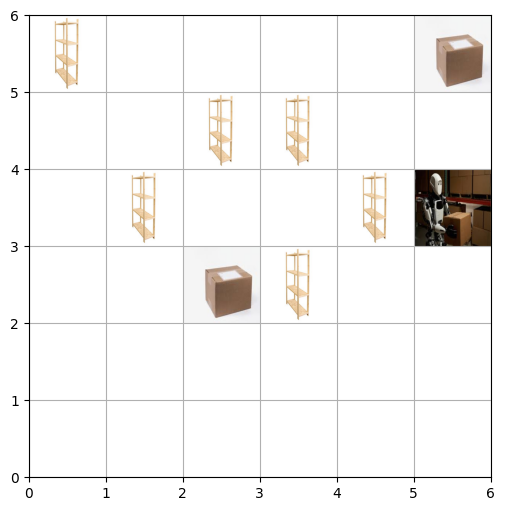

Step 12: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


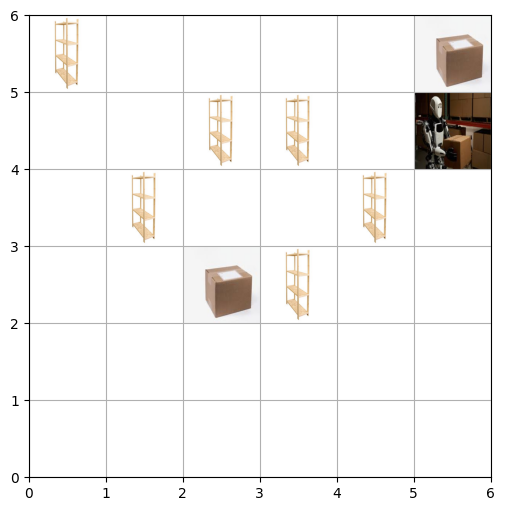

Step 13: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


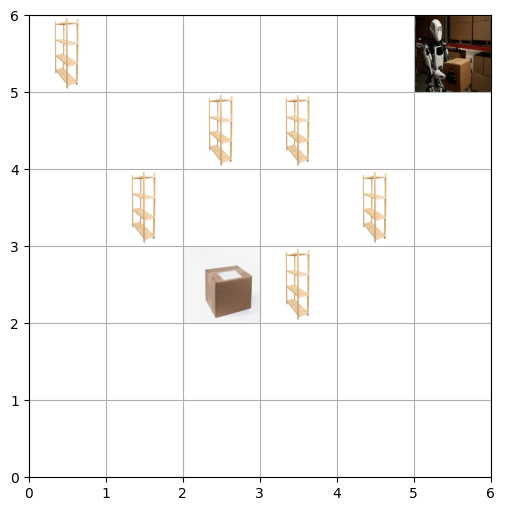

Step 14: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


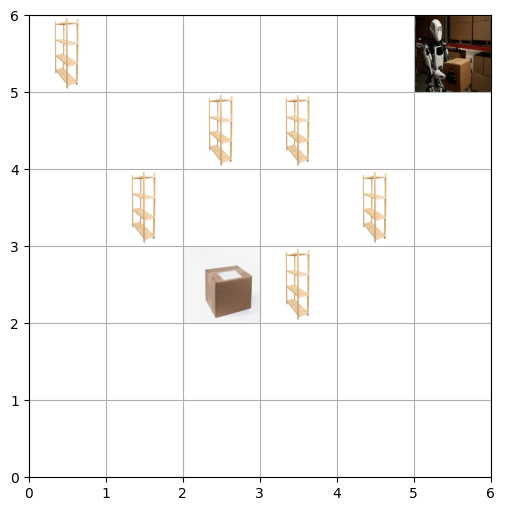

Episode 2: Task completed! Total Reward: 112
Step 0: Action=Right, Position=(0, 0), Carrying=False, Reward=-1


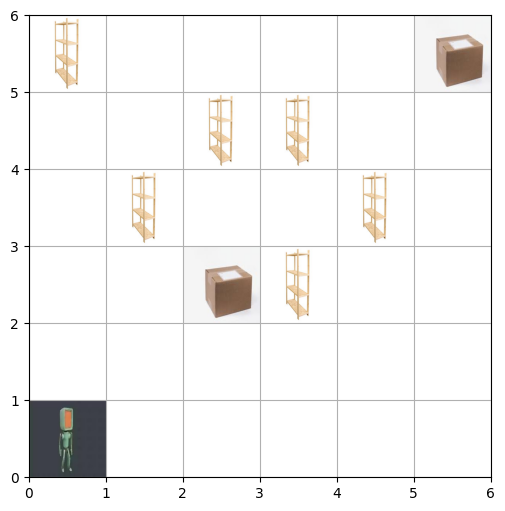

Step 1: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


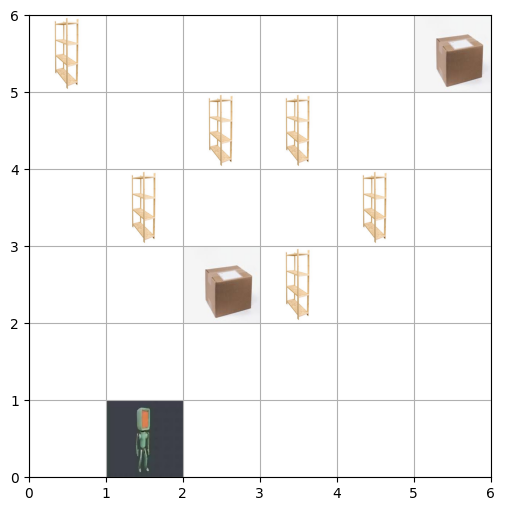

Step 2: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


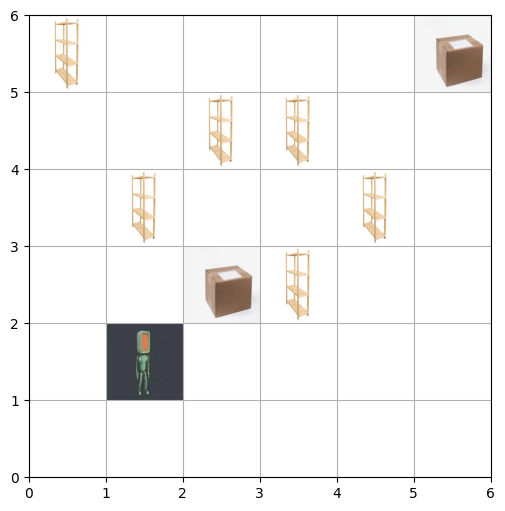

Step 3: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


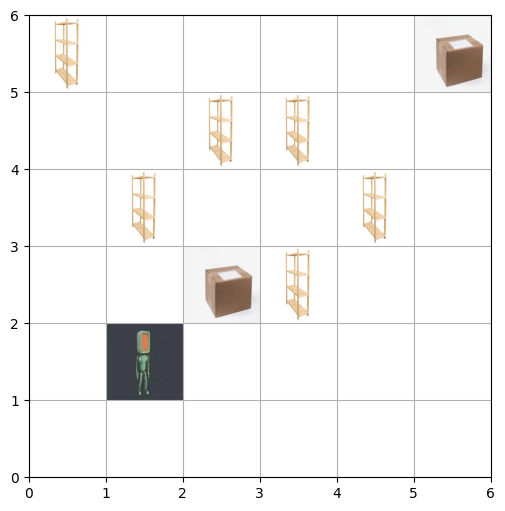

Step 4: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


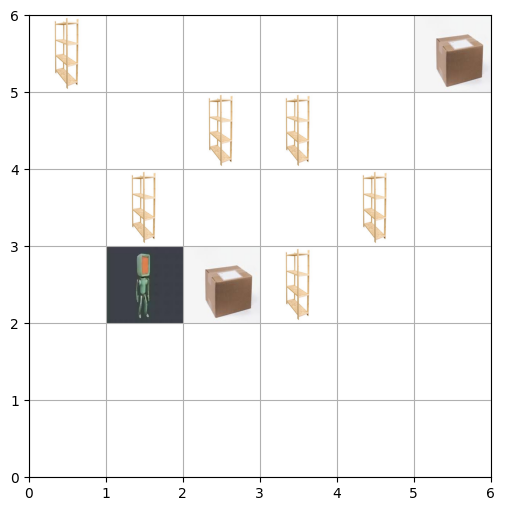

Step 5: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


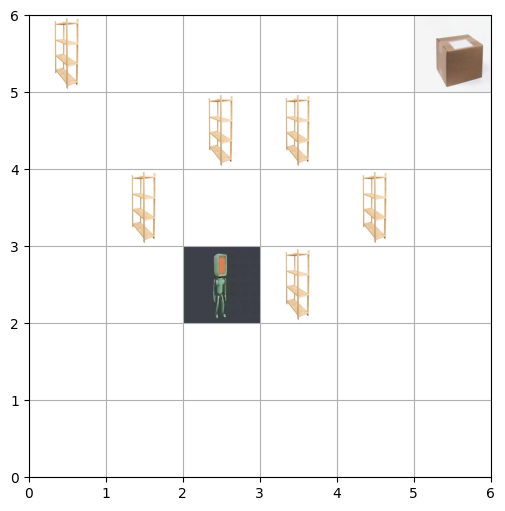

Step 6: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


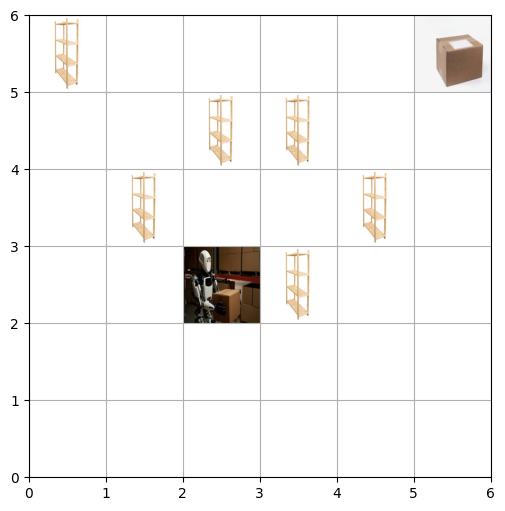

Step 7: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


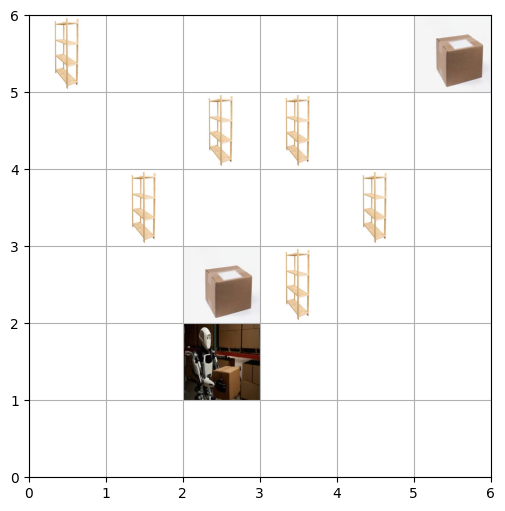

Step 8: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


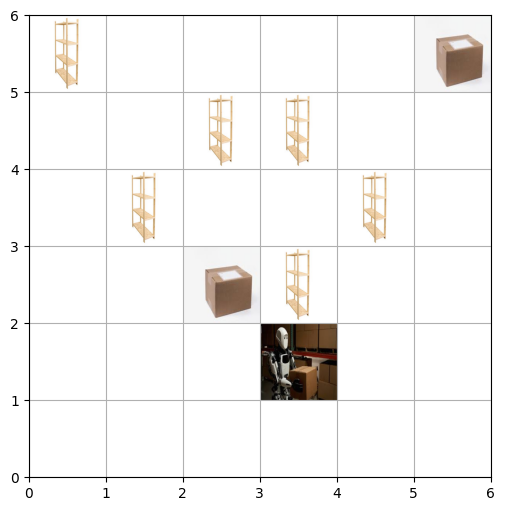

Step 9: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


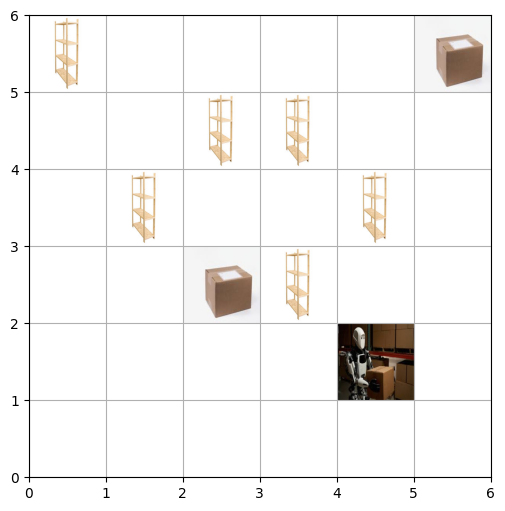

Step 10: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


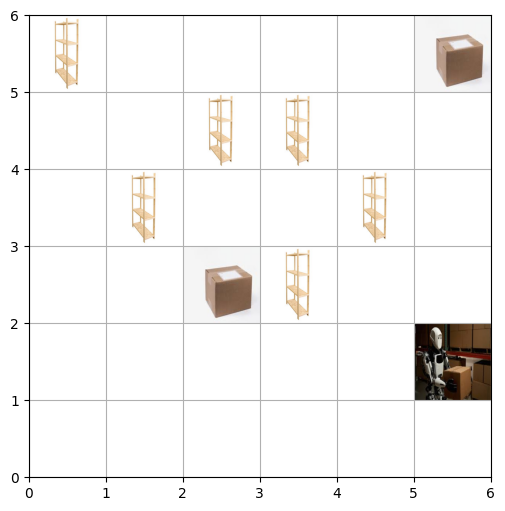

Step 11: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


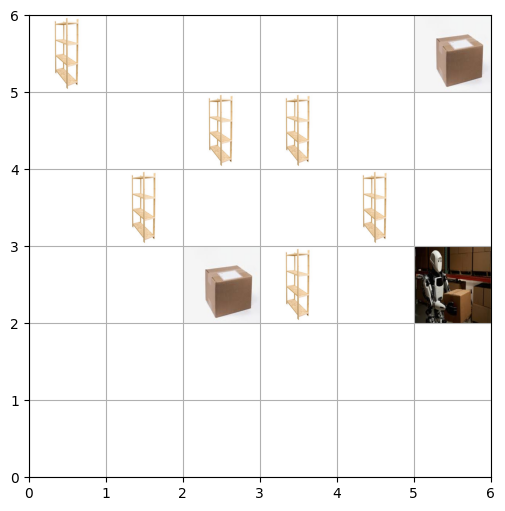

Step 12: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


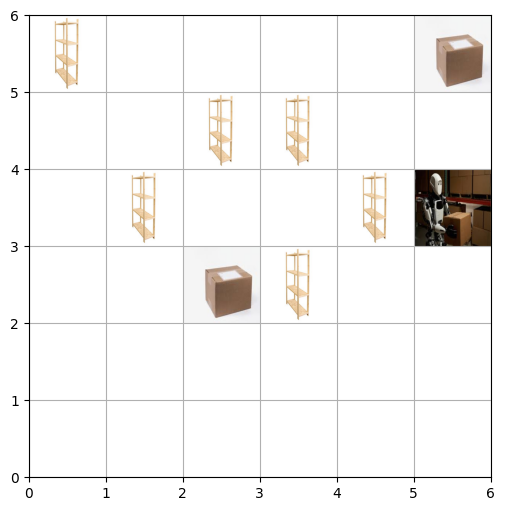

Step 13: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


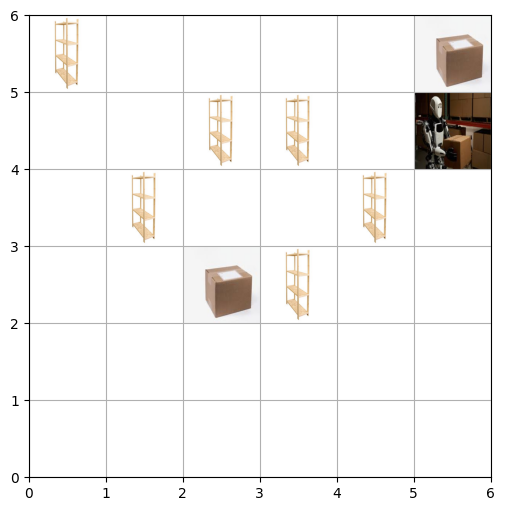

Step 14: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


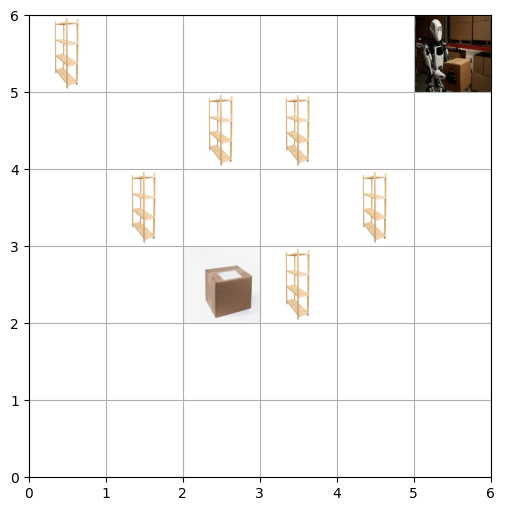

Step 15: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


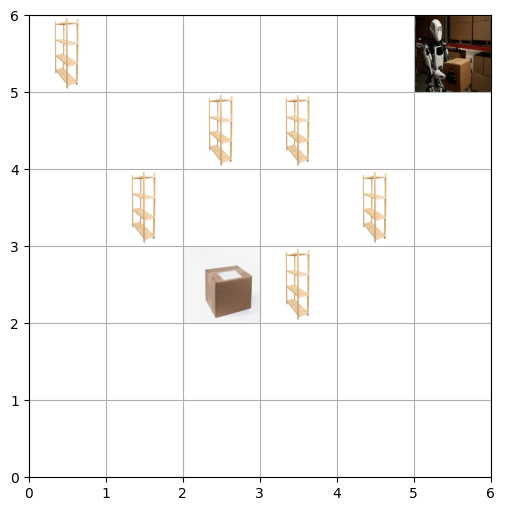

Episode 3: Task completed! Total Reward: 111
Step 0: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


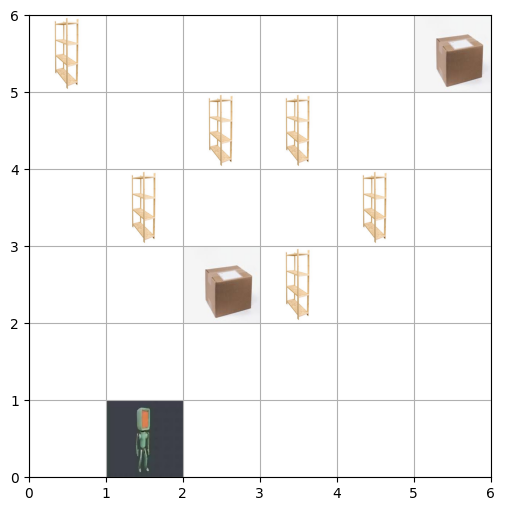

Step 1: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


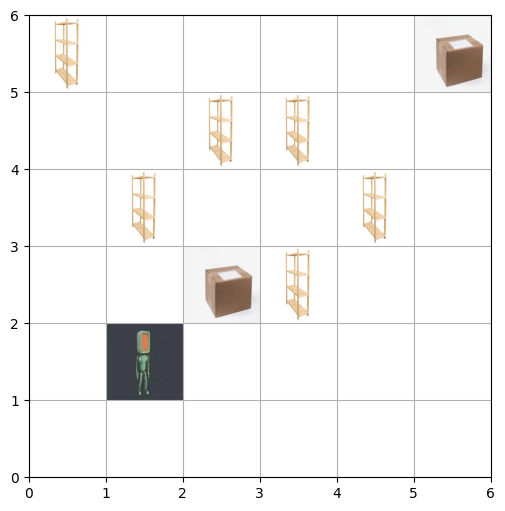

Step 2: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


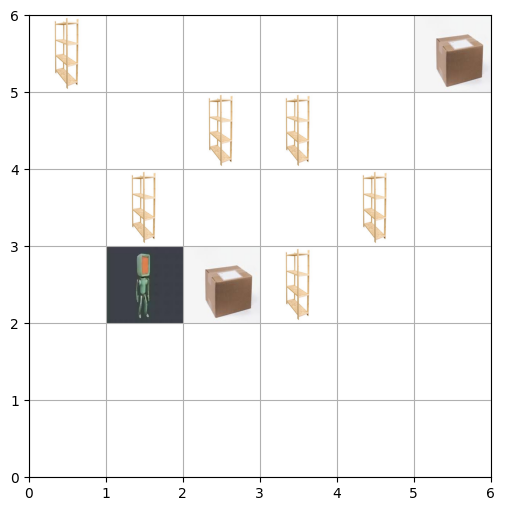

Step 3: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


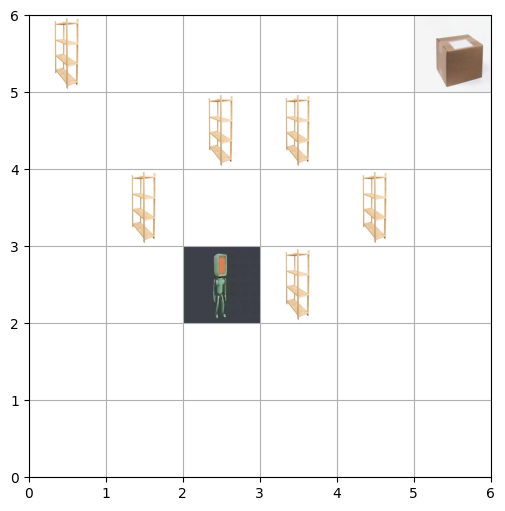

Step 4: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


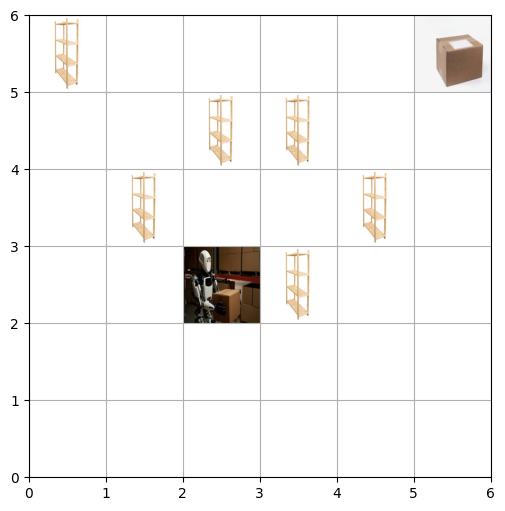

Step 5: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


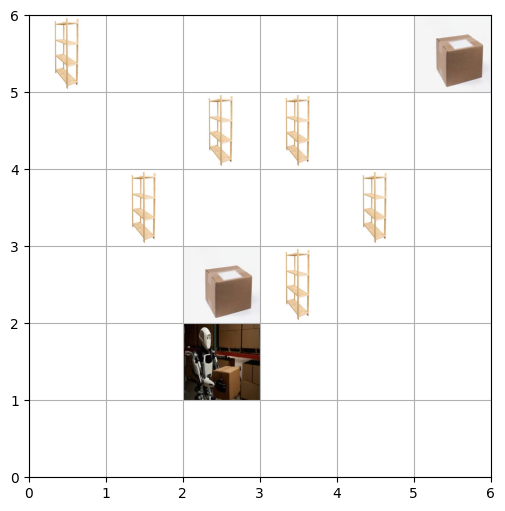

Step 6: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


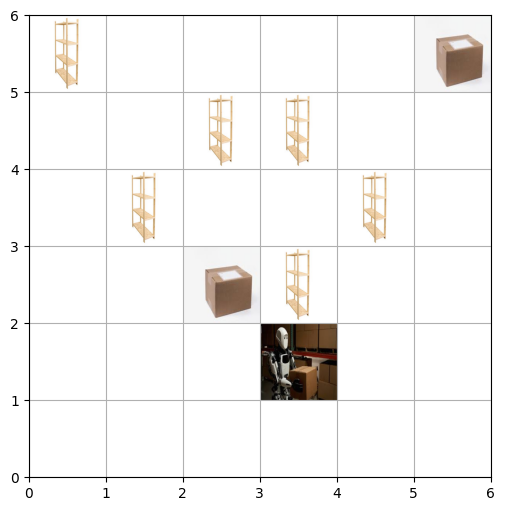

Step 7: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


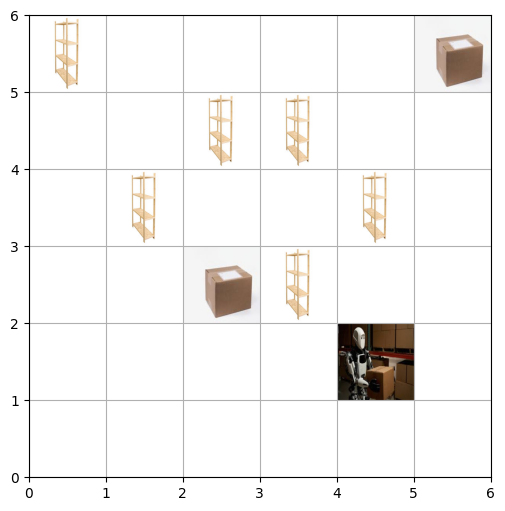

Step 8: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


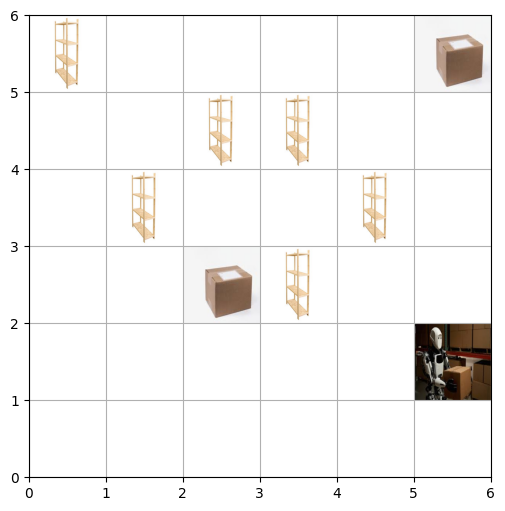

Step 9: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


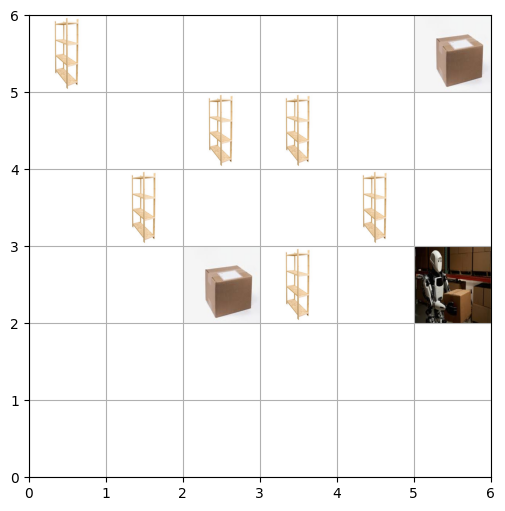

Step 10: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


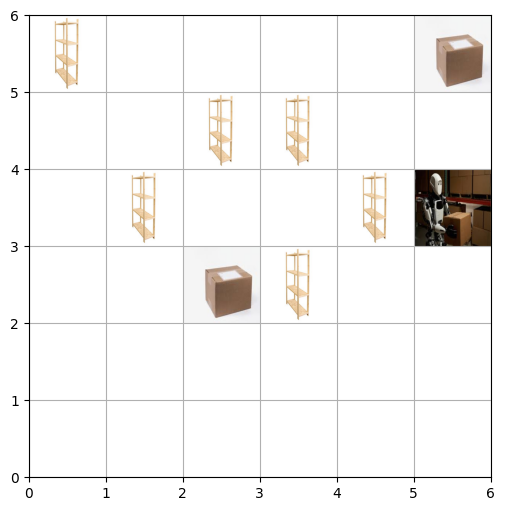

Step 11: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


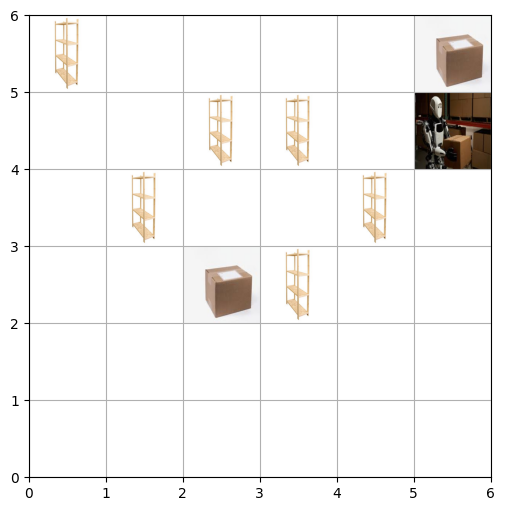

Step 12: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


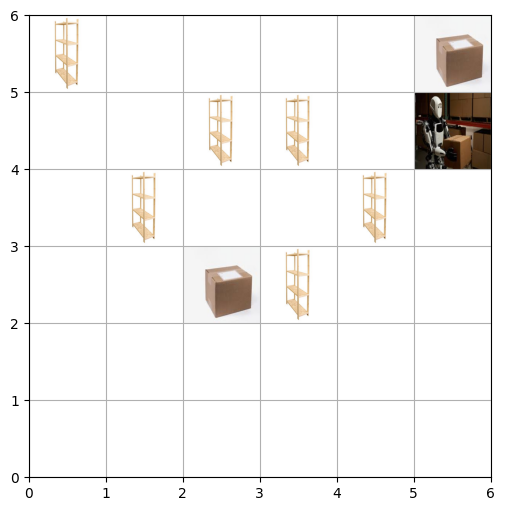

Step 13: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


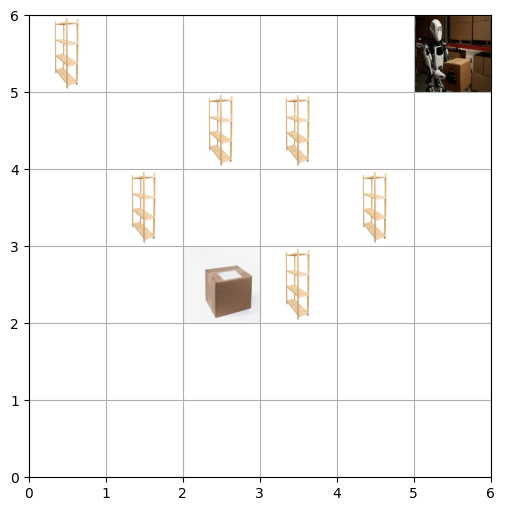

Step 14: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


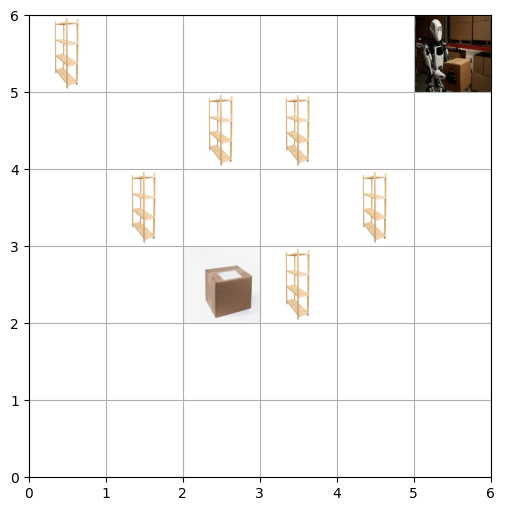

Episode 4: Task completed! Total Reward: 112
Step 0: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


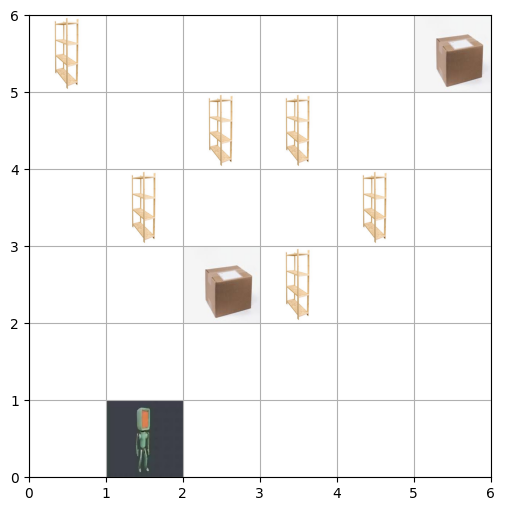

Step 1: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


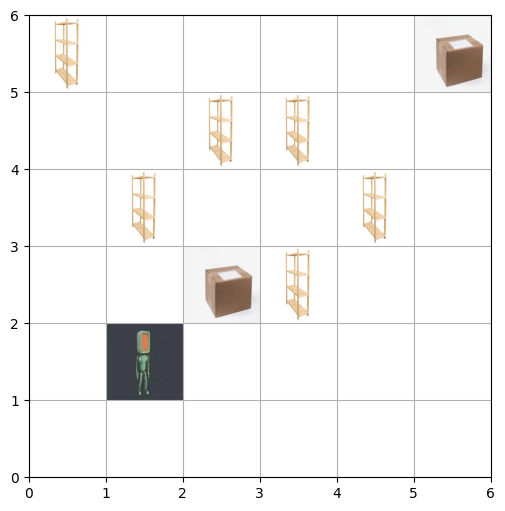

Step 2: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


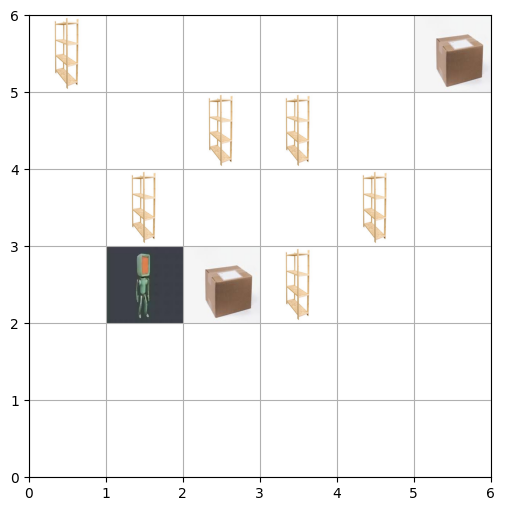

Step 3: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


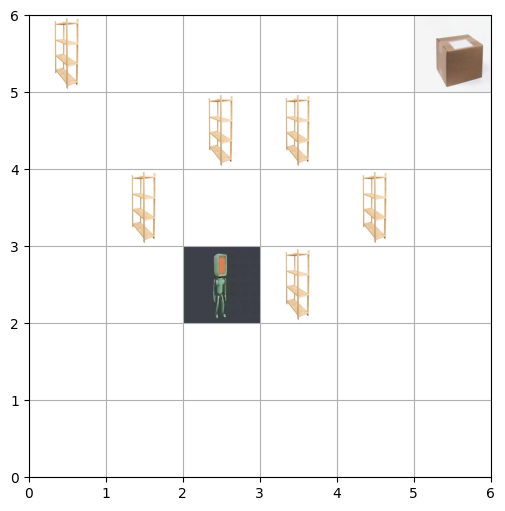

Step 4: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


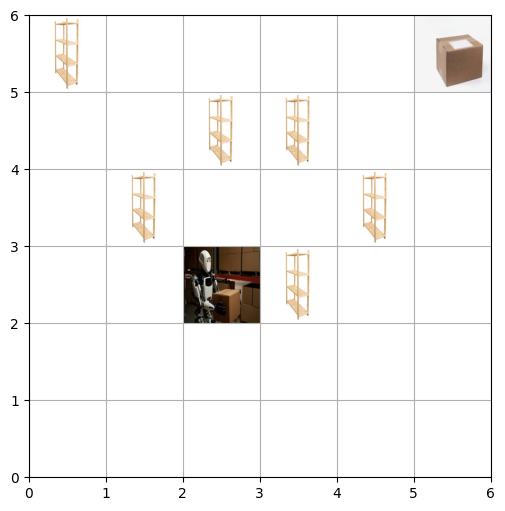

Step 5: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


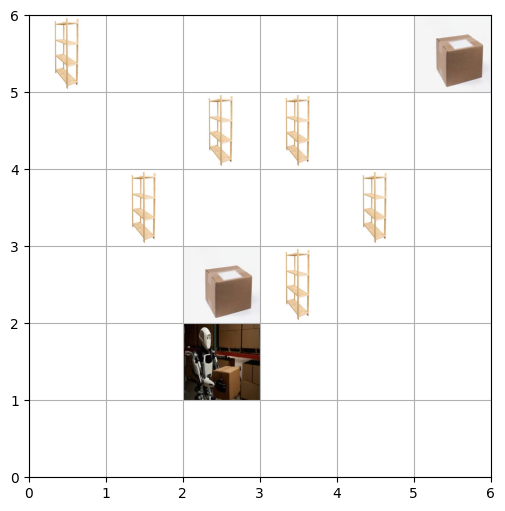

Step 6: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


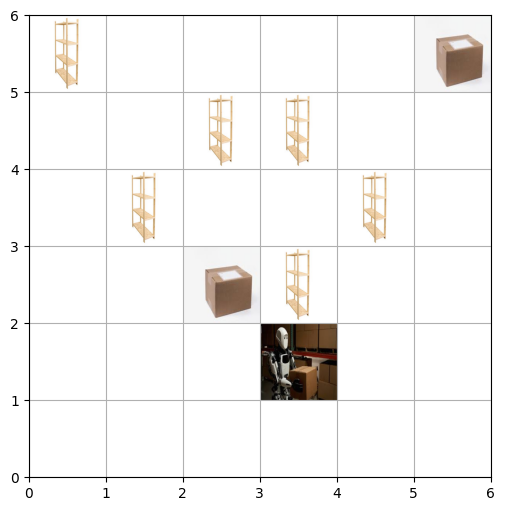

Step 7: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


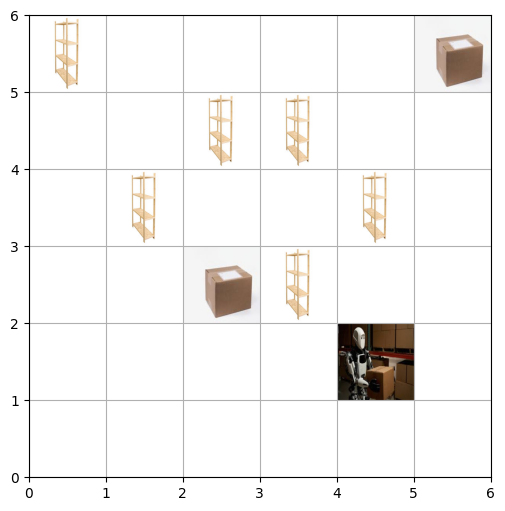

Step 8: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


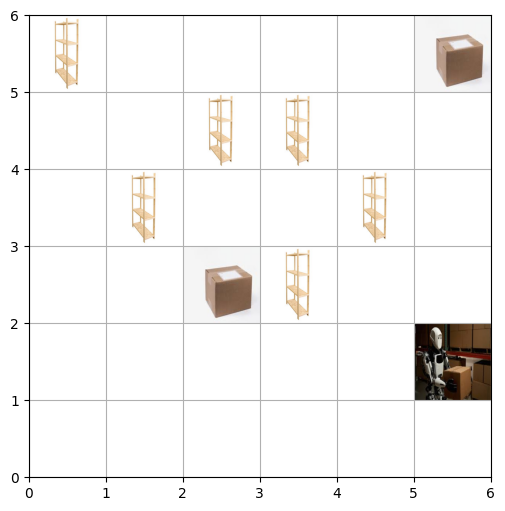

Step 9: Action=Up, Position=(5, 1), Carrying=True, Reward=-1


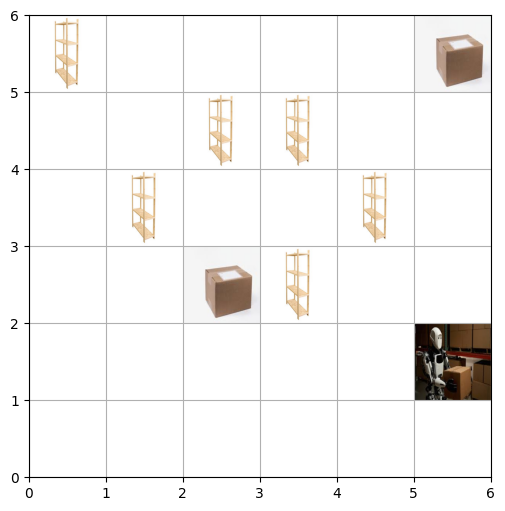

Step 10: Action=Up, Position=(5, 1), Carrying=True, Reward=-1


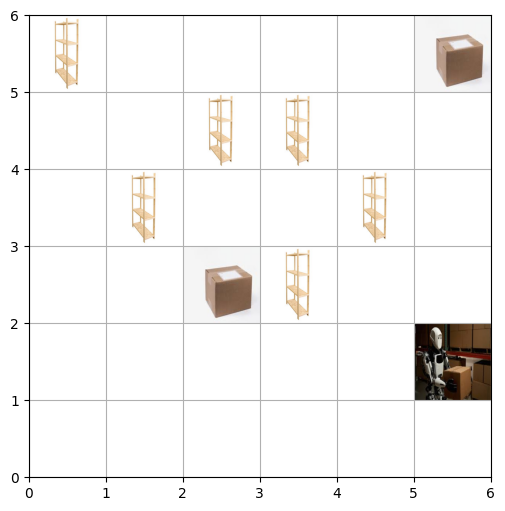

Step 11: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


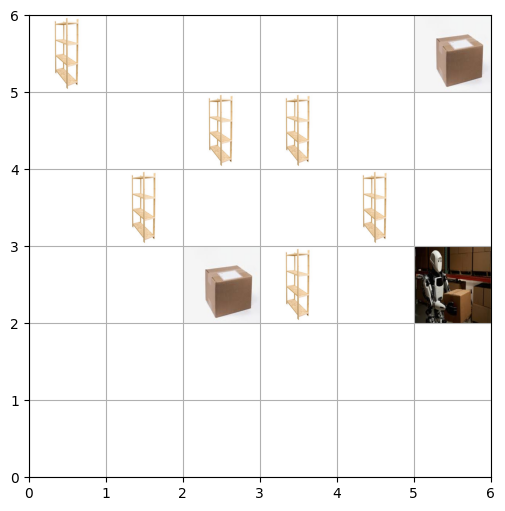

Step 12: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


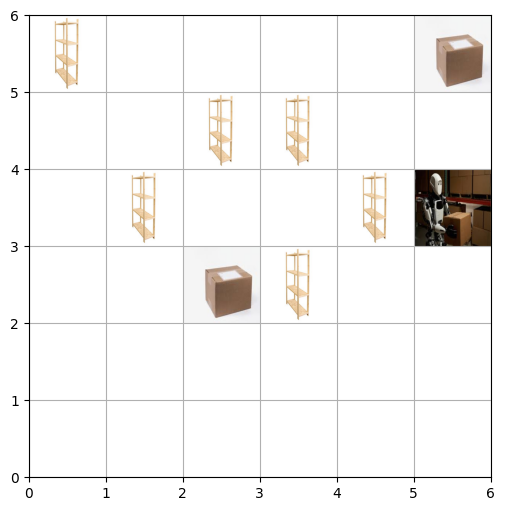

Step 13: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


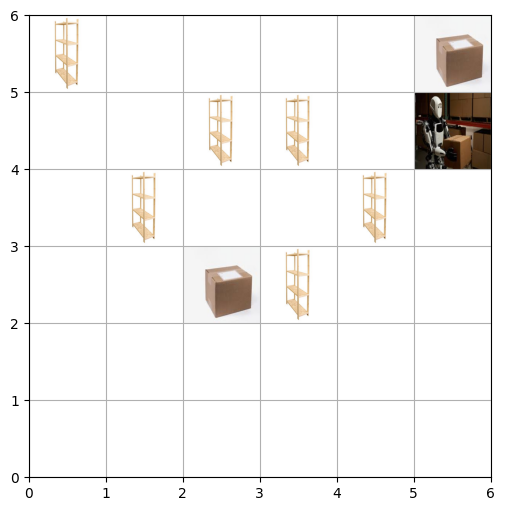

Step 14: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


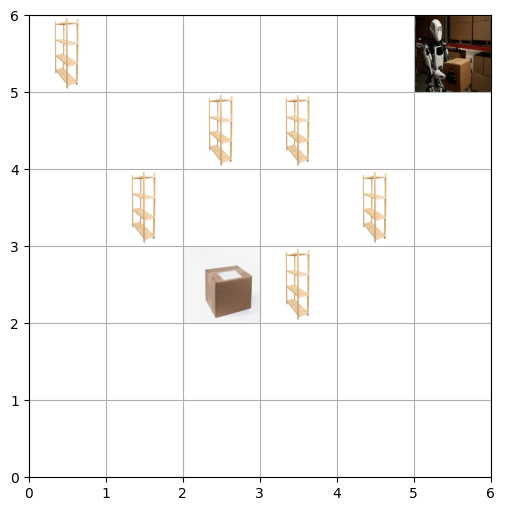

Step 15: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


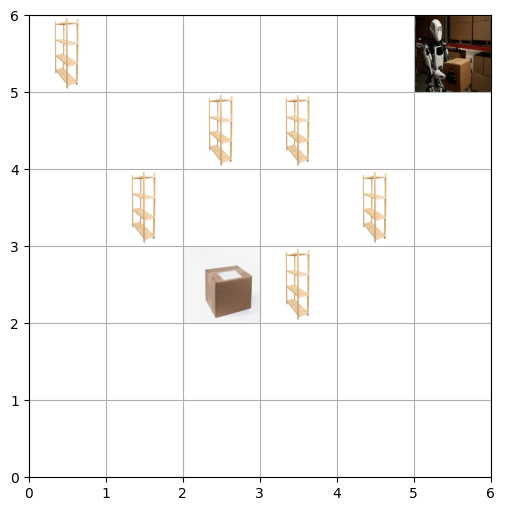

Episode 5: Task completed! Total Reward: 111
Step 0: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


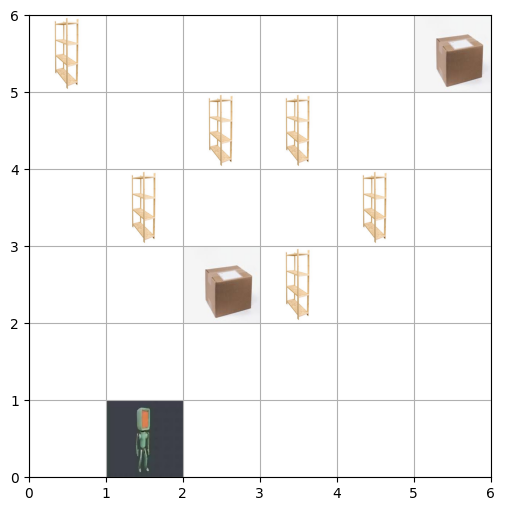

Step 1: Action=Up, Position=(1, 0), Carrying=False, Reward=-1


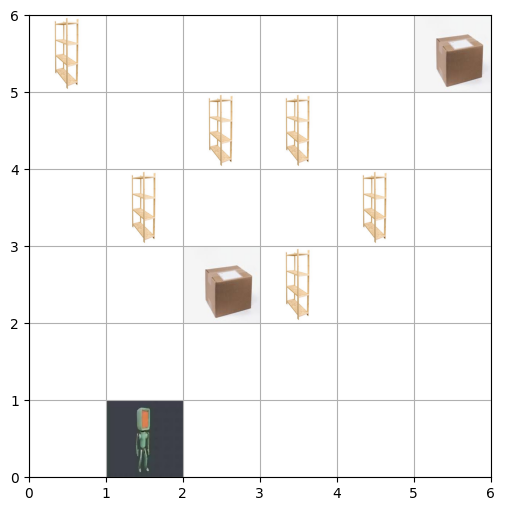

Step 2: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


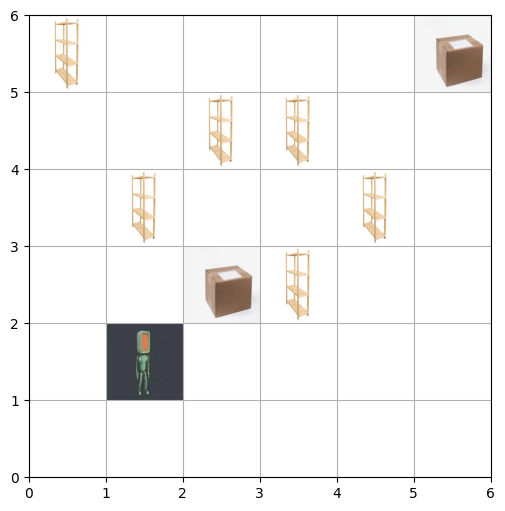

Step 3: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


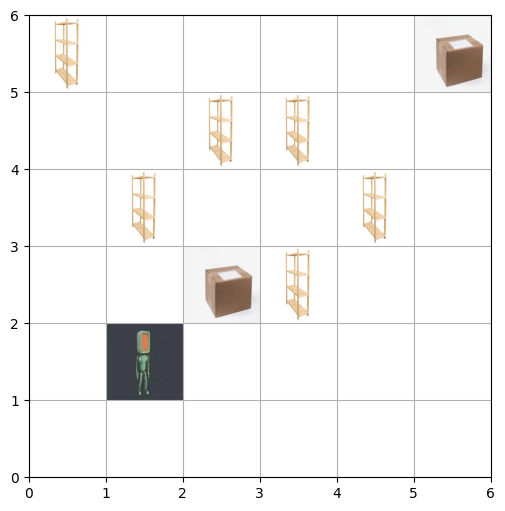

Step 4: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


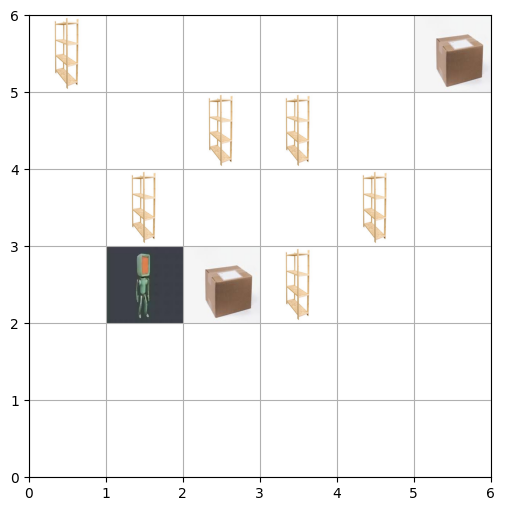

Step 5: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


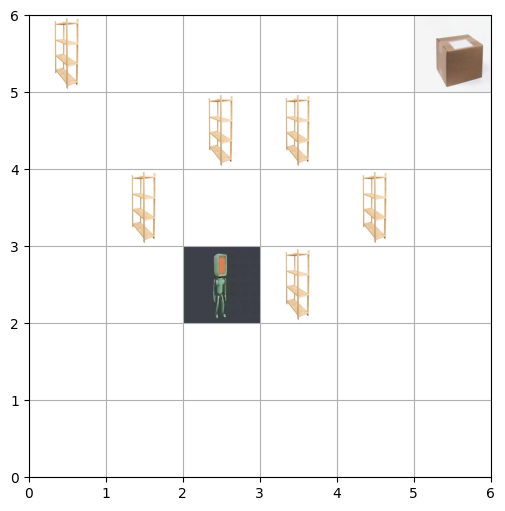

Step 6: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


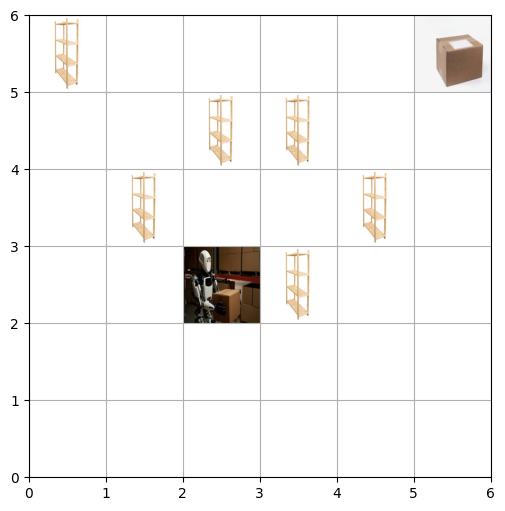

Step 7: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


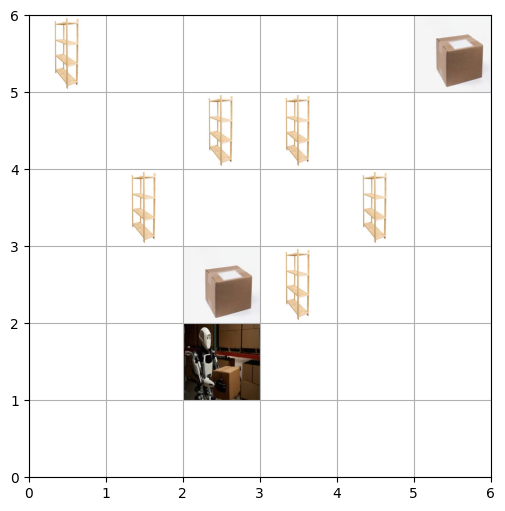

Step 8: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


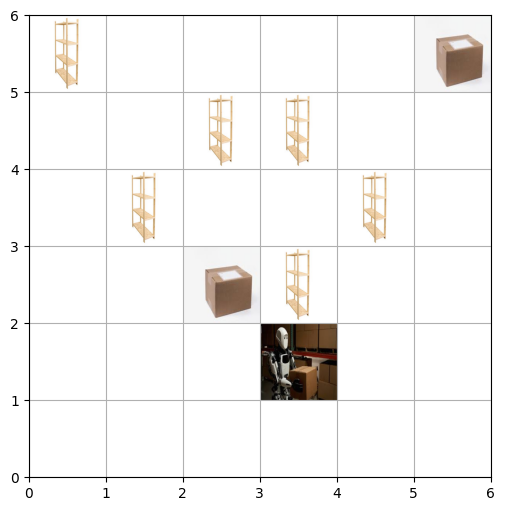

Step 9: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


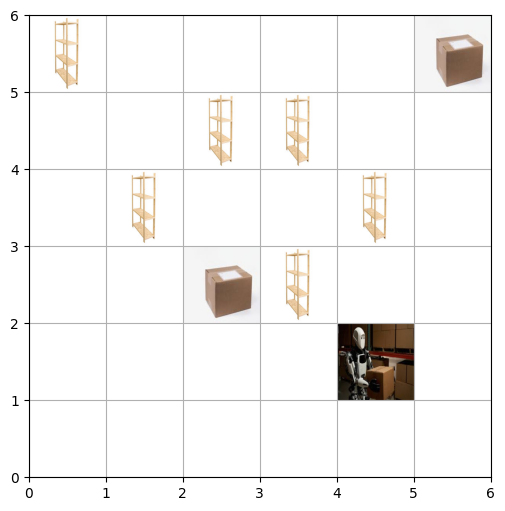

Step 10: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


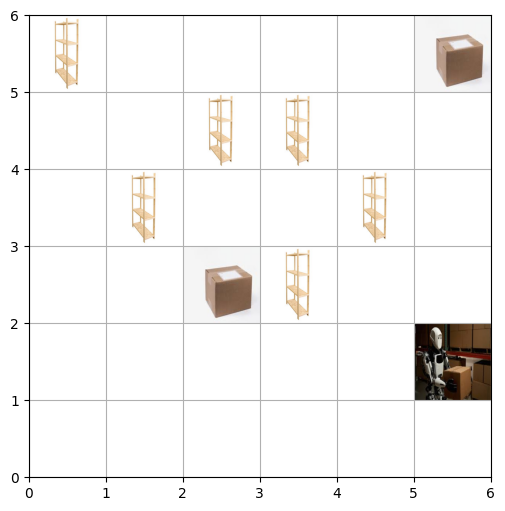

Step 11: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


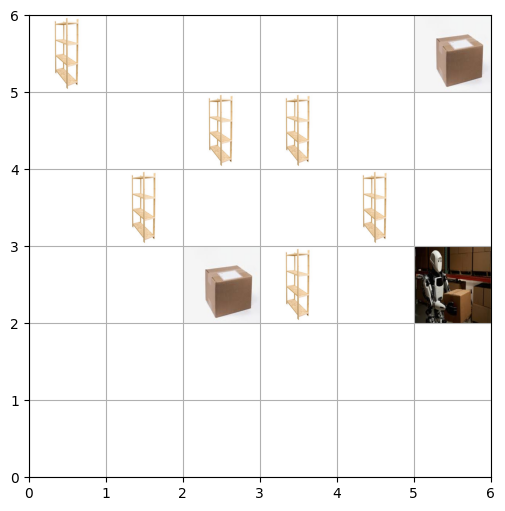

Step 12: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


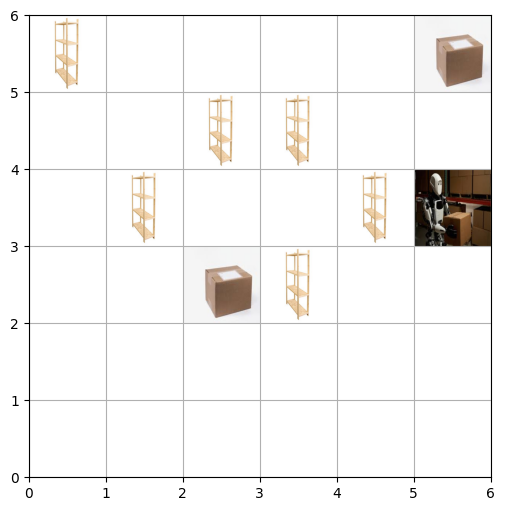

Step 13: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


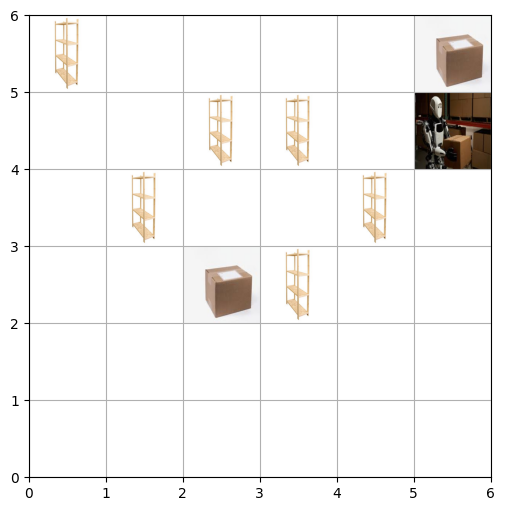

Step 14: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


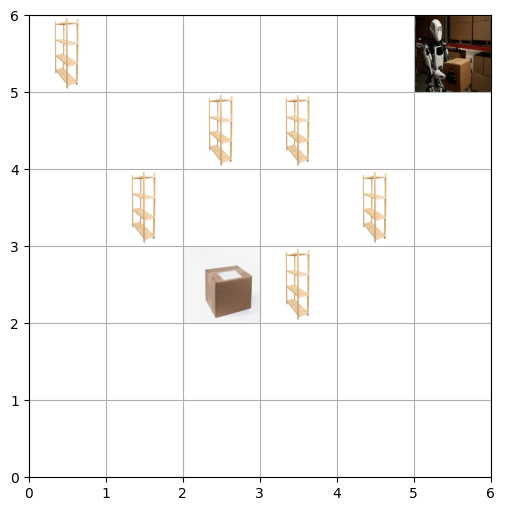

Step 15: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


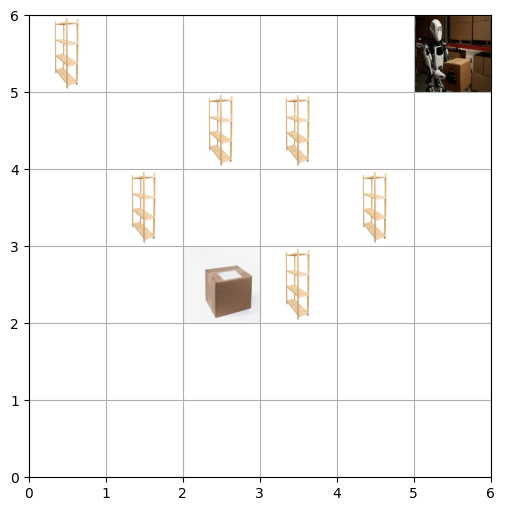

Episode 6: Task completed! Total Reward: 111
Step 0: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


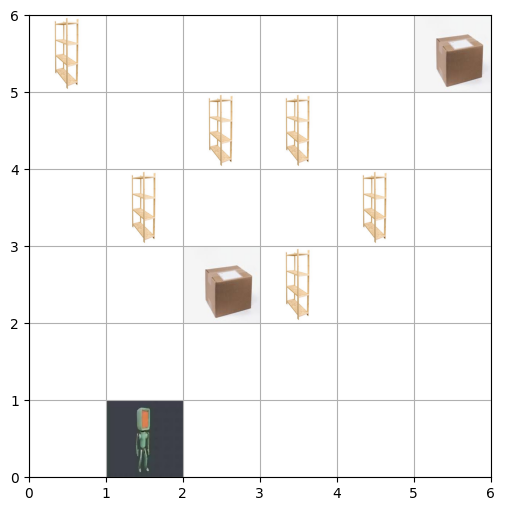

Step 1: Action=Up, Position=(1, 0), Carrying=False, Reward=-1


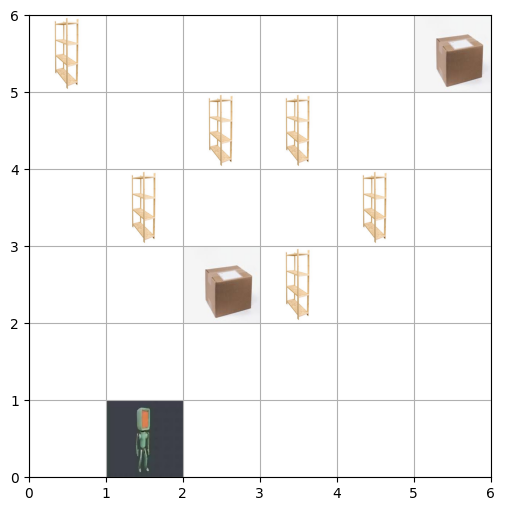

Step 2: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


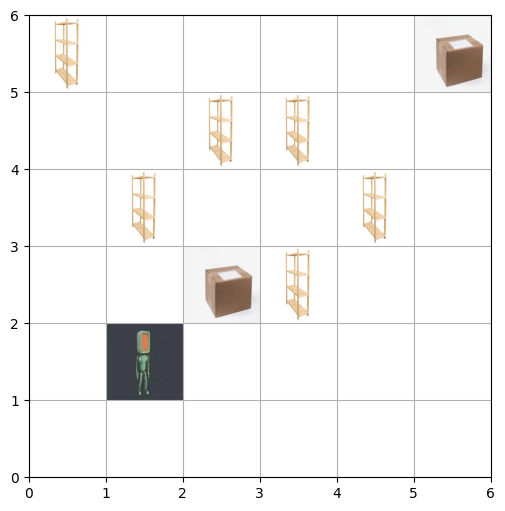

Step 3: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


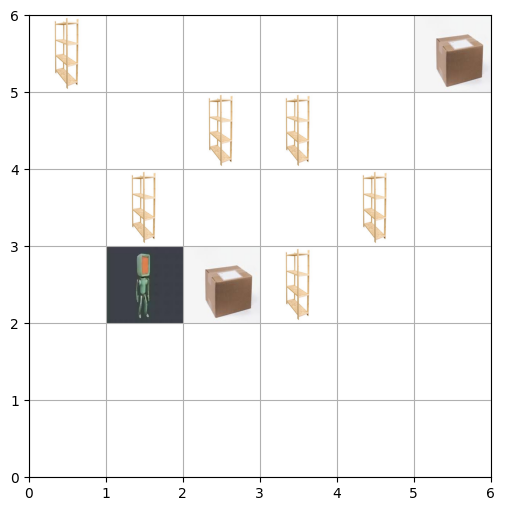

Step 4: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


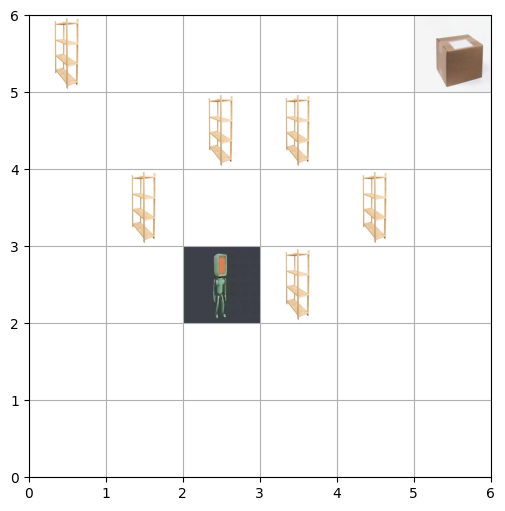

Step 5: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


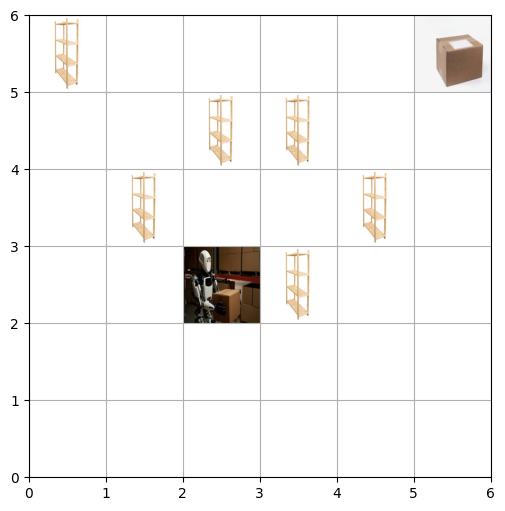

Step 6: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


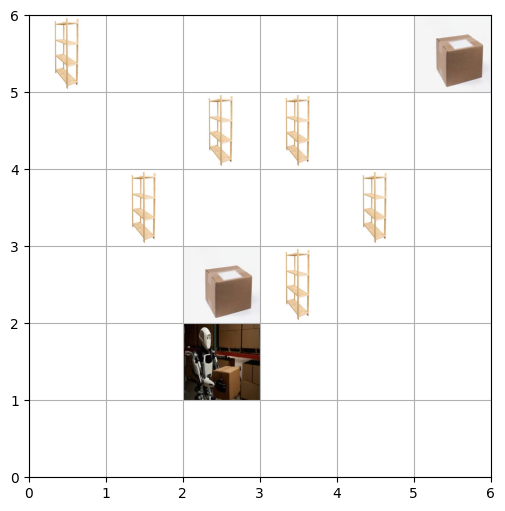

Step 7: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


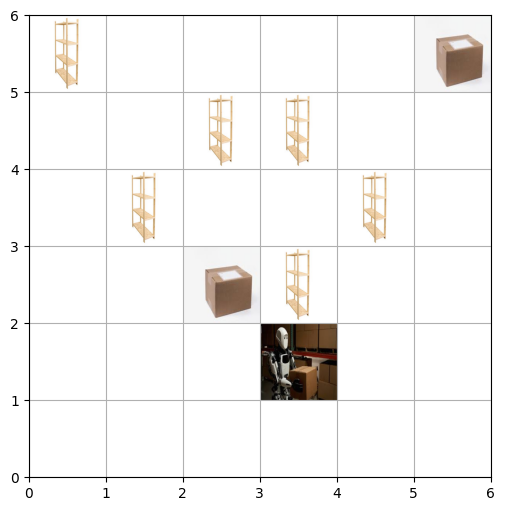

Step 8: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


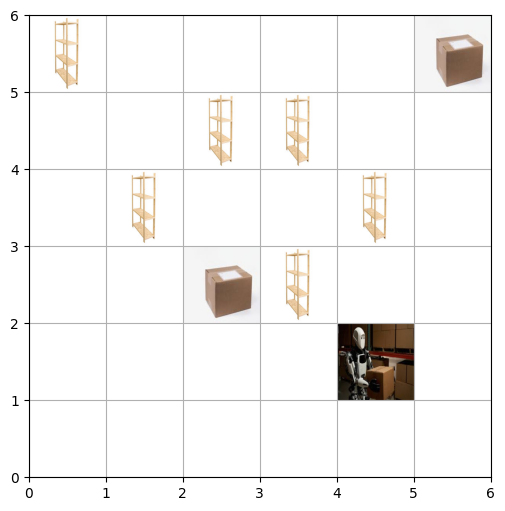

Step 9: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


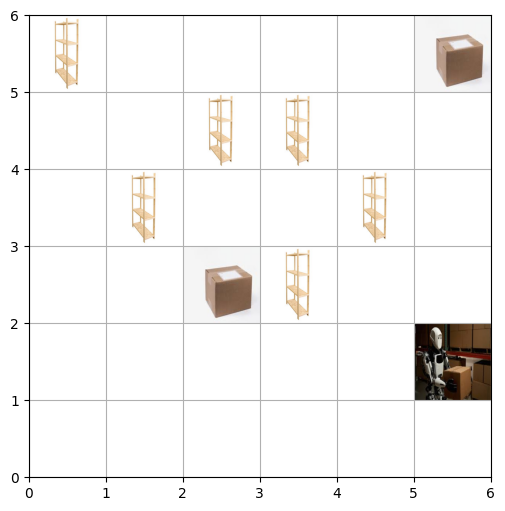

Step 10: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


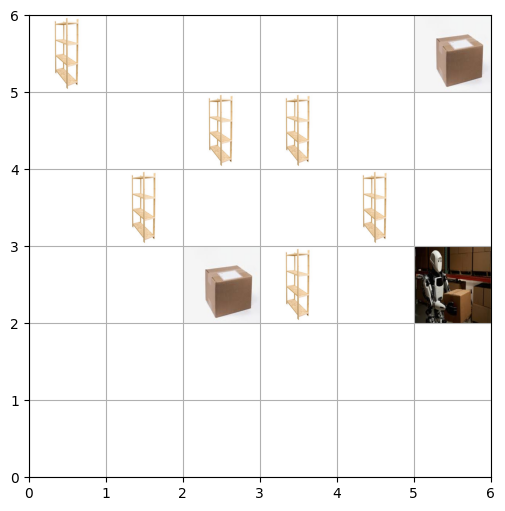

Step 11: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


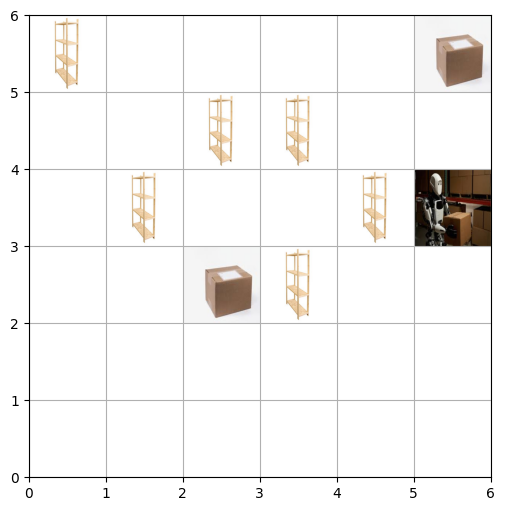

Step 12: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


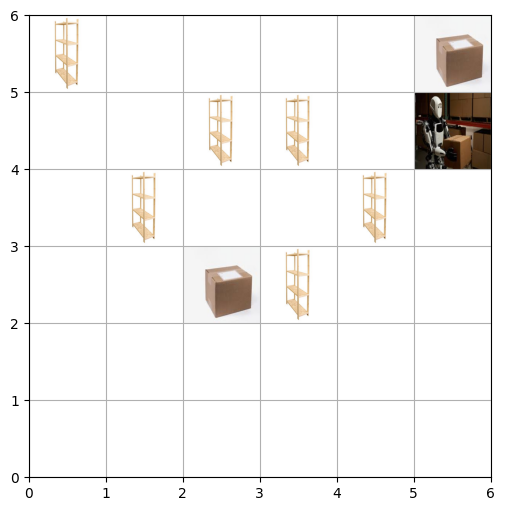

Step 13: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


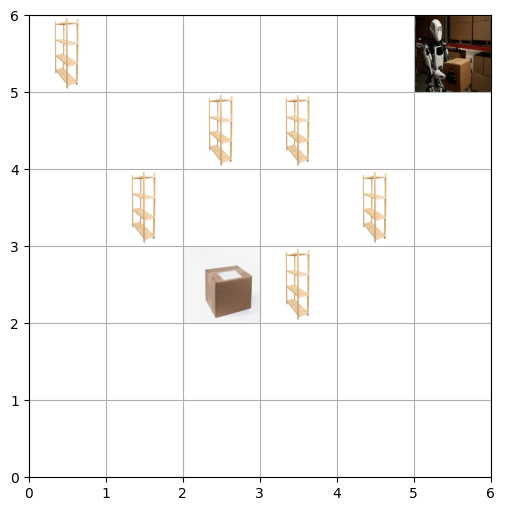

Step 14: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


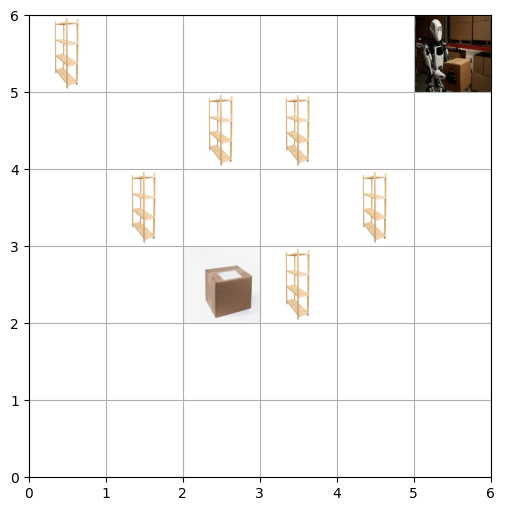

Episode 7: Task completed! Total Reward: 112
Step 0: Action=Right, Position=(0, 0), Carrying=False, Reward=-1


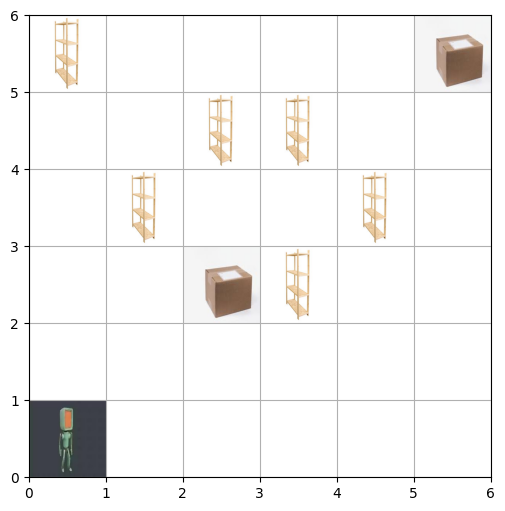

Step 1: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


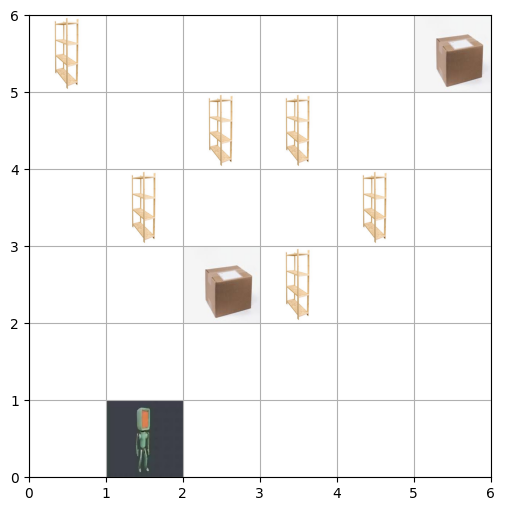

Step 2: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


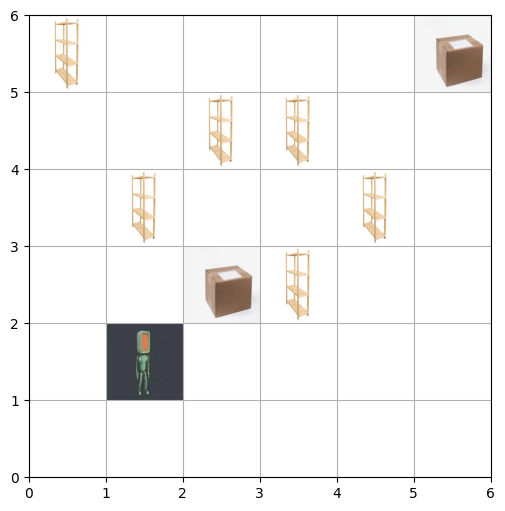

Step 3: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


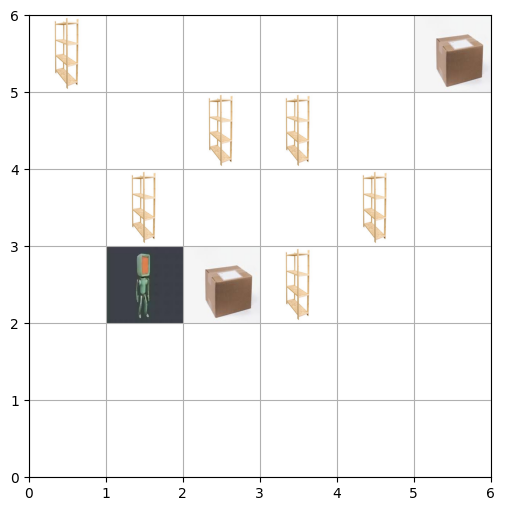

Step 4: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


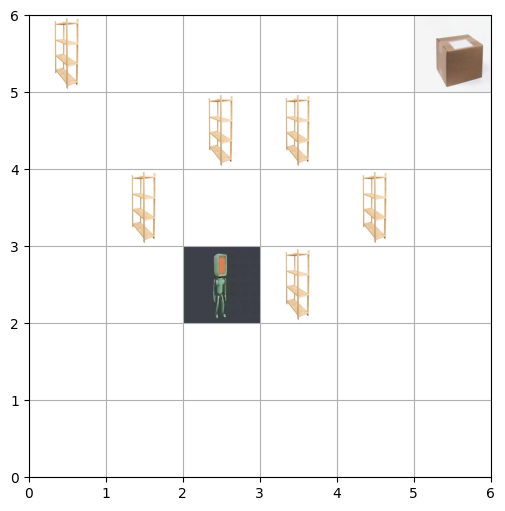

Step 5: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


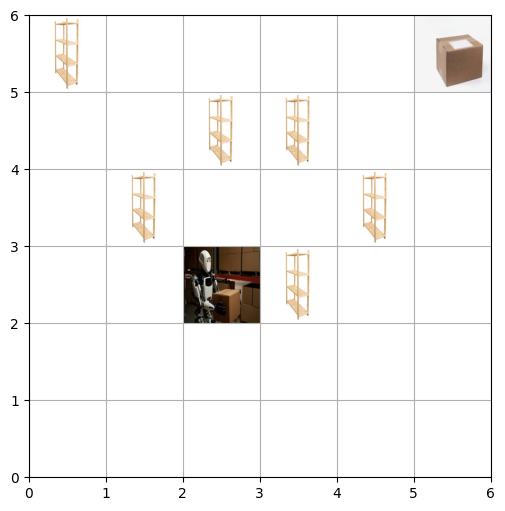

Step 6: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


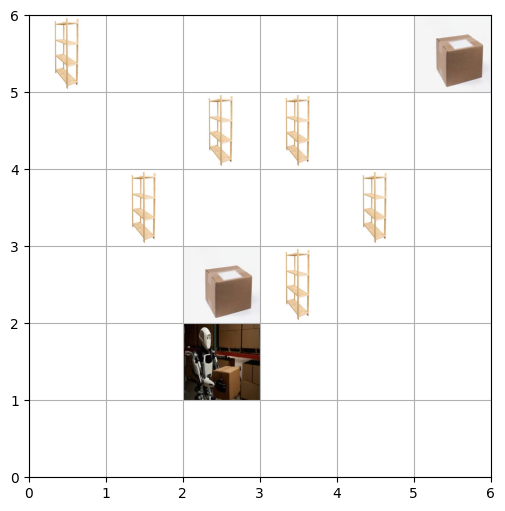

Step 7: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


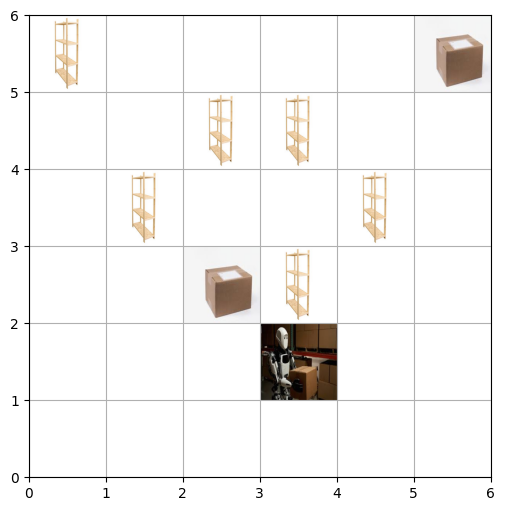

Step 8: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


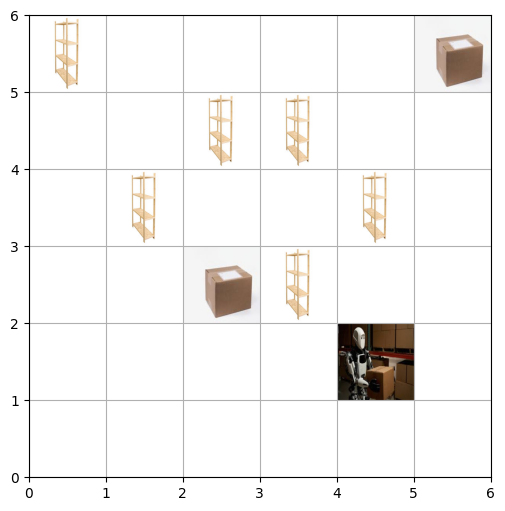

Step 9: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


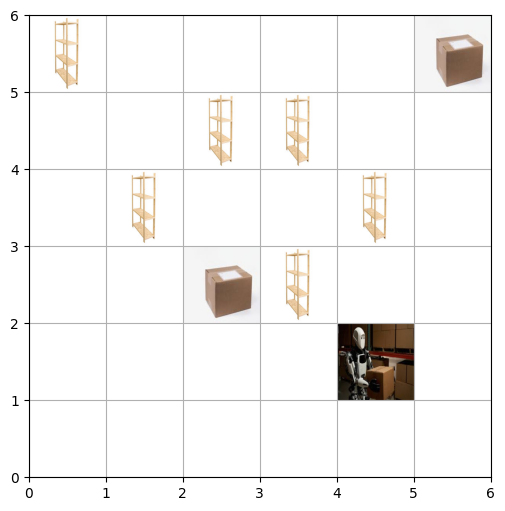

Step 10: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


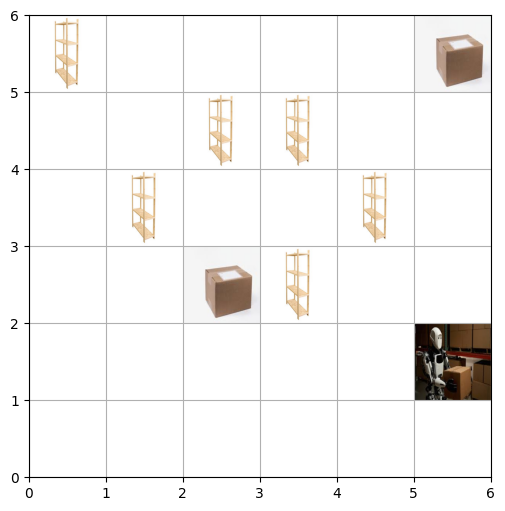

Step 11: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


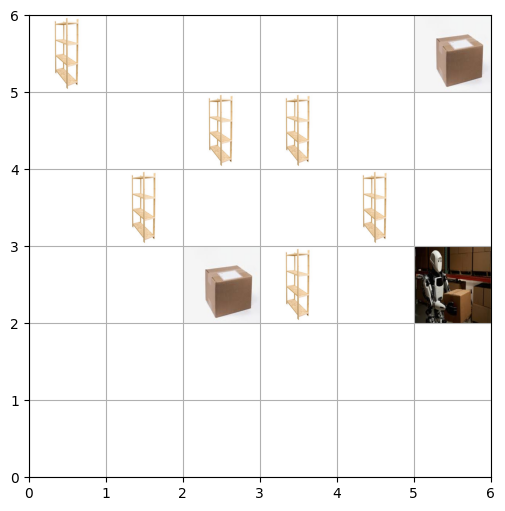

Step 12: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


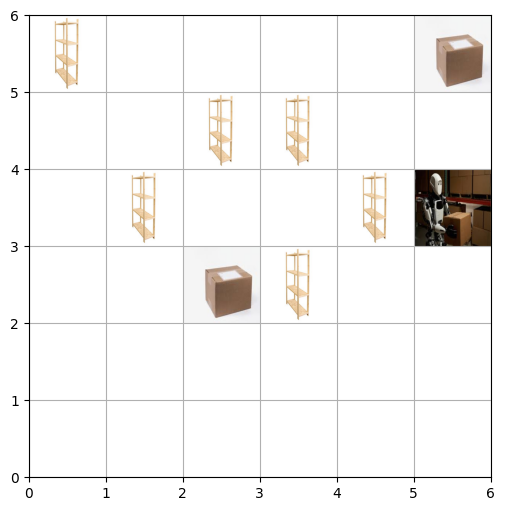

Step 13: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


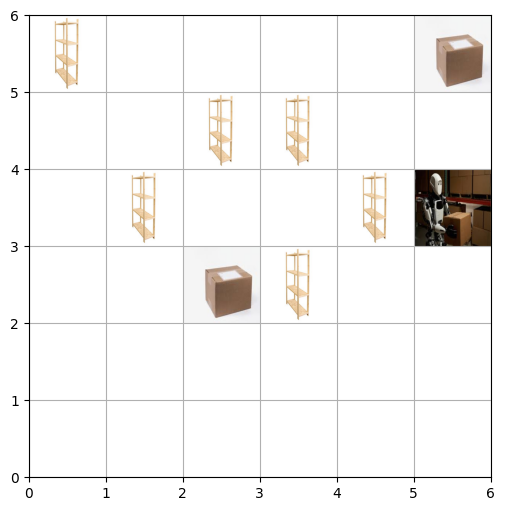

Step 14: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


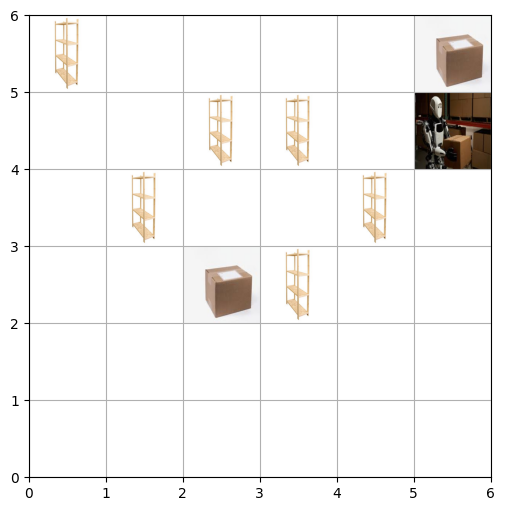

Step 15: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


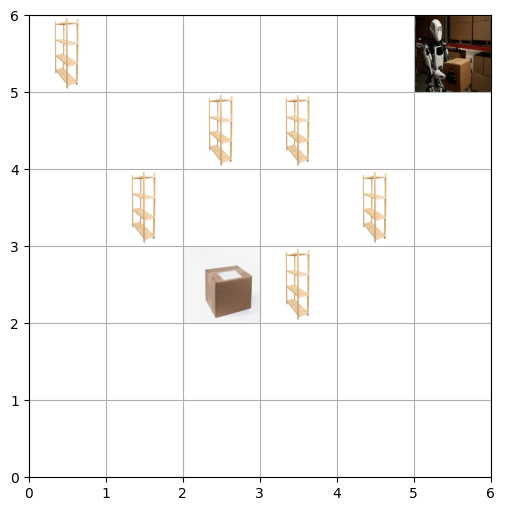

Step 16: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


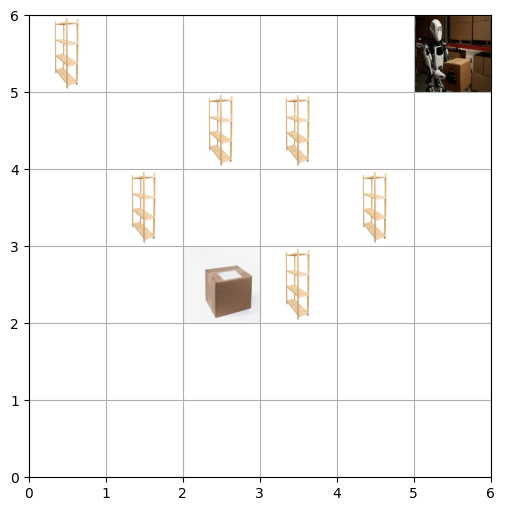

Episode 8: Task completed! Total Reward: 110
Step 0: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


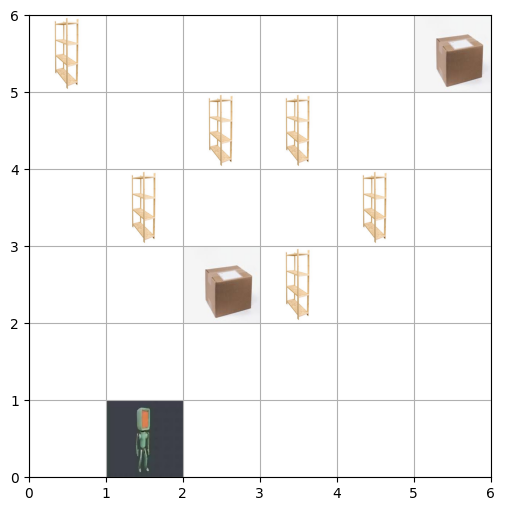

Step 1: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


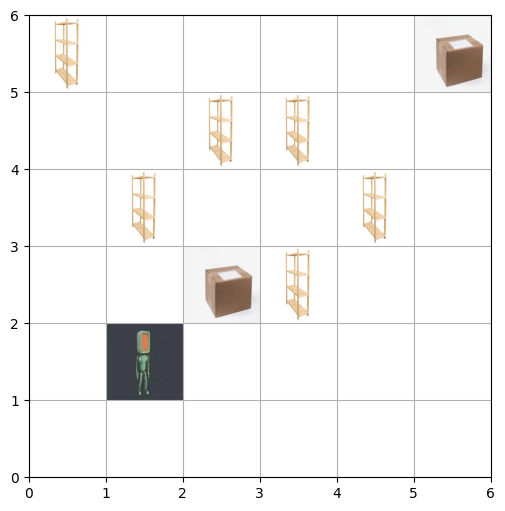

Step 2: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


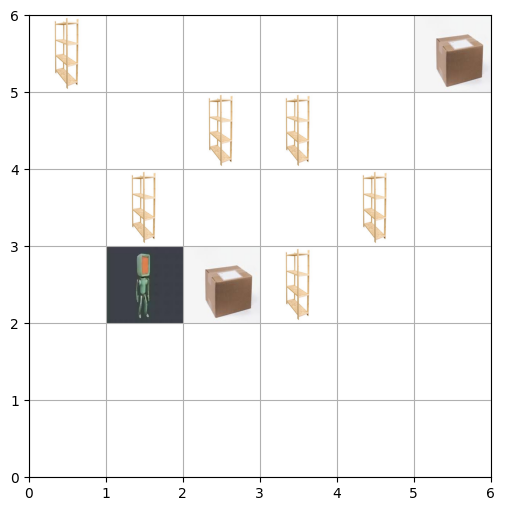

Step 3: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


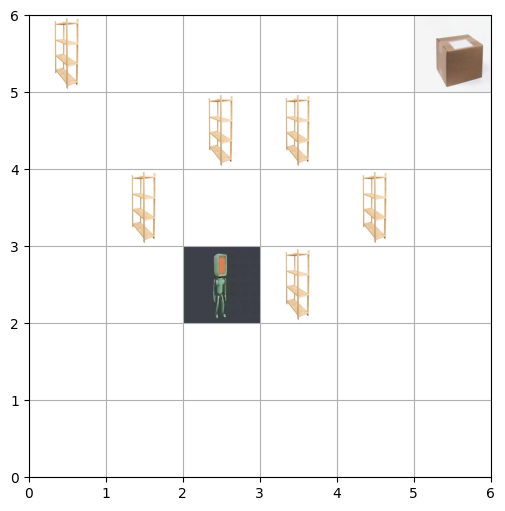

Step 4: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


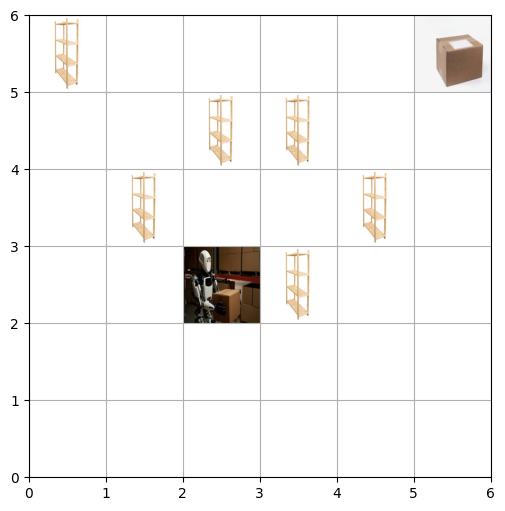

Step 5: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


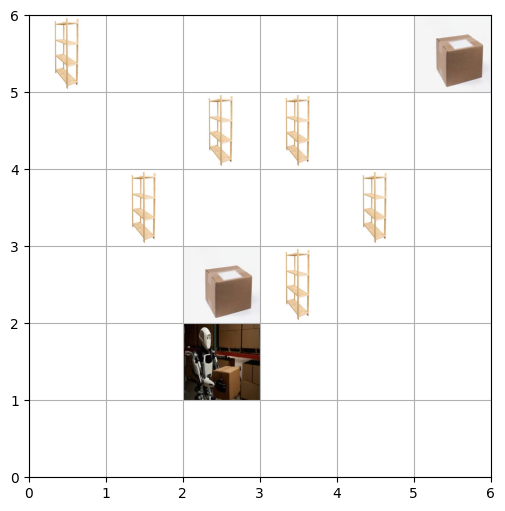

Step 6: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


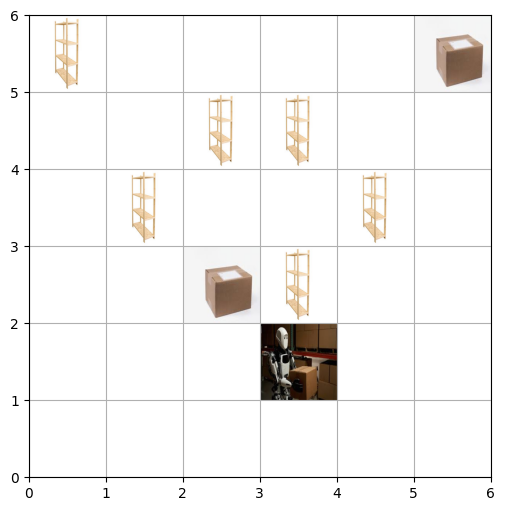

Step 7: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


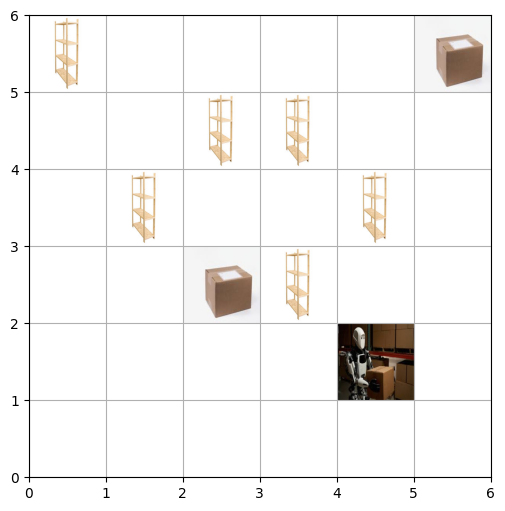

Step 8: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


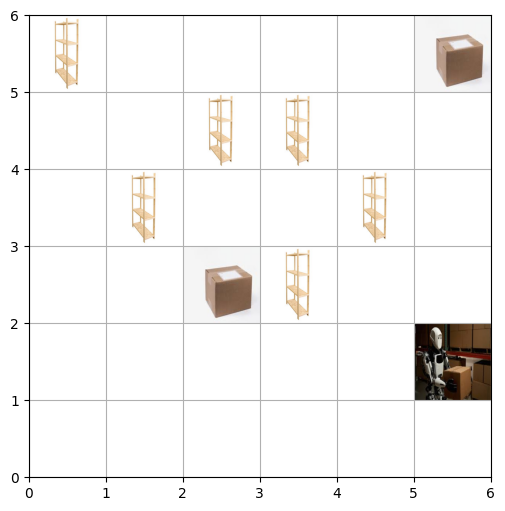

Step 9: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


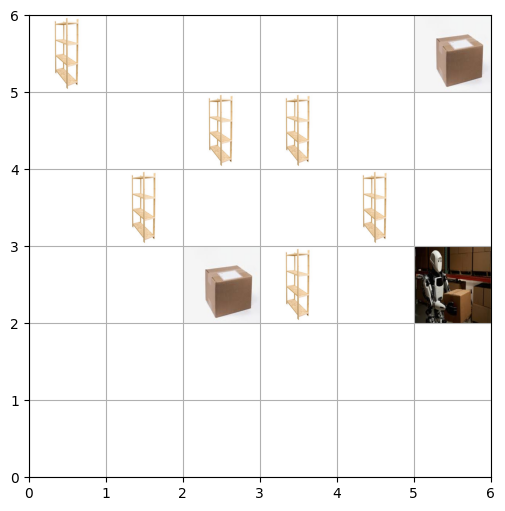

Step 10: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


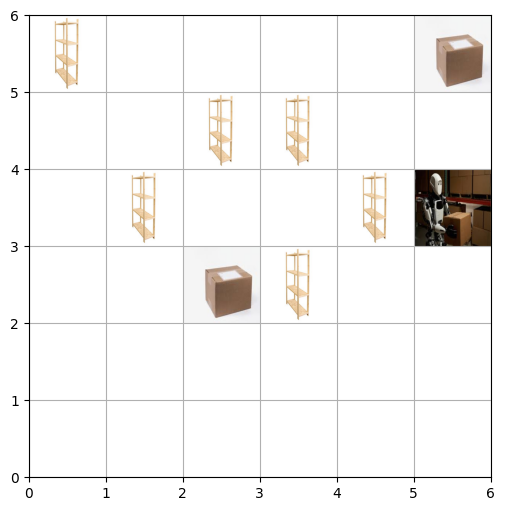

Step 11: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


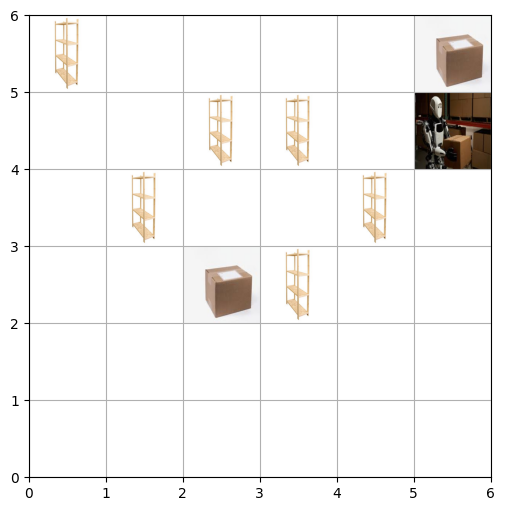

Step 12: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


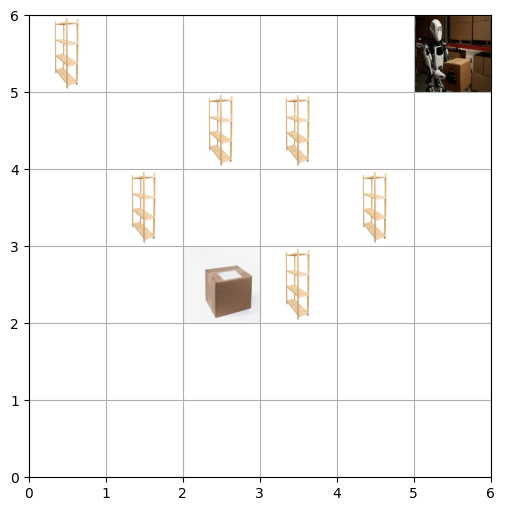

Step 13: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


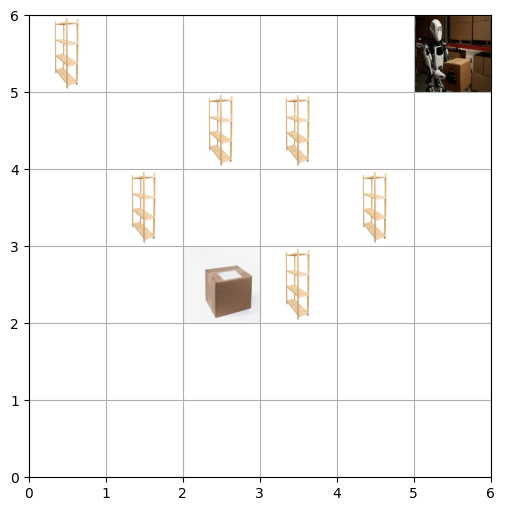

Episode 9: Task completed! Total Reward: 113
Step 0: Action=Right, Position=(1, 0), Carrying=False, Reward=-1


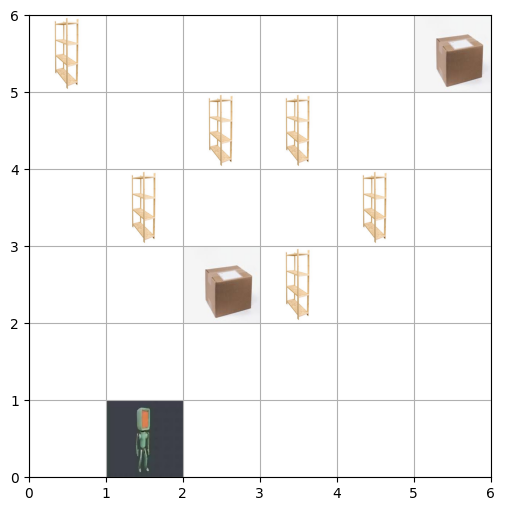

Step 1: Action=Up, Position=(1, 1), Carrying=False, Reward=-1


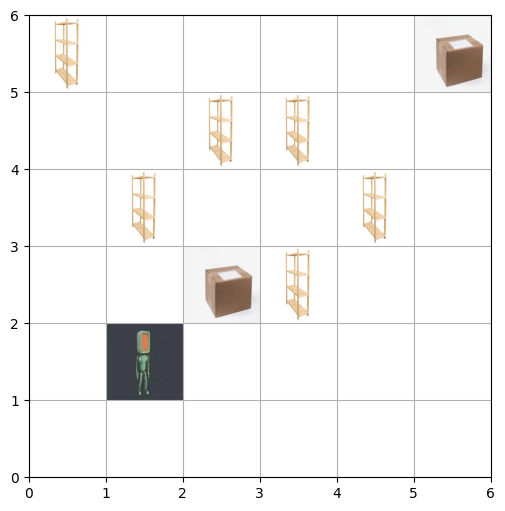

Step 2: Action=Up, Position=(1, 2), Carrying=False, Reward=-1


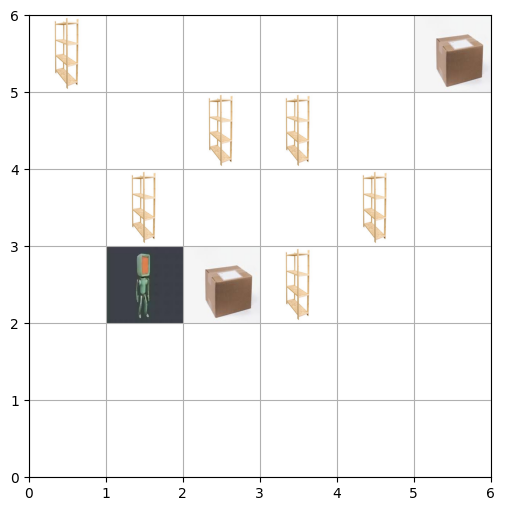

Step 3: Action=Right, Position=(2, 2), Carrying=False, Reward=-1


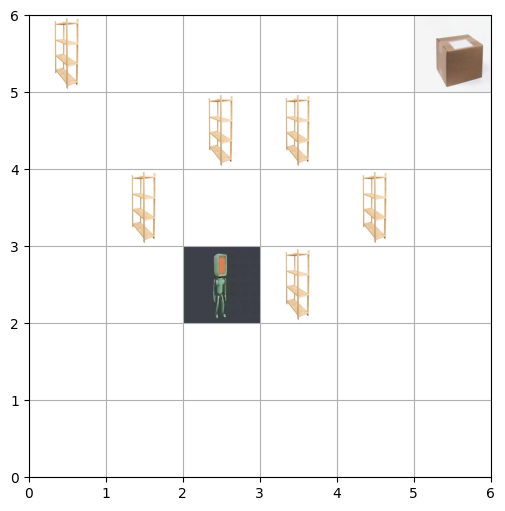

Step 4: Action=Pick-up, Position=(2, 2), Carrying=True, Reward=25


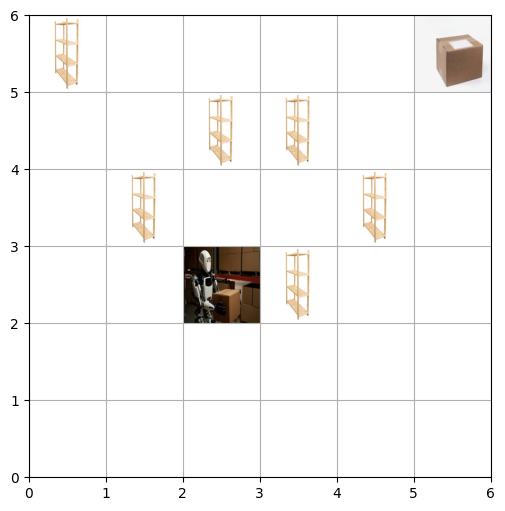

Step 5: Action=Down, Position=(2, 1), Carrying=True, Reward=-1


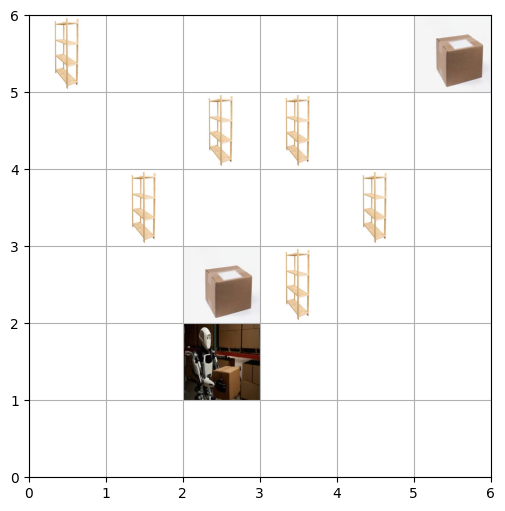

Step 6: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


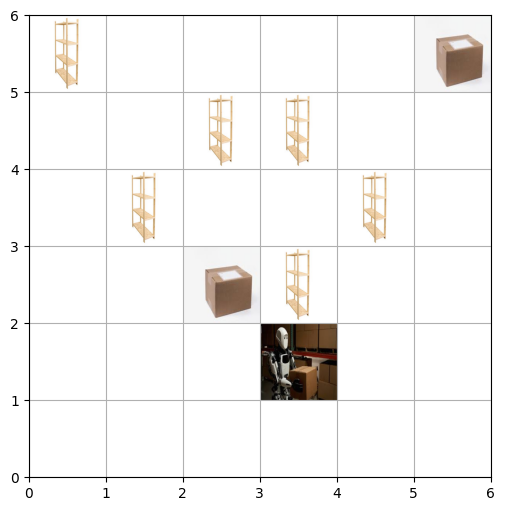

Step 7: Action=Right, Position=(3, 1), Carrying=True, Reward=-1


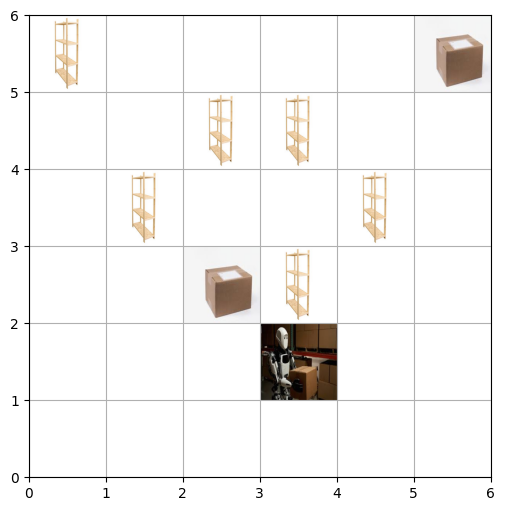

Step 8: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


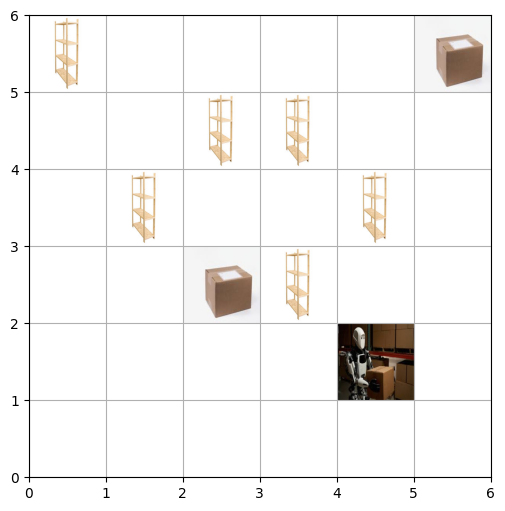

Step 9: Action=Right, Position=(4, 1), Carrying=True, Reward=-1


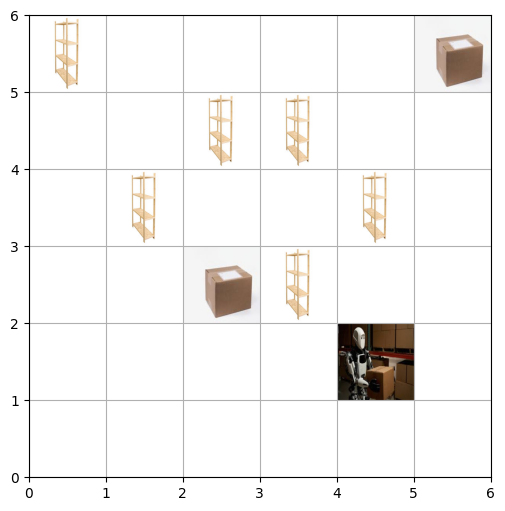

Step 10: Action=Right, Position=(5, 1), Carrying=True, Reward=-1


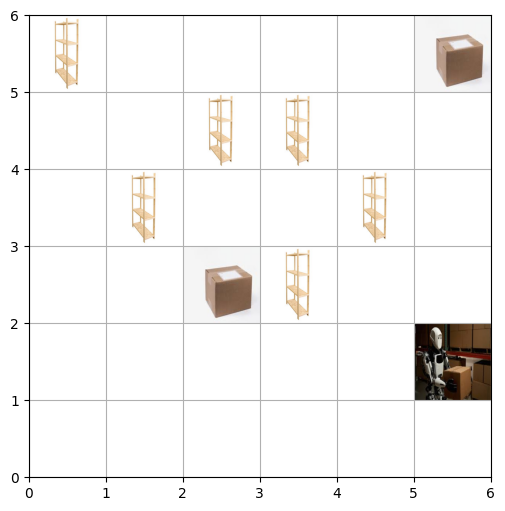

Step 11: Action=Up, Position=(5, 2), Carrying=True, Reward=-1


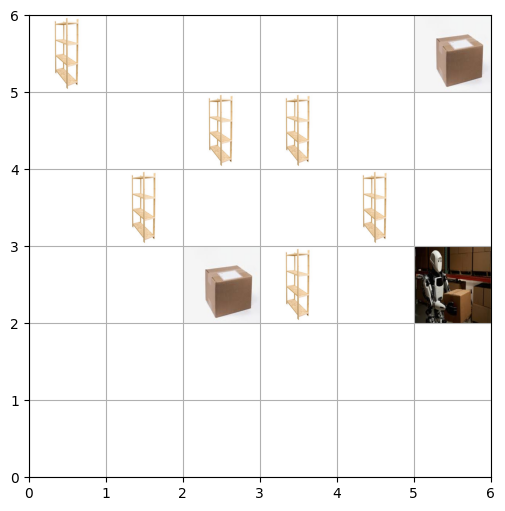

Step 12: Action=Up, Position=(5, 3), Carrying=True, Reward=-1


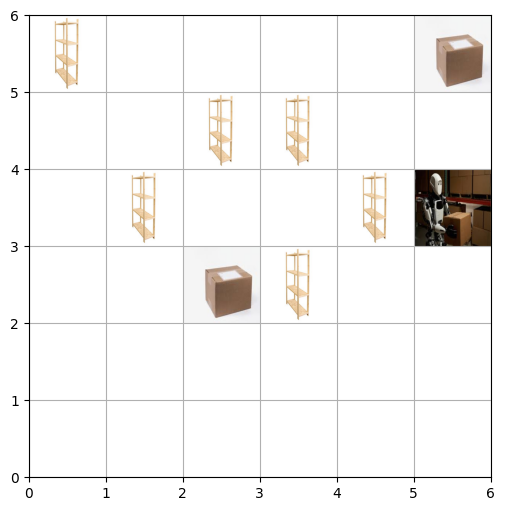

Step 13: Action=Up, Position=(5, 4), Carrying=True, Reward=-1


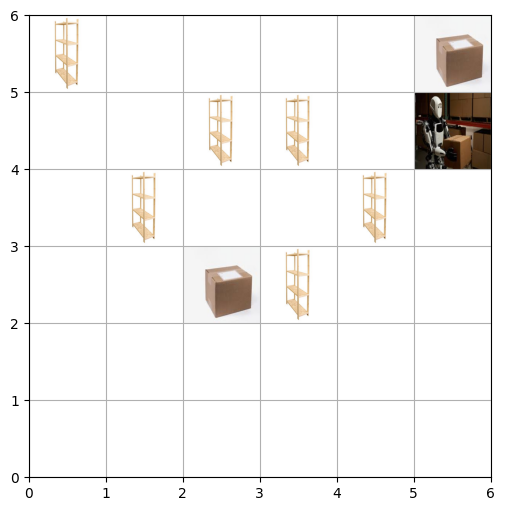

Step 14: Action=Up, Position=(5, 5), Carrying=True, Reward=-1


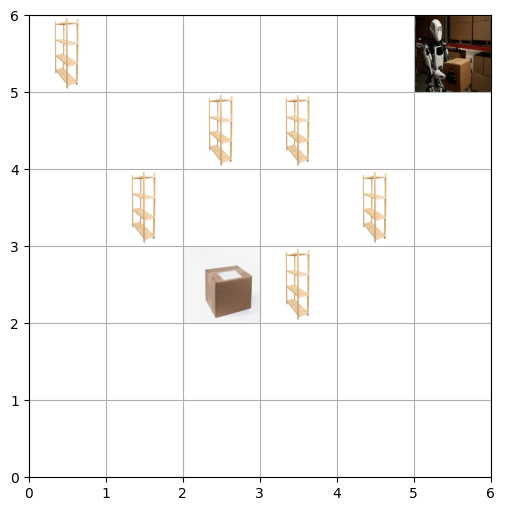

Step 15: Action=Drop-off, Position=(5, 5), Carrying=True, Reward=100


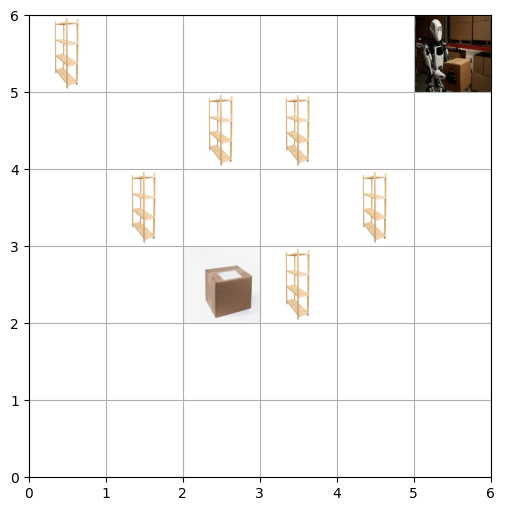

Episode 10: Task completed! Total Reward: 111


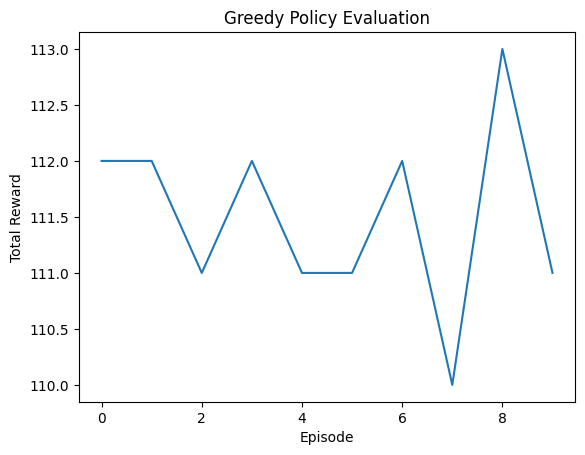

In [44]:
def test_agent(num_episodes=10):
    """Test the trained agent."""
    rewards_per_episode = []
    
    for episode in range(num_episodes):
        state = tuple(env.reset())
        total_reward = 0
        done = False
        step = 0
        
        while not done:
            action = np.argmax(Q[state])  # Choose the best learned action
            next_state, reward, done, _ = env.step(action)
            state = tuple(next_state)
            total_reward += reward
            print(f"Step {step}: Action={mapped_actions[action]}, Position={state[:2]}, Carrying={bool(state[2])}, Reward={reward}")
            env.render()
            step += 1
            
            if done:
                print(f"Episode {episode + 1}: Task completed! Total Reward: {total_reward}")
                break
        rewards_per_episode.append(total_reward)
    
    # Plot the total reward per episode during greedy evaluation
    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Greedy Policy Evaluation')
    plt.show()

test_agent()
